# ML DATA CLEANING AND FEATURE SELECTION


Name: Sai Pranavi Jeedigunta

NUID: 002415588

# Abstract

This dataset comprises nutritional information for a range of fast food items, with a focus on calorie content. The dataset includes features such as fat content, sodium levels, and vitamin percentages, along with the calorie count for each item. Each entry represents a distinct fast food item, providing detailed information about its nutritional composition. The dataset is designed to facilitate analysis and modeling related to calorie intake in fast food, offering insights into the nutritional profiles of common fast food items. The code implements a machine learning pipeline using the H2O framework for analyzing a dataset containing fast food nutritional information. The dataset is preprocessed to handle missing values and multicollinearity. A linear regression model is trained to predict the calorie content of fast food items based on various nutritional attributes. The model's performance is evaluated using regression metrics and visualizations. Additionally, the code demonstrates the use of Ridge regularization and variable importance analysis. Overall, the code provides a comprehensive analysis of the dataset and showcases the capabilities of the H2O framework for machine learning tasks.

# Variable Description

restaurant: The fast food restaurants.

item: The list of food items available at the fast food restaurants.

calories: The amount of calories in each item.

cal_fat: The amount of calories from fat in each item.

total_fat: The amount of total fat in each item.

sat_fat: The amount of saturated fat in each item.

trans_fat: The amount of trans fat in each item.

cholesterol: The amount of cholestrol in each item.

sodium: The amount of sodium in each item.

total_carb: The amount of total carbohydrated in each item.

fiber: The amount of fiber in each item.

sugar: The amount of sugar in each item.

protein: The amount of protien in each item.

vit_a: The amount of Vitamin A in each item.

vit_c: The amount of Vitamin C in each item.

calcium: The amount of Calcium in each item.

salad: Determines if the item is a salad or not.

# Installing Dependencies

In [ ]:
#installing dependencies
!pip install eli5

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier

#Import Libraries

# Data Manipulation
!pip install fitter
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler
from fitter import Fitter, get_common_distributions, get_distributions
import scipy.stats as stats

# Data Visualization
!pip install shap
import seaborn as sns
import matplotlib.pyplot as plt
import shap

shap.initjs()

# Figure Size
plt.figure(figsize=(18, 14), dpi=80)
sns.set(rc={"figure.figsize": (18, 14)})

# Data Imputation
!pip install fancyimpute
from fancyimpute import IterativeImputer as MICE
from fancyimpute import KNN

# Modeling
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import ExtraTreesRegressor, GradientBoostingRegressor
from sklearn.inspection import permutation_importance


  Using cached shap-0.45.0-cp310-cp310-manylinux_2_12_x86_64.manylinux2010_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (538 kB)
  Using cached slicer-0.0.7-py3-none-any.whl (14 kB)


  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 2.3 MB/s eta 0:00:00
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29881 sha256=3b066198ea117ef8ec7bbd39bc1b3597ca3bf1ba53a06ae2b1d12b78cfb73e94
  Stored in directory: /root/.cache/pip/wheels/7b/0c/d3/ee82d1fbdcc0858d96434af108608d01703505d453720c84ed
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11330 sha256=e47a966b05cdb1d1f7339bf0dee6353f16b90e2aaa7c4563e10dd18b084ebab7
  Stored in directory: /root/.cache/pip/wheels/46/06/a5/45a724630562413c374e29c08732411d496092408b3a7bf754
Successfully built fancyimpute knnimpute


<Figure size 1440x1120 with 0 Axes>

# Reading and Studying the Data

In [ ]:
#Reading the fastfood dataset
data = pd.read_csv("https://raw.githubusercontent.com/SaiPranaviJeedigunta/DEMG_assignments/main/DSEM_0022415588/fastfood.csv")

In [ ]:
#Viewing data in the file
data.head()

,restaurant,item,calories,cal_fat,total_fat,sat_fat,trans_fat,cholesterol,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium,salad
0,Mcdonalds,Artisan Grilled Chicken Sandwich,380,60,7,2.0,0.0,95,1110,44,3.0,11,37.0,4.0,20.0,20.0,Other
1,Mcdonalds,Single Bacon Smokehouse Burger,840,410,45,17.0,1.5,130,1580,62,2.0,18,46.0,6.0,20.0,20.0,Other
2,Mcdonalds,Double Bacon Smokehouse Burger,1130,600,67,27.0,3.0,220,1920,63,3.0,18,70.0,10.0,20.0,50.0,Other
3,Mcdonalds,Grilled Bacon Smokehouse Chicken Sandwich,750,280,31,10.0,0.5,155,1940,62,2.0,18,55.0,6.0,25.0,20.0,Other
4,Mcdonalds,Crispy Bacon Smokehouse Chicken Sandwich,920,410,45,12.0,0.5,120,1980,81,4.0,18,46.0,6.0,20.0,20.0,Other


In [ ]:
# Categorical or Numerical Coloumns
categorical_columns = [
    col for col in data.columns if data[col].dtype == "object"
]
print("Categorical Columns : ", categorical_columns)

categorical_columns = list(set(categorical_columns))

numerical_columns = [col for col in data.columns if col not in categorical_columns]
print("\n")
print("Numerical Columns : ", numerical_columns)

Categorical Columns :  ['restaurant', 'item', 'salad']


Numerical Columns :  ['calories', 'cal_fat', 'total_fat', 'sat_fat', 'trans_fat', 'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium']


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515 entries, 0 to 514
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   restaurant   515 non-null    object 
 1   item         515 non-null    object 
 2   calories     515 non-null    int64  
 3   cal_fat      515 non-null    int64  
 4   total_fat    515 non-null    int64  
 5   sat_fat      515 non-null    float64
 6   trans_fat    515 non-null    float64
 7   cholesterol  515 non-null    int64  
 8   sodium       515 non-null    int64  
 9   total_carb   515 non-null    int64  
 10  fiber        503 non-null    float64
 11  sugar        515 non-null    int64  
 12  protein      514 non-null    float64
 13  vit_a        301 non-null    float64
 14  vit_c        305 non-null    float64
 15  calcium      305 non-null    float64
 16  salad        515 non-null    object 
dtypes: float64(7), int64(7), object(3)
memory usage: 68.5+ KB


# Question 1: What are the data types? (Numeric and Categorical)

ANSWER:

Categorical Columns : ['restaurant', 'item', 'salad']

Numerical Columns : ['calories', 'cal_fat', 'total_fat', 'sat_fat', 'trans_fat', 'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium']

In [ ]:
num_cols = data._get_numeric_data().columns
num_cols, len(num_cols)

(Index(['calories', 'cal_fat', 'total_fat', 'sat_fat', 'trans_fat',
        'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein',
        'vit_a', 'vit_c', 'calcium'],
       dtype='object'),
 14)

In [ ]:
cat_cols = data.select_dtypes(include=['object']).columns.tolist()
cat_cols, len(cat_cols)

(['restaurant', 'item', 'salad'], 3)

# Question 5: Which independent variables have missing data? How much?

In [ ]:
#checking if the any data is missing
data.isnull().sum()

restaurant       0
item             0
calories         0
cal_fat          0
total_fat        0
sat_fat          0
trans_fat        0
cholesterol      0
sodium           0
total_carb       0
fiber           12
sugar            0
protein          1
vit_a          214
vit_c          210
calcium        210
salad            0
dtype: int64

Answer: Five independent variables have missing data. They are:
1. fiber - 12
2. protein - 1
3. vit_a - 214
4. vit_c - 210
5. calcium - 210


# Question 2: Are there any Missing Values

Yes, there are missing values in the variables: fiber,protien,Vitamin A, Vitamin C, Calcium. Replaced missing values by imputing the values with mean of the column.

In [ ]:
# Calculate the mean for each restaurant and then fill the NAN value with the mean
vit_c_mean_by_restaurant = data.groupby('restaurant')['vit_c'].transform('mean')
vit_a_mean_by_restaurant = data.groupby('restaurant')['vit_a'].transform('mean')
calcium_mean_by_restaurant = data.groupby('restaurant')['calcium'].transform('mean')
fiber_mean_by_restaurant = data.groupby('restaurant')['fiber'].transform('mean')
protein_mean_by_restaurant = data.groupby('restaurant')['protein'].transform('mean')

# Fill NaN values for each restaurant with the mean value using .loc
data.loc[data['vit_c'].isna(), 'vit_c'] = vit_c_mean_by_restaurant.round(2)
data.loc[data['vit_a'].isna(), 'vit_a'] = vit_a_mean_by_restaurant.round(2)
data.loc[data['calcium'].isna(), 'calcium'] = calcium_mean_by_restaurant.round(2)
data.loc[data['fiber'].isna(), 'fiber'] = fiber_mean_by_restaurant.round(2)
data.loc[data['protein'].isna(), 'protein'] = protein_mean_by_restaurant.round(2)

In [ ]:
# All values of vit_a, vit_c, calcium are NAN in Burger King restaurant ... So I will fill these NAN by mean value for all restaurant
data = data.copy()
data.vit_c.fillna(data.vit_c.mean(),inplace=True)
data.vit_a.fillna(data.vit_a.mean(),inplace=True)
data.calcium.fillna(data.calcium.mean(),inplace=True)

In [ ]:
# rechecking to see if there are any null values
data.isnull().sum()

restaurant     0
item           0
calories       0
cal_fat        0
total_fat      0
sat_fat        0
trans_fat      0
cholesterol    0
sodium         0
total_carb     0
fiber          0
sugar          0
protein        0
vit_a          0
vit_c          0
calcium        0
salad          0
dtype: int64

In [ ]:
data.describe()

,calories,cal_fat,total_fat,sat_fat,trans_fat,cholesterol,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium
count,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000
mean,530.912621,238.813592,26.590291,8.153398,0.465049,72.456311,1246.737864,45.664078,4.096000,7.262136,27.895165,16.676247,15.561371,23.925034
std,282.436147,166.407510,18.411876,6.418811,0.839644,63.160406,689.954278,24.883342,3.013634,6.761301,17.666957,24.162678,24.383661,19.774362
min,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,330.000000,120.000000,14.000000,4.000000,0.000000,35.000000,800.000000,28.500000,2.000000,3.000000,16.000000,9.000000,4.540000,15.000000
50%,490.000000,210.000000,23.000000,7.000000,0.000000,60.000000,1110.000000,44.000000,3.000000,6.000000,25.000000,11.850000,8.400000,23.925034
75%,690.000000,310.000000,35.000000,11.000000,1.000000,95.000000,1550.000000,57.000000,5.000000,9.000000,36.000000,16.676247,15.561371,25.000000
max,2430.000000,1270.000000,141.000000,47.000000,8.000000,805.000000,6080.000000,156.000000,17.000000,87.000000,186.000000,180.000000,400.000000,290.000000


# Question 3: What are the likely distributions of the numeric variables?

Answer : Below is the distribution of numerical data which is Normal Distribution.

<Figure size 800x500 with 0 Axes>

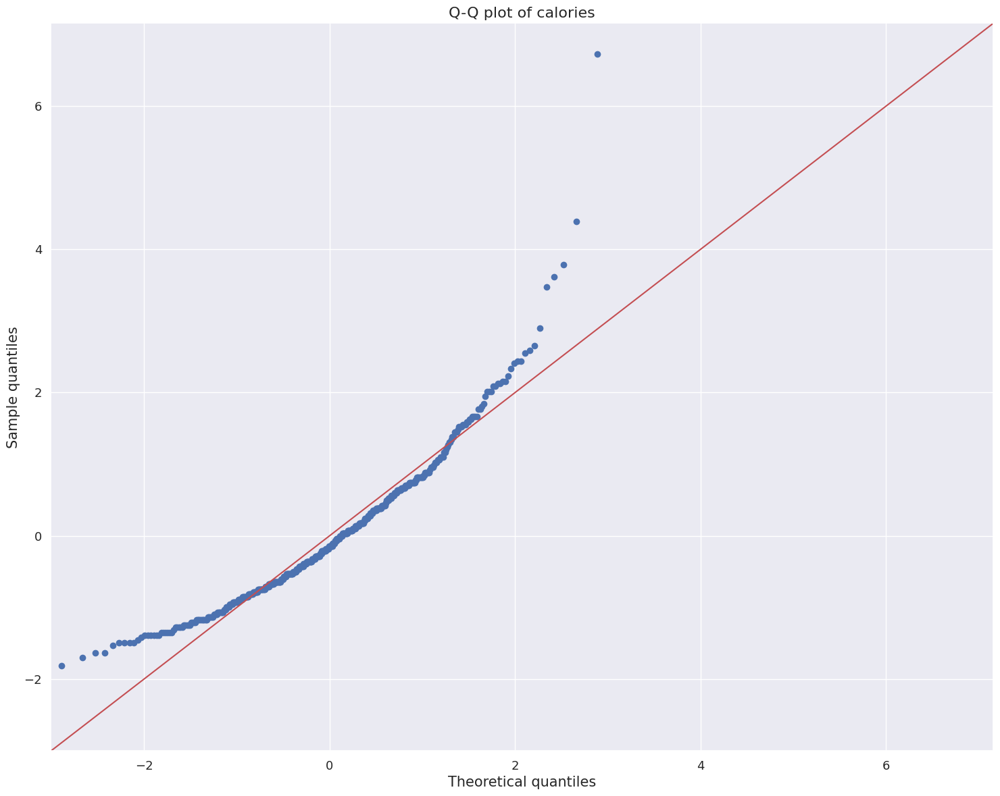

<Figure size 800x500 with 0 Axes>

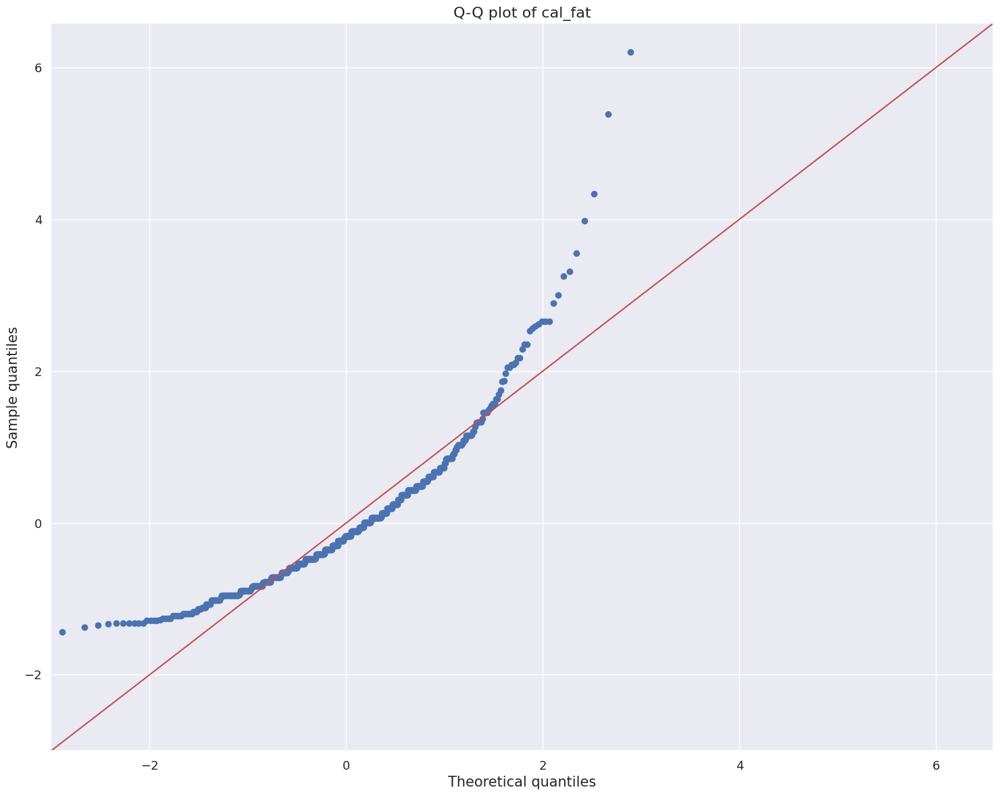

<Figure size 800x500 with 0 Axes>

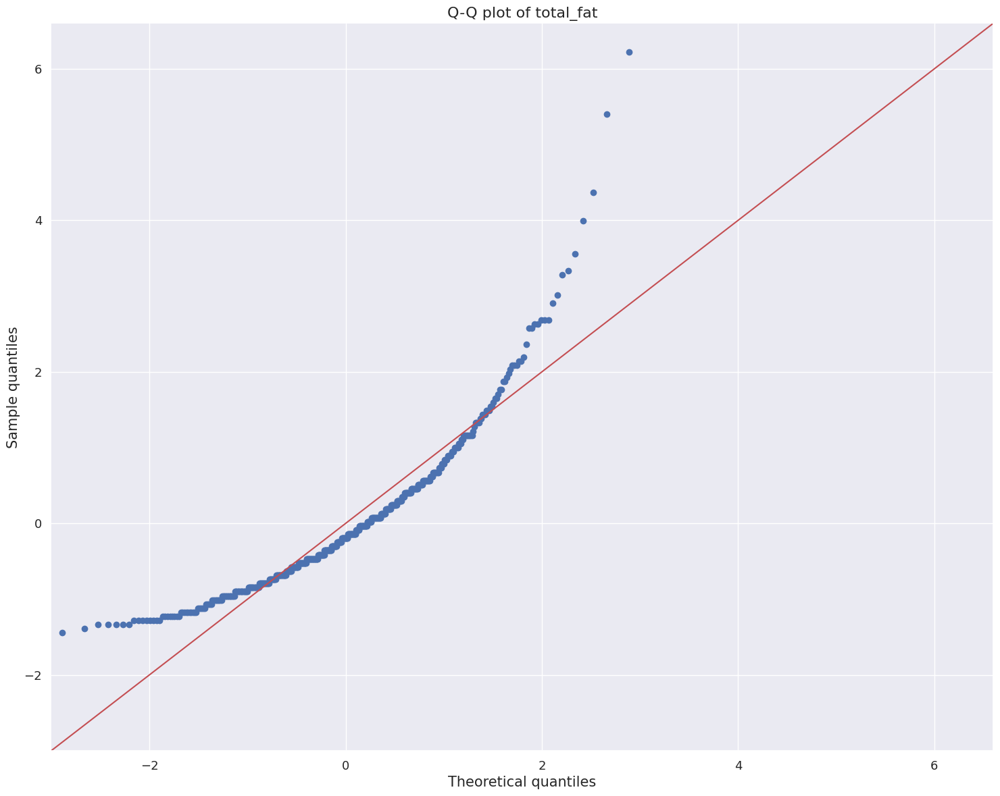

<Figure size 800x500 with 0 Axes>

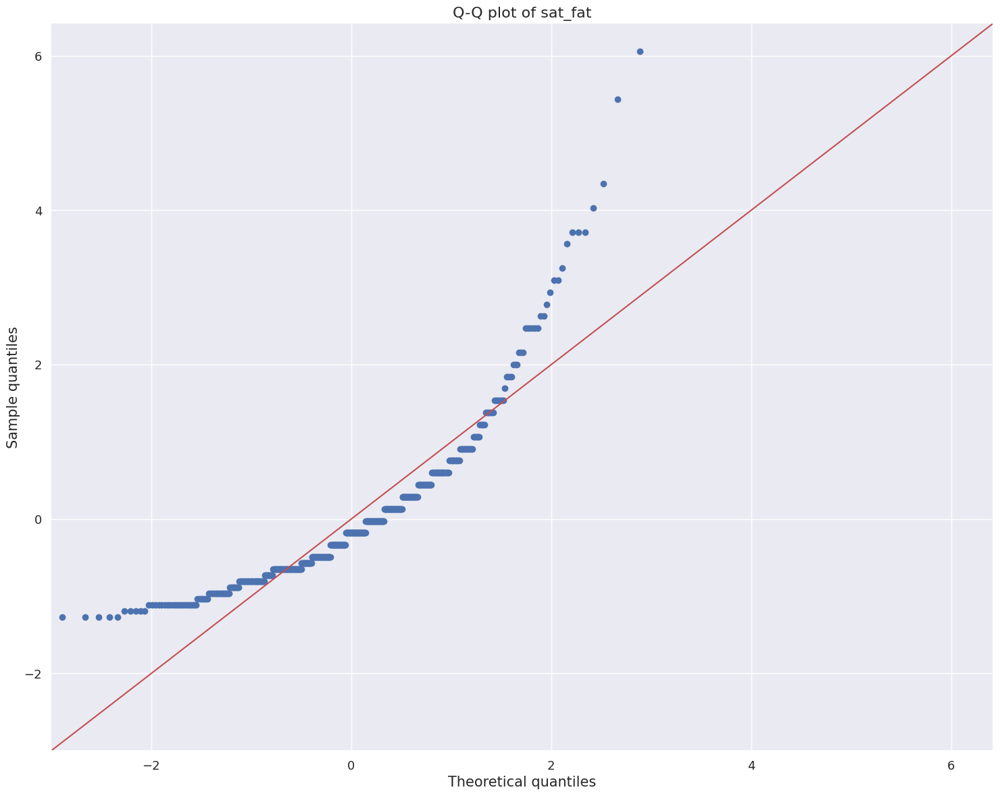

<Figure size 800x500 with 0 Axes>

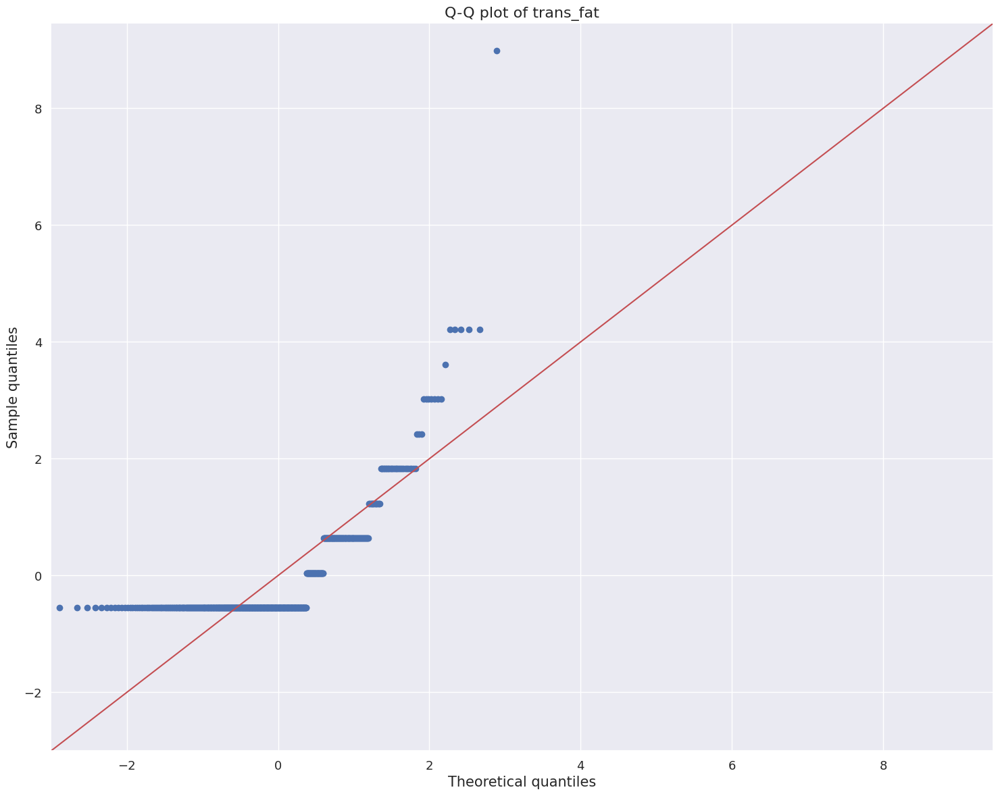

<Figure size 800x500 with 0 Axes>

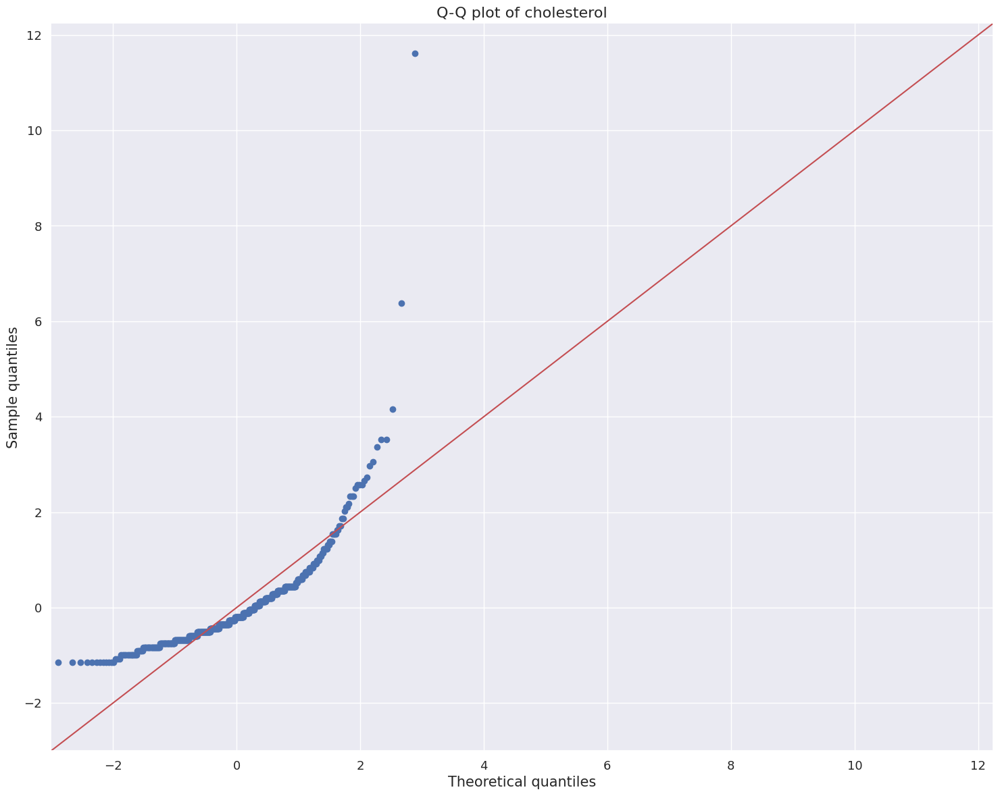

<Figure size 800x500 with 0 Axes>

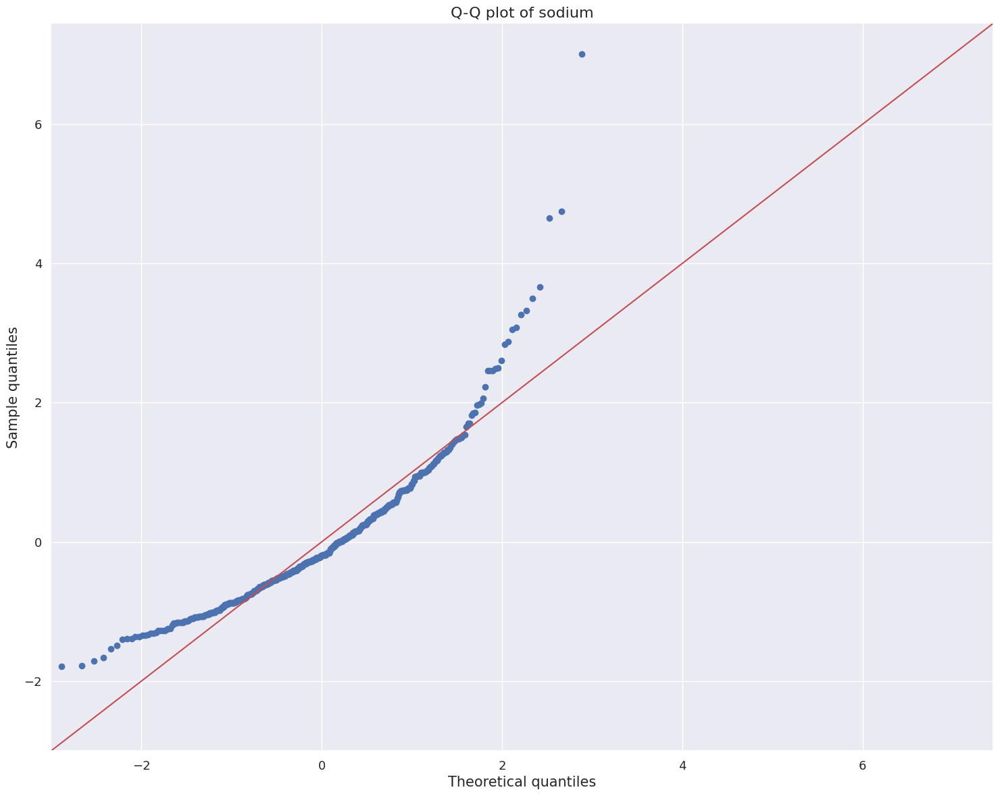

<Figure size 800x500 with 0 Axes>

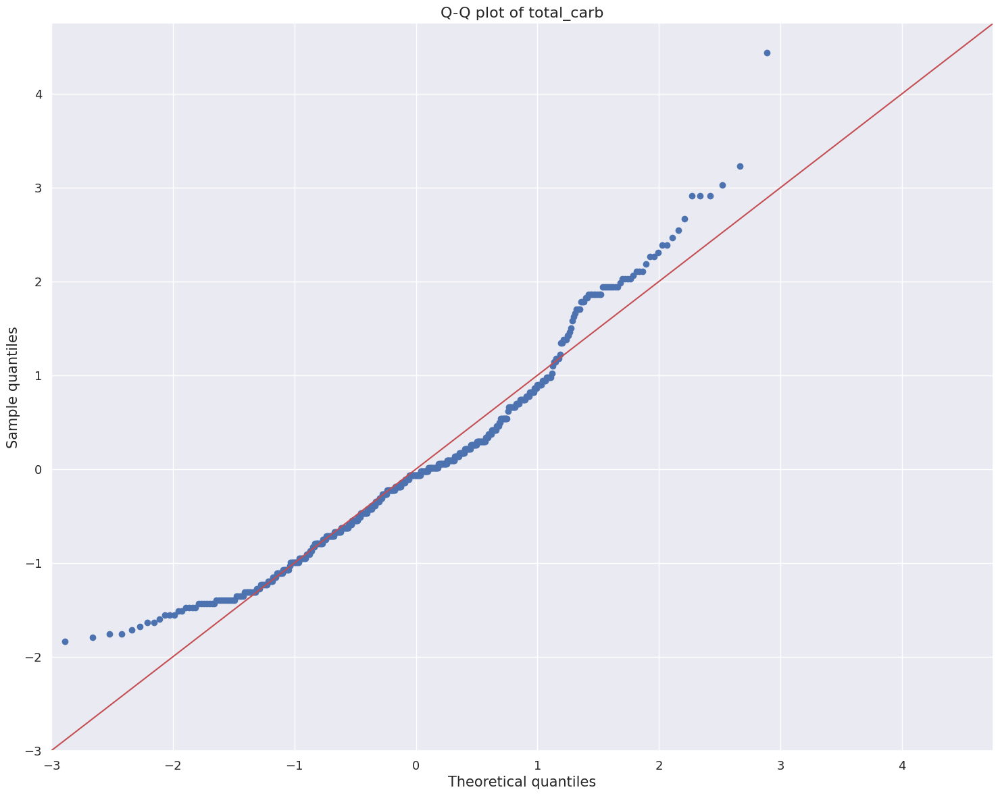

<Figure size 800x500 with 0 Axes>

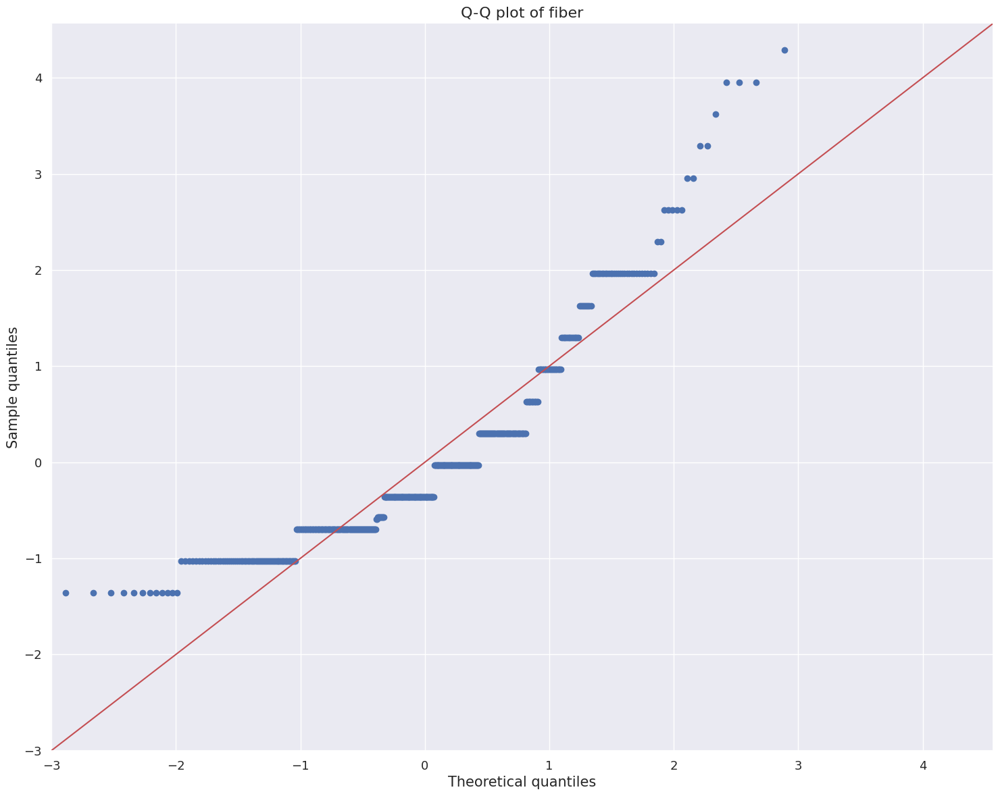

<Figure size 800x500 with 0 Axes>

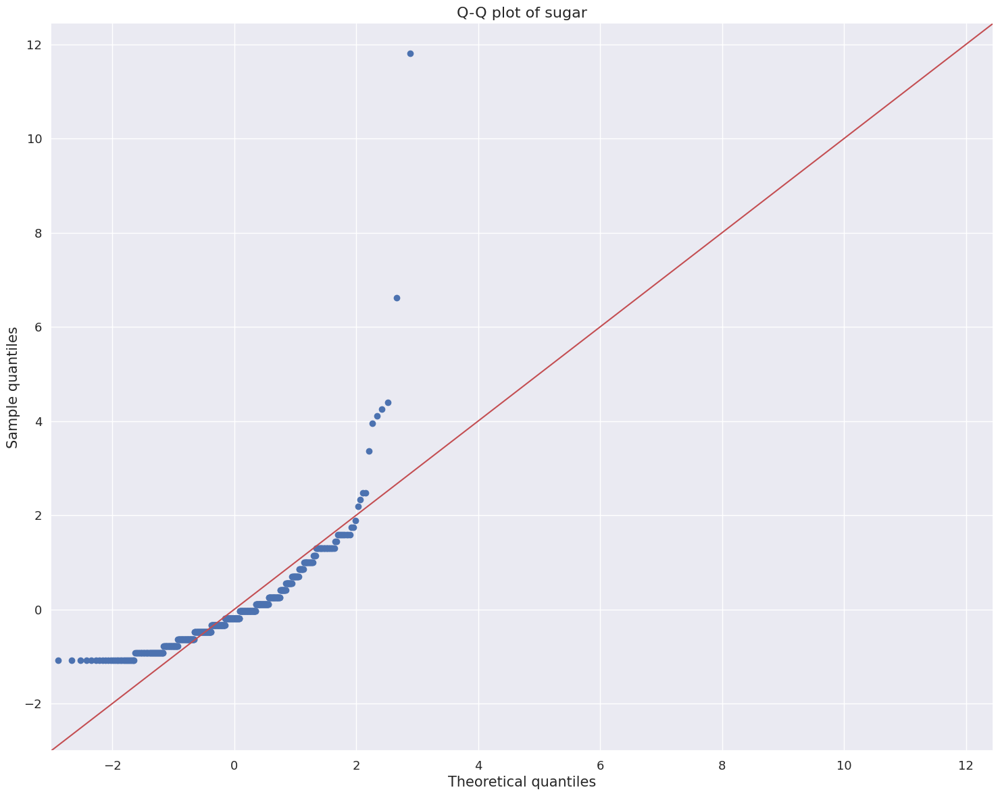

<Figure size 800x500 with 0 Axes>

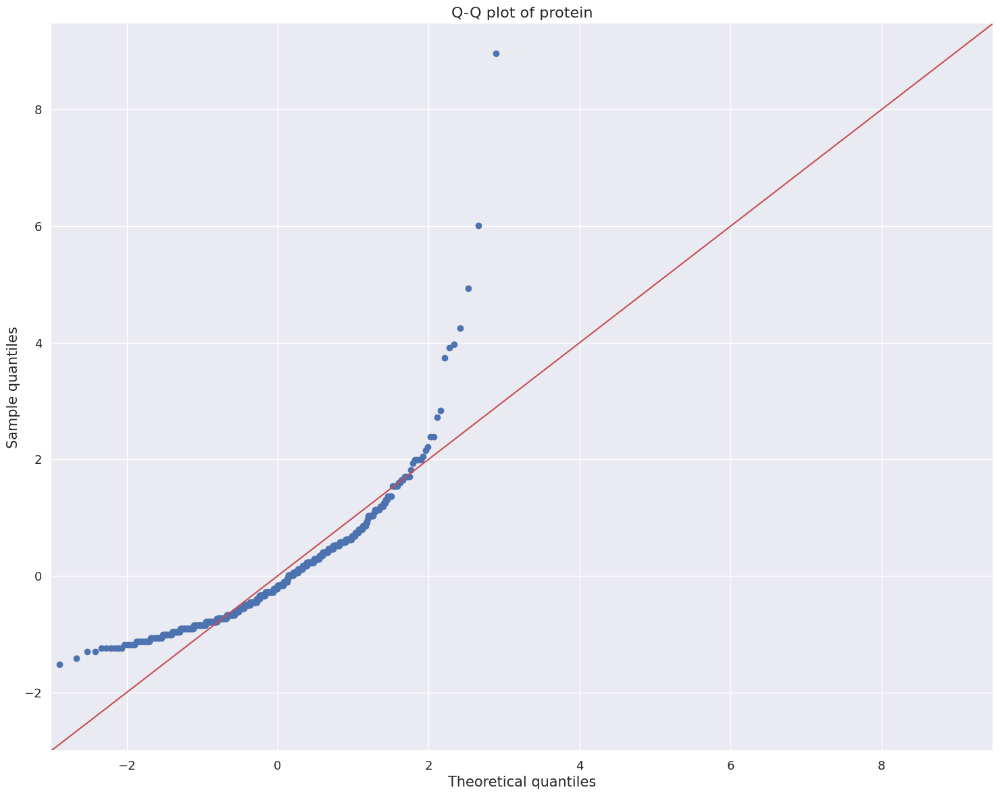

<Figure size 800x500 with 0 Axes>

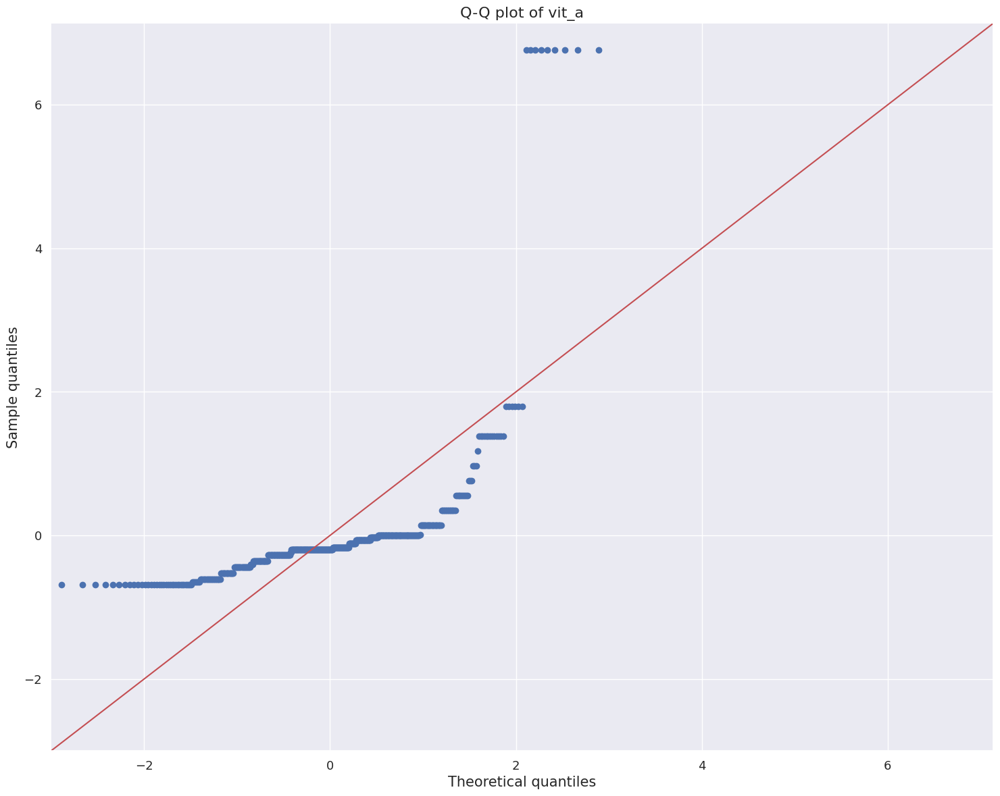

<Figure size 800x500 with 0 Axes>

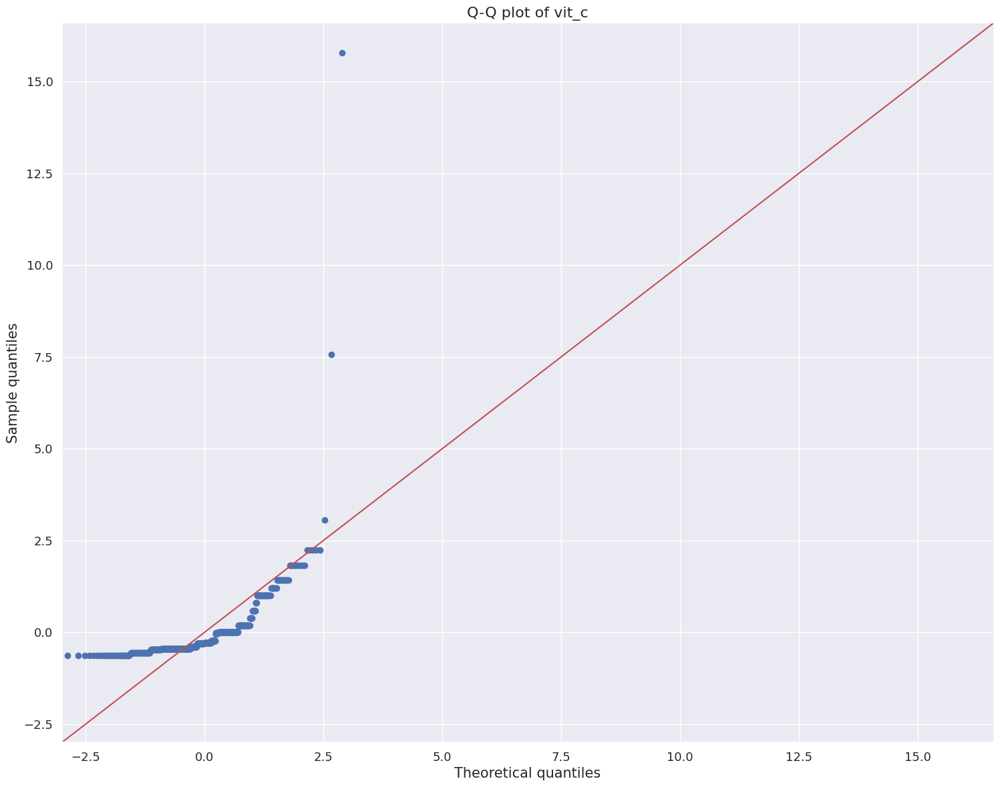

<Figure size 800x500 with 0 Axes>

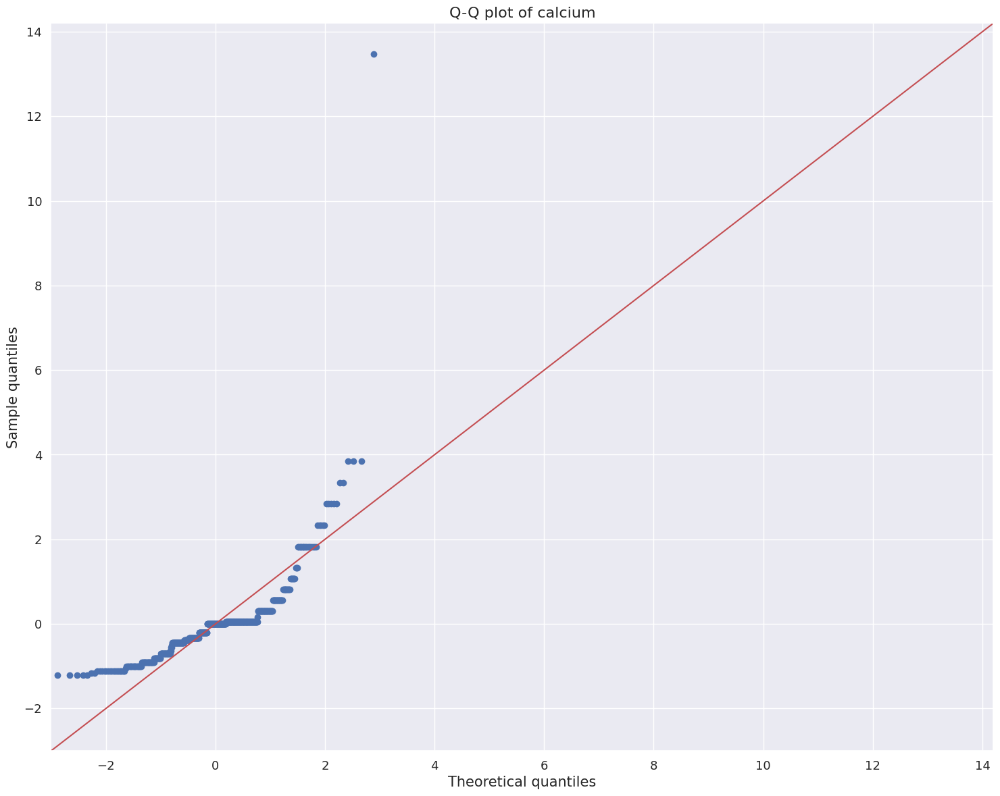

In [ ]:
#checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot

data_norm=data[['calories', 'cal_fat', 'total_fat', 'sat_fat', 'trans_fat', 'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

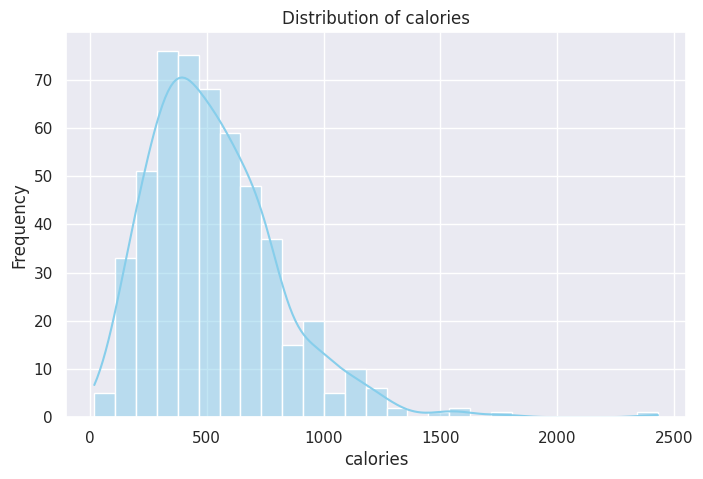

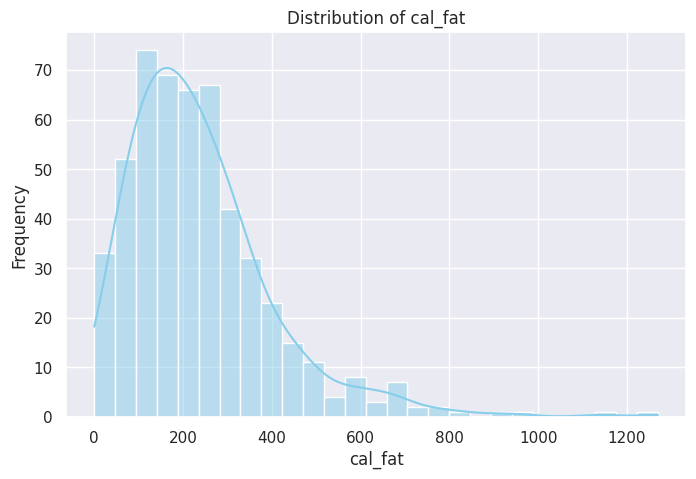

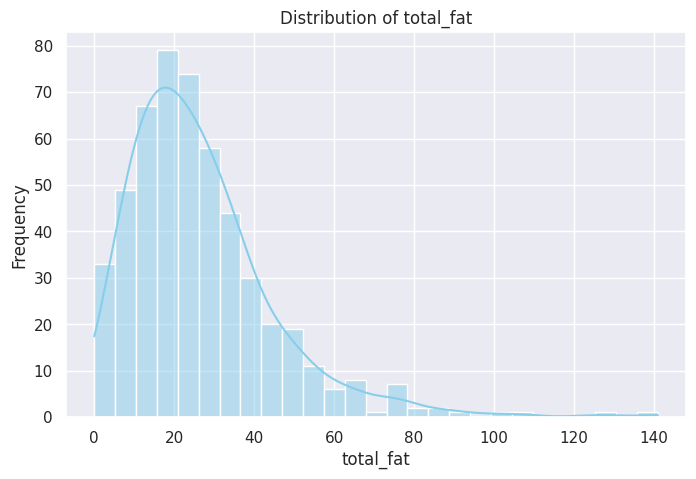

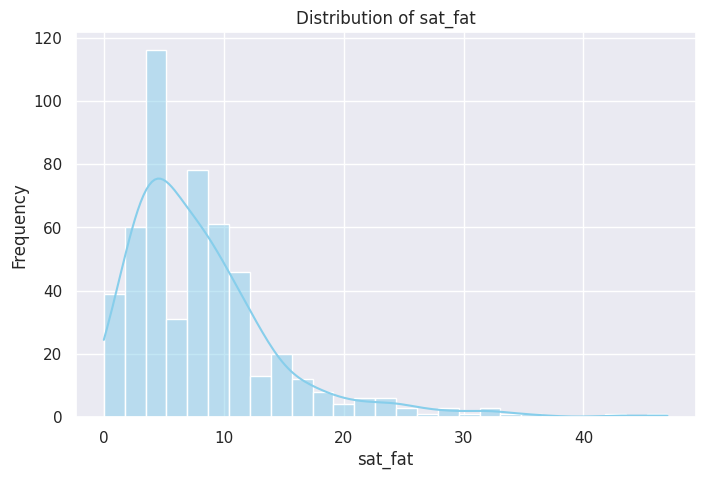

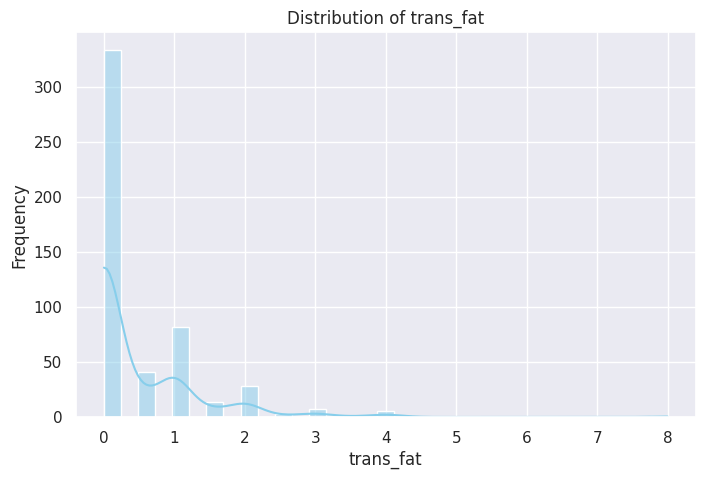

...

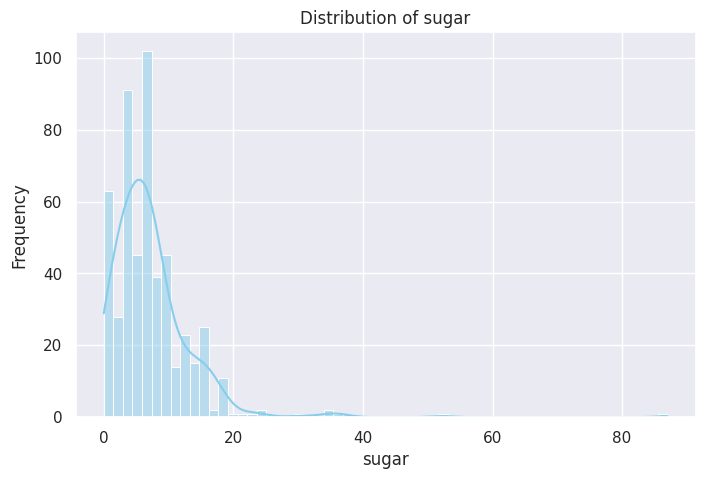

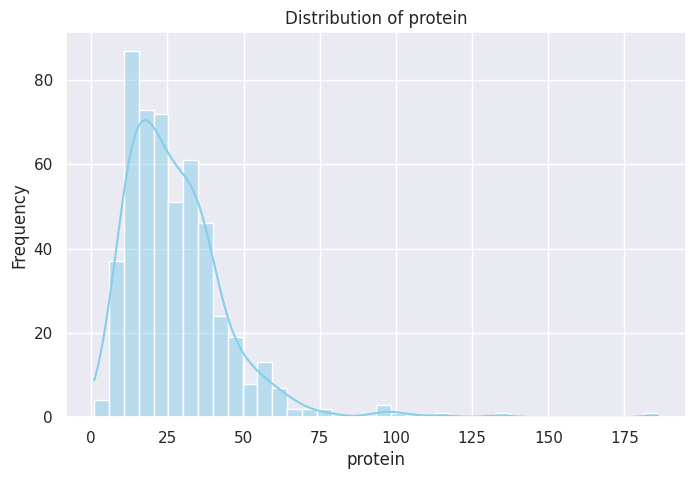

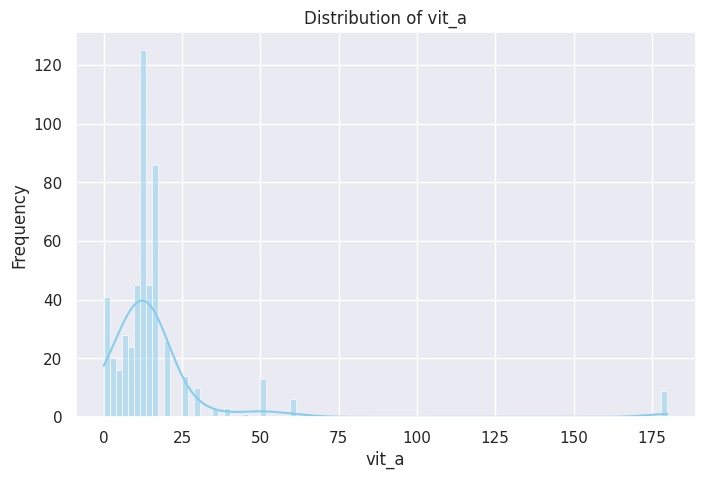

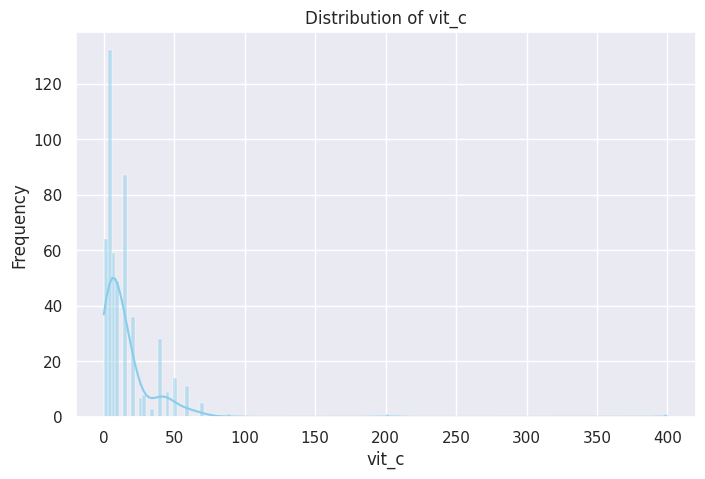

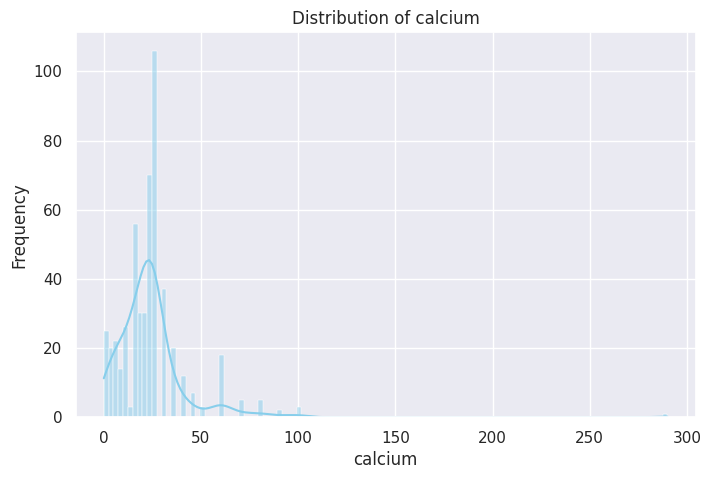

In [ ]:
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns

# Visualize distributions of numeric variables
for column in numeric_columns:
    plt.figure(figsize=(8, 5))
    sns.histplot(data[column], kde=True, color='skyblue')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()


# Question 9: Do the ranges of the predictor variables make sense?

In [ ]:
# Assuming 'data' is your DataFrame, replace it with your actual dataset
# Assuming 'numeric_columns' is a list of numeric column names

# Check the ranges of predictor values
for column in numeric_columns:
    min_value = data[column].min()
    max_value = data[column].max()

    print(f"Column: {column}")
    print(f"Minimum Value: {min_value}")
    print(f"Maximum Value: {max_value}")

    # Add logic to check if the range makes sense for your specific problem
    # For example, you may check if the range is within expected bounds

    print()  # Separating output for clarity


Column: calories
Minimum Value: 20
Maximum Value: 2430

Column: cal_fat
Minimum Value: 0
Maximum Value: 1270

Column: total_fat
Minimum Value: 0
Maximum Value: 141

Column: sat_fat
Minimum Value: 0.0
Maximum Value: 47.0

Column: trans_fat
Minimum Value: 0.0
Maximum Value: 8.0

Column: cholesterol
Minimum Value: 0
Maximum Value: 805

Column: sodium
Minimum Value: 15
Maximum Value: 6080

Column: total_carb
Minimum Value: 0
Maximum Value: 156

Column: fiber
Minimum Value: 0.0
Maximum Value: 17.0

Column: sugar
Minimum Value: 0
Maximum Value: 87

Column: protein
Minimum Value: 1.0
Maximum Value: 186.0

Column: vit_a
Minimum Value: 0.0
Maximum Value: 180.0

Column: vit_c
Minimum Value: 0.0
Maximum Value: 400.0

Column: calcium
Minimum Value: 0.0
Maximum Value: 290.0



In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Assuming 'data' is your DataFrame and 'numeric_columns' is a list of numeric column names
numeric_columns = ['cal_fat', 'total_fat', 'sodium', 'total_carb', 'protein']

# Create a MinMaxScaler instance
scaler = MinMaxScaler()

# Fit and transform the selected numeric columns
data[numeric_columns] = scaler.fit_transform(data[numeric_columns])

# Assign the 'calories' column back to the normalized DataFrame
data_norm = data.copy()

# Check the first few rows of the normalized DataFrame
print(data_norm.head())


  restaurant                                       item  calories   cal_fat  \
0  Mcdonalds           Artisan Grilled Chicken Sandwich       380  0.047244   
1  Mcdonalds             Single Bacon Smokehouse Burger       840  0.322835   
2  Mcdonalds             Double Bacon Smokehouse Burger      1130  0.472441   
3  Mcdonalds  Grilled Bacon Smokehouse Chicken Sandwich       750  0.220472   
4  Mcdonalds   Crispy Bacon Smokehouse Chicken Sandwich       920  0.322835   

   total_fat  sat_fat  trans_fat  cholesterol    sodium  total_carb  fiber  \
0   0.049645      2.0        0.0           95  0.180544    0.282051    3.0   
1   0.319149     17.0        1.5          130  0.258038    0.397436    2.0   
2   0.475177     27.0        3.0          220  0.314097    0.403846    3.0   
3   0.219858     10.0        0.5          155  0.317395    0.397436    2.0   
4   0.319149     12.0        0.5          120  0.323990    0.519231    4.0   

   sugar   protein  vit_a  vit_c  calcium  salad  
0    

In [ ]:
#As the ranges were diferent. Below is the output after normalizing the dataset.
data_norm.describe()

,calories,cal_fat,total_fat,sat_fat,trans_fat,cholesterol,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium
count,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000
mean,530.912621,0.188042,0.188584,8.153398,0.465049,72.456311,0.203090,0.292718,4.096000,7.262136,0.145379,16.676247,15.561371,23.925034
std,282.436147,0.131030,0.130581,6.418811,0.839644,63.160406,0.113760,0.159509,3.013634,6.761301,0.095497,24.162678,24.383661,19.774362
min,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,330.000000,0.094488,0.099291,4.000000,0.000000,35.000000,0.129431,0.182692,2.000000,3.000000,0.081081,9.000000,4.540000,15.000000
50%,490.000000,0.165354,0.163121,7.000000,0.000000,60.000000,0.180544,0.282051,3.000000,6.000000,0.129730,11.850000,8.400000,23.925034
75%,690.000000,0.244094,0.248227,11.000000,1.000000,95.000000,0.253092,0.365385,5.000000,9.000000,0.189189,16.676247,15.561371,25.000000
max,2430.000000,1.000000,1.000000,47.000000,8.000000,805.000000,1.000000,1.000000,17.000000,87.000000,1.000000,180.000000,400.000000,290.000000


# Question 4: Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)



1. **Correlation Matrix**

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


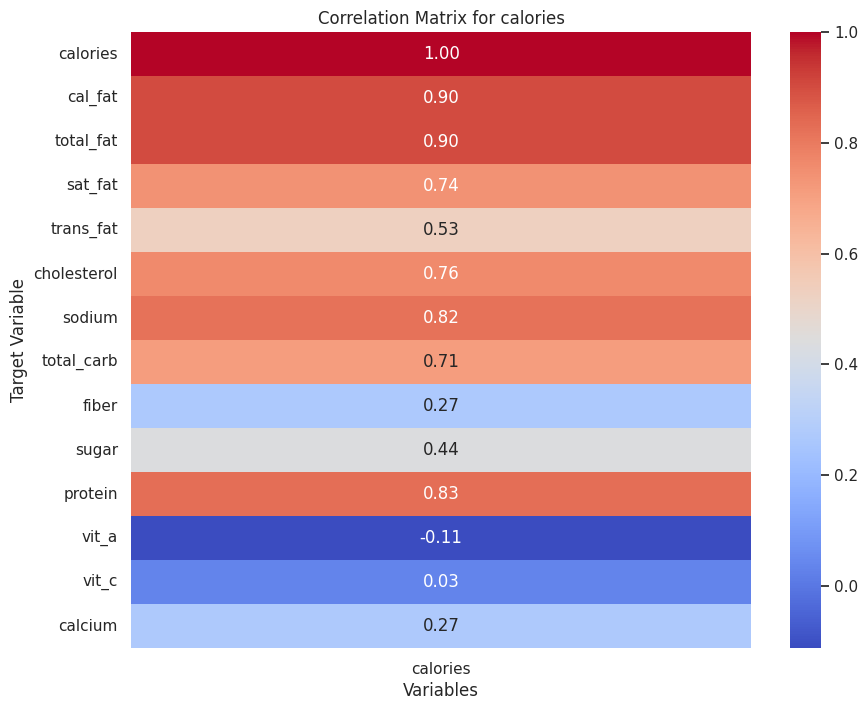

In [ ]:
target_variable = "calories"

# Calculate correlation matrix
correlation_matrix = data.corr()

# Filter correlation matrix for the target variable
target_correlation = correlation_matrix[target_variable]

# Plot correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(target_correlation.to_frame(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title(f"Correlation Matrix for {target_variable}")
plt.xlabel("Variables")
plt.ylabel("Target Variable")
plt.show()

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


<Axes: >

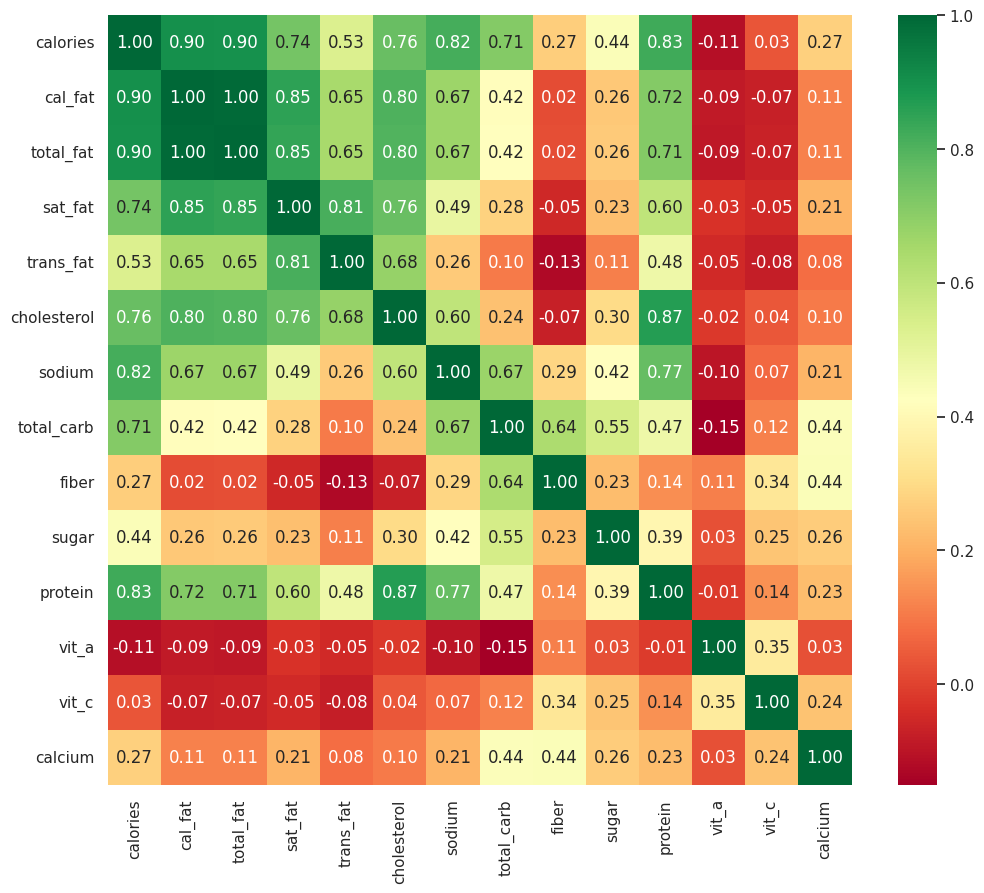

In [ ]:
# heatmap of the same correlation matrix.
plt.figure(figsize=(12,10))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn", fmt= '.2f')

**2.  Random Forest Classifier Feature Importance**

In [ ]:
from sklearn.model_selection import train_test_split
X = data_norm.drop(columns = ['calories'])
y = data_norm['calories']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.33, random_state=42)

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Assuming X_train has categorical columns
label_encoder = LabelEncoder()

for column in X_train.columns:
    if X_train[column].dtype == 'object':
        X_train[column] = label_encoder.fit_transform(X_train[column])

# Now, you can fit the model
forest.fit(X_train, y_train)

RandomForestRegressor(random_state=0)

Text(0.5, 0, 'Feature Importance')

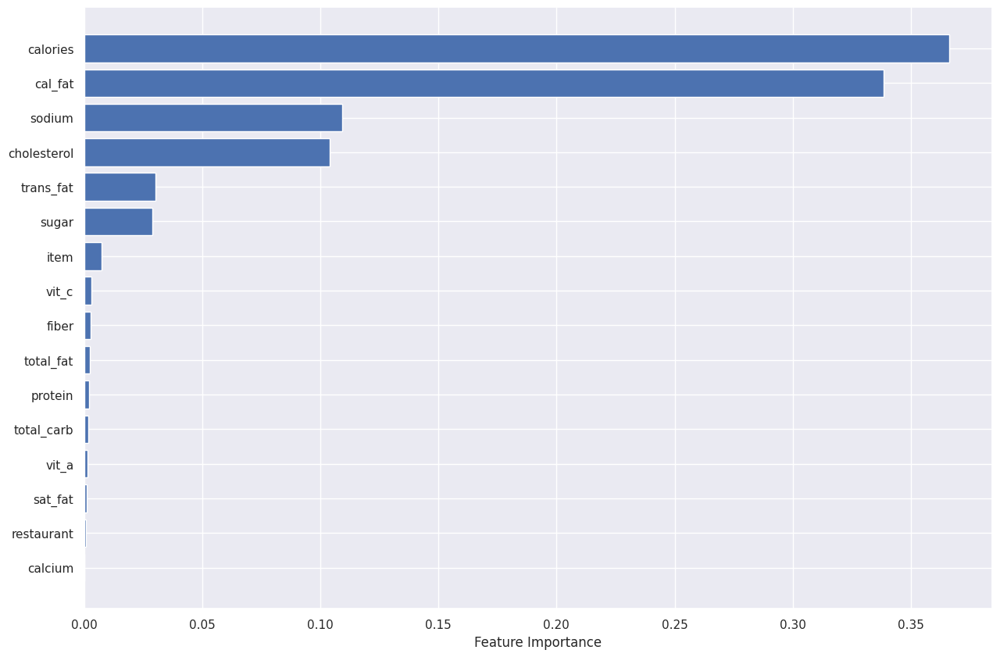

In [ ]:
plt.figure(figsize=(15,10))
sort = forest.feature_importances_.argsort()
plt.barh(data_norm.columns[sort], forest.feature_importances_[sort])
plt.xlabel("Feature Importance")

**3.SHAP**

In [ ]:
%%time
%time
explainer = shap.TreeExplainer(forest)
%time
shap_values = explainer.shap_values(X_train)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 154 µs
CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 10.5 µs
CPU times: user 2.59 s, sys: 21.2 ms, total: 2.62 s
Wall time: 5.15 s


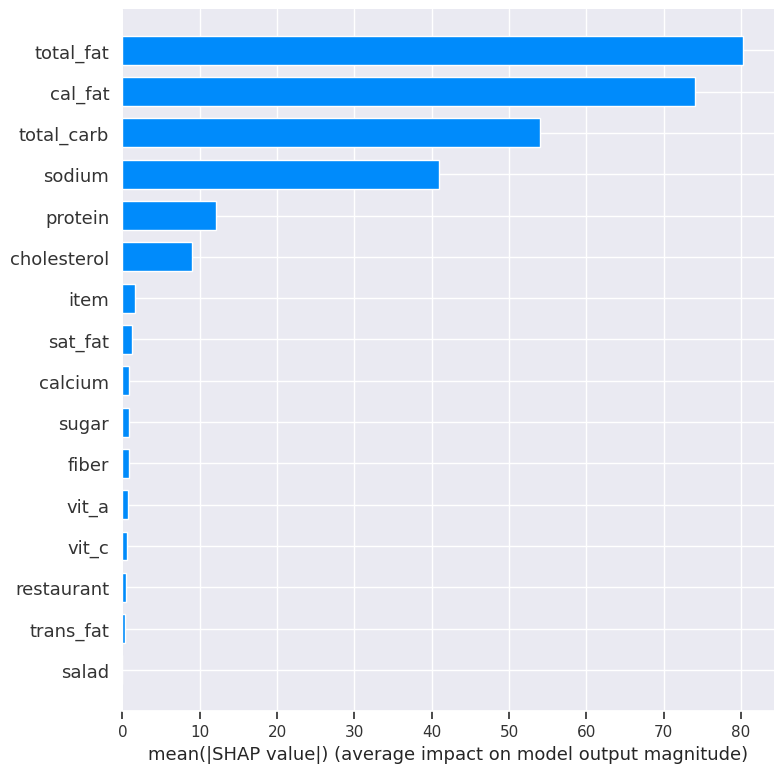

In [ ]:
shap.summary_plot(shap_values, features=X_train, feature_names=X.columns, plot_type='bar')

**Answer** : Based on these we conlude to use the following independent variables as most important feature to train the model.

['calories', 'cal_fat', 'total_fat', 'sat_fat', 'trans_fat', 'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium']

# Question 6: Do the training and test sets have the same data?

In [ ]:
X_train[0:10]

,restaurant,item,cal_fat,total_fat,sat_fat,trans_fat,cholesterol,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium,salad
234,1,70,0.368504,0.368794,14.0,0.5,110,0.343776,0.365385,2.38,9,0.178378,16.676247,15.561371,23.925034,0
384,6,302,0.161417,0.163121,9.0,1.0,50,0.208574,0.070513,4.00,6,0.075676,50.000000,50.000000,8.000000,0
60,2,0,0.042520,0.042553,3.0,0.0,25,0.050289,0.038462,0.00,1,0.054054,0.000000,0.000000,2.000000,0
110,5,128,0.173228,0.170213,4.0,0.0,35,0.119538,0.275641,1.00,4,0.097297,0.000000,0.000000,4.000000,0
409,7,92,0.094488,0.092199,5.0,0.0,30,0.177246,0.333333,7.00,5,0.086486,11.850000,4.540000,24.810000,0
420,7,306,0.220472,0.219858,11.0,0.5,65,0.230008,0.410256,3.00,4,0.129730,11.850000,4.540000,24.810000,0
29,4,216,0.141732,0.141844,5.0,0.0,115,0.253092,0.358974,4.00,14,0.216216,20.000000,25.000000,30.000000,0
274,3,134,0.141732,0.141844,8.0,1.0,40,0.170651,0.153846,1.00,5,0.064865,8.000000,0.000000,6.000000,0
302,3,277,0.000000,0.000000,0.0,0.0,0,0.000000,0.032051,2.00,3,0.000000,50.000000,30.000000,15.000000,0
26,4,258,0.157480,0.156028,4.0,0.0,45,0.162407,0.378205,3.00,13,0.129730,6.000000,10.000000,20.000000,0


In [ ]:
X_test[0:10]

,restaurant,item,cal_fat,total_fat,sat_fat,trans_fat,cholesterol,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium,salad
304,Subway,"6"" B.L.T.",0.062992,0.063830,4.0,0.0,20,0.109646,0.275641,5.0,6,0.075676,8.000000,8.000000,30.000000,Other
499,Taco Bell,Mexican Pizza,0.212598,0.219858,8.0,1.0,40,0.139324,0.301282,7.0,2,0.102703,11.850000,4.540000,24.810000,Other
441,Taco Bell,Spicy Sweet Double Stacked Taco,0.125984,0.127660,7.0,0.0,35,0.103050,0.205128,4.0,6,0.059459,10.000000,2.000000,15.000000,Other
153,Arbys,Greek Gyro,0.307087,0.312057,13.0,0.0,75,0.221764,0.352564,4.0,6,0.118919,12.560000,8.400000,17.360000,Other
501,Taco Bell,Steak Quesalupa,0.165354,0.163121,10.0,0.5,60,0.136026,0.230769,3.0,3,0.113514,15.000000,6.000000,35.000000,Other
131,Sonic,"All Beef New York Dog – 6""",0.133858,0.134752,7.0,0.0,40,0.203627,0.192308,3.0,4,0.064865,2.000000,10.000000,8.000000,Other
204,Burger King,Extra Long Cheeseburger,0.236220,0.234043,13.0,1.5,85,0.167354,0.288462,2.0,9,0.135135,16.676247,15.561371,23.925034,Other
510,Taco Bell,Spicy Triple Double Crunchwrap,0.267717,0.269504,10.0,0.5,50,0.302556,0.557692,9.0,8,0.118919,20.000000,10.000000,25.000000,Other
325,Subway,"6"" Corned Beef Reuben",0.102362,0.106383,4.5,0.0,85,0.289365,0.288462,7.0,12,0.205405,10.000000,35.000000,20.000000,Other
247,Burger King,Crispy Chicken Jr.,0.196850,0.198582,4.5,0.0,30,0.122836,0.217949,2.0,4,0.059459,16.676247,15.561371,23.925034,Other


In [ ]:
y_train[0:10]

234    830
384    310
60     120
110    450
409    390
420    630
29     560
274    330
302     20
26     530
Name: calories, dtype: int64

In [ ]:
y_test[0:10]

304    320
499    540
441    340
153    710
501    440
131    340
204    580
510    780
325    470
247    430
Name: calories, dtype: int64

In [ ]:
#comparing datasets
same_X_data = X_train.equals(X_test)
same_y_data = y_train.equals(y_test)


if same_X_data or same_y_data:
    print("Training and test sets have the same data")
else:
    print("Training and test sets have different data")

Training and test sets have different data


#  Question 7: In the predictor variables independent of all the other predictor variables?

<ipython-input-33-017c7b070c51>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


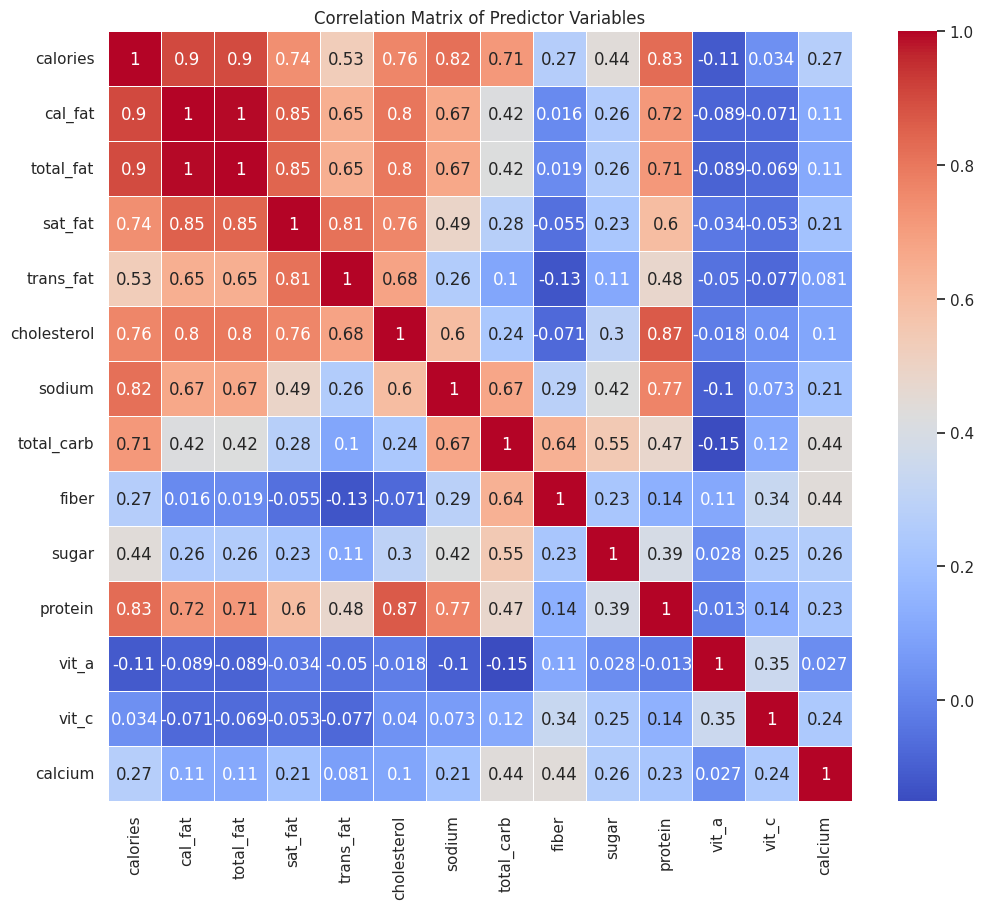

             calories   cal_fat  total_fat   sat_fat  trans_fat  cholesterol  \
calories     1.000000  0.901661   0.900494  0.739664   0.530354     0.762460   
cal_fat      0.901661  1.000000   0.995311  0.852150   0.648422     0.803997   
total_fat    0.900494  0.995311   1.000000  0.846716   0.648821     0.801352   
sat_fat      0.739664  0.852150   0.846716  1.000000   0.812126     0.764030   
trans_fat    0.530354  0.648422   0.648821  0.812126   1.000000     0.680858   
cholesterol  0.762460  0.803997   0.801352  0.764030   0.680858     1.000000   
sodium       0.817855  0.670458   0.669182  0.487456   0.261466     0.596164   
total_carb   0.712701  0.419373   0.422543  0.276534   0.100284     0.238728   
fiber        0.267163  0.015571   0.019156 -0.054887  -0.126234    -0.071500   
sugar        0.437711  0.255485   0.259370  0.234218   0.112651     0.298259   
protein      0.827674  0.715149   0.714259  0.598707   0.475384     0.866955   
vit_a       -0.113192 -0.088610  -0.0893

In [ ]:
# Compute the correlation matrix
correlation_matrix = data.corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title("Correlation Matrix of Predictor Variables")
plt.show()
print(correlation_matrix)

Observations:

At first glance we can see that that the variables have less collinearity.

In [ ]:
independence = (correlation_matrix.abs() < 0.1).all().all()

if independence:
    print("The predictor variables are independent of all the other predictor variables.")
else:
    print("The predictor variables are not independent of all the other predictor variables.")

The predictor variables are not independent of all the other predictor variables.


# Question 8: Which predictor variables are the most important?

Mean Squared Error: 8668.320388349515

Top 10 most important features:

                        Feature  Importance
1                     total_fat    0.428819
0                       cal_fat    0.259725
6                    total_carb    0.142696
5                        sodium    0.062633
4                   cholesterol    0.049309
9                       protein    0.033637
511  item_Ultimate Chicken Club    0.009949
8                         sugar    0.001876
2                       sat_fat    0.001826
7                         fiber    0.001759


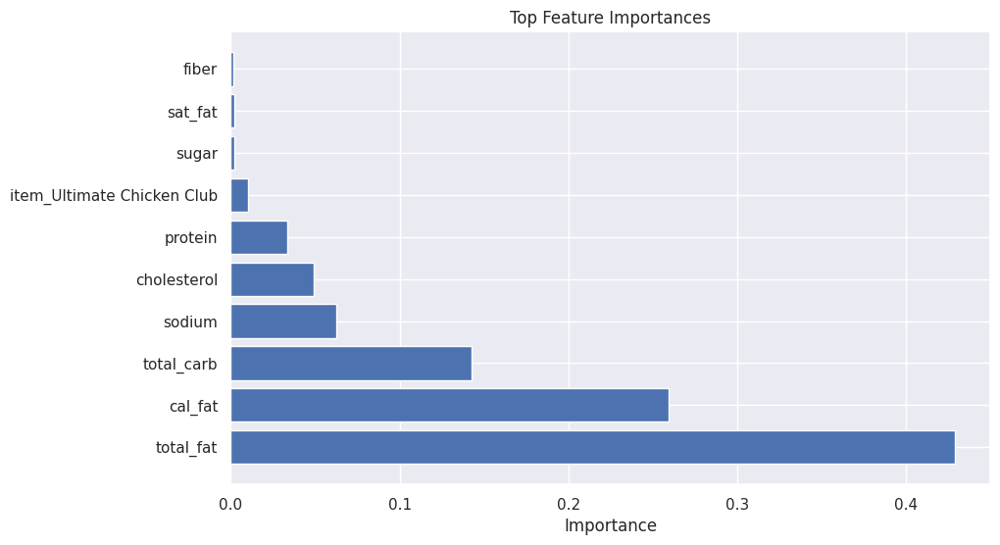

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

# Load the dataset
url = "https://raw.githubusercontent.com/SaiPranaviJeedigunta/DEMG_assignments/main/DSEM_0022415588/fastfood.csv"
df = pd.read_csv(url)

# Assuming the target variable is 'Sales' (replace it with your actual target variable)
target_variable = 'calories'

# Drop non-numeric columns and the target variable to get the predictor variables
X = df.drop([target_variable], axis=1)

# Extract the target variable
y = df[target_variable]

# One-hot encode categorical variables
X_encoded = pd.get_dummies(X, drop_first=True)

# Handle missing values with imputation
imputer = SimpleImputer(strategy='mean')
X_imputed = pd.DataFrame(imputer.fit_transform(X_encoded), columns=X_encoded.columns)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.2, random_state=42)

# Initialize a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Calculate the Mean Squared Error on the test set
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# Get feature importances from the trained model
feature_importances = rf_model.feature_importances_

# Create a DataFrame with feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X_imputed.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Display the top N most important features
top_n = 10  # Change this to the desired number of top features
print(f"\nTop {top_n} most important features:\n")
print(feature_importance_df.head(top_n))

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'][:top_n], feature_importance_df['Importance'][:top_n])
plt.xlabel('Importance')
plt.title('Top Feature Importances')
plt.show()



**Answer**: Based on the correlation Matrix we can conclude that the predictor variables above the value of 0.5 are the most important: calories, cal_fat, total_fat, protein, sodium and total_carb.

# Question 10: What are the distributions of the predictor variables?   

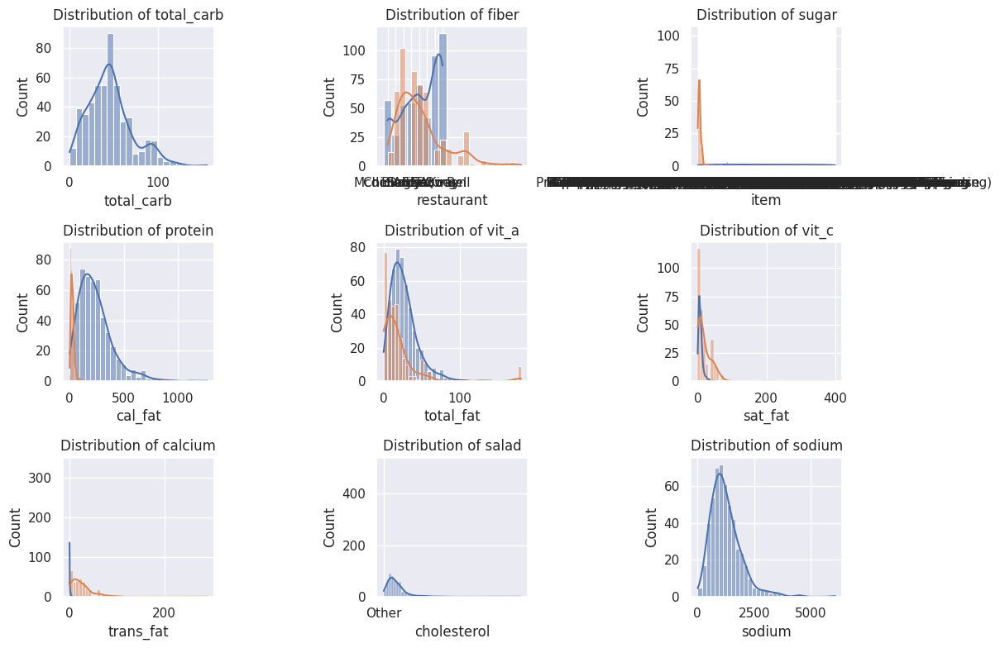

In [ ]:
# Plot histograms for each predictor variable
plt.figure(figsize=(12, 8))
for i, column in enumerate(X.columns, 1):
    plt.subplot(3, 3, i % 9 + 1)
    sns.histplot(X[column], kde=True)
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

# Question 11: Remove outliers and keep outliers (does if have an effect of the final predictive model)?


*  Mean Squared Error (MSE) with original data (including outliers): 110159.22330097087
*   Mean Squared Error (MSE) after removing outliers: 83296.0

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from scipy import stats

# Assuming you have a DataFrame named 'data'
# Replace the DataFrame and column names with your actual dataset and columns
independent_variables = ['total_fat', 'cal_fat', 'total_carb', 'sodium', 'protein']
target_variable = 'calories'

# Method 1: Train the model with original data (including outliers)
X = data[independent_variables]
y = data[target_variable]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model_original = LogisticRegression(max_iter=1000)  # Increased max_iter
model_original.fit(X_train, y_train)
y_pred_original = model_original.predict(X_test)
accuracy_original = accuracy_score(y_test, y_pred_original)

# Method 2: Remove outliers and train the model
# Define a function to remove outliers using modified Z-score method
def remove_outliers(df, cols, threshold=3):
    z_scores = stats.zscore(df[cols])
    df_outliers_removed = df[(z_scores < threshold).all(axis=1)]
    return df_outliers_removed

# Remove outliers from the independent variables
data_no_outliers = remove_outliers(data, independent_variables)

# Split the data into training and test sets
X_no_outliers = data_no_outliers[independent_variables]
y_no_outliers = data_no_outliers[target_variable]
X_train_no_outliers, X_test_no_outliers, y_train_no_outliers, y_test_no_outliers = train_test_split(X_no_outliers, y_no_outliers, test_size=0.2, random_state=42)

# Train the model without outliers
model_no_outliers = LogisticRegression(max_iter=1000)  # Increased max_iter
model_no_outliers.fit(X_train_no_outliers, y_train_no_outliers)
y_pred_no_outliers = model_no_outliers.predict(X_test_no_outliers)
accuracy_no_outliers = accuracy_score(y_test_no_outliers, y_pred_no_outliers)

mse_original = ((y_test - y_pred_original) ** 2).mean()
mse_no_outliers = ((y_test_no_outliers - y_pred_no_outliers) ** 2).mean()


# Compare the performance of both models
print("Mean Squared Error (MSE) with original data (including outliers):", mse_original)
print("Mean Squared Error (MSE) after removing outliers:", mse_no_outliers)

# Compare the performance of both models
print("Accuracy with original data (including outliers):", accuracy_original)
print("Accuracy after removing outliers:", accuracy_no_outliers)


Mean Squared Error (MSE) with original data (including outliers): 48136.8932038835
Mean Squared Error (MSE) after removing outliers: 41748.0
Accuracy with original data (including outliers): 0.019417475728155338
Accuracy after removing outliers: 0.02


# Question 12: Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

Removing 1% data:

In [ ]:
p = 0.01
mask = np.random.choice([True, False], size=data.shape, p=[p,1-p])
nan_1p_df = data.mask(mask)

In [ ]:
nan_1p_df.info()
#We can see 1% data is made null as non null values are not same as total entries

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515 entries, 0 to 514
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   restaurant   508 non-null    object 
 1   item         511 non-null    object 
 2   calories     510 non-null    float64
 3   cal_fat      512 non-null    float64
 4   total_fat    510 non-null    float64
 5   sat_fat      512 non-null    float64
 6   trans_fat    510 non-null    float64
 7   cholesterol  505 non-null    float64
 8   sodium       507 non-null    float64
 9   total_carb   511 non-null    float64
 10  fiber        505 non-null    float64
 11  sugar        507 non-null    float64
 12  protein      510 non-null    float64
 13  vit_a        507 non-null    float64
 14  vit_c        511 non-null    float64
 15  calcium      512 non-null    float64
 16  salad        514 non-null    object 
dtypes: float64(14), object(3)
memory usage: 68.5+ KB


Removing 5% data

In [ ]:
p = 0.05
mask = np.random.choice([True, False], size=data.shape, p=[p,1-p])
nan_5p_df = data.mask(mask)
nan_5p_df.info()
#We can see 5% data is made null as non null values are not same as total entries

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515 entries, 0 to 514
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   restaurant   489 non-null    object 
 1   item         490 non-null    object 
 2   calories     492 non-null    float64
 3   cal_fat      482 non-null    float64
 4   total_fat    485 non-null    float64
 5   sat_fat      501 non-null    float64
 6   trans_fat    487 non-null    float64
 7   cholesterol  494 non-null    float64
 8   sodium       490 non-null    float64
 9   total_carb   480 non-null    float64
 10  fiber        486 non-null    float64
 11  sugar        488 non-null    float64
 12  protein      488 non-null    float64
 13  vit_a        495 non-null    float64
 14  vit_c        489 non-null    float64
 15  calcium      490 non-null    float64
 16  salad        499 non-null    object 
dtypes: float64(14), object(3)
memory usage: 68.5+ KB


10% Data removal

In [ ]:
p = 0.1
mask = np.random.choice([True, False], size=data.shape, p=[p,1-p])
nan_10p_df = data.mask(mask)
print(nan_10p_df.info())
#We can see 10% data is made null as non null values are not same as total entries

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515 entries, 0 to 514
Data columns (total 17 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   restaurant   466 non-null    object 
 1   item         470 non-null    object 
 2   calories     470 non-null    float64
 3   cal_fat      470 non-null    float64
 4   total_fat    460 non-null    float64
 5   sat_fat      470 non-null    float64
 6   trans_fat    459 non-null    float64
 7   cholesterol  468 non-null    float64
 8   sodium       470 non-null    float64
 9   total_carb   464 non-null    float64
 10  fiber        473 non-null    float64
 11  sugar        461 non-null    float64
 12  protein      482 non-null    float64
 13  vit_a        468 non-null    float64
 14  vit_c        460 non-null    float64
 15  calcium      467 non-null    float64
 16  salad        466 non-null    object 
dtypes: float64(14), object(3)
memory usage: 68.5+ KB
None


**Data Imputation**

1. With Mean values

In [ ]:
nan_10p_df_mean = nan_10p_df.fillna(nan_10p_df.mean())
nan_1p_df_mean = nan_1p_df.fillna(nan_1p_df.mean())
nan_5p_df_mean = nan_5p_df.fillna(nan_5p_df.mean())

<ipython-input-42-afee303c9630>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  nan_10p_df_mean = nan_10p_df.fillna(nan_10p_df.mean())
<ipython-input-42-afee303c9630>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  nan_1p_df_mean = nan_1p_df.fillna(nan_1p_df.mean())
<ipython-input-42-afee303c9630>:3: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the val

2. Dropping these Nan values

In [ ]:
nan_10p_df_drop = nan_10p_df.dropna()
print('nan_10p_df_drop shape:',nan_10p_df_drop.shape)
nan_1p_df_drop = nan_1p_df.dropna()
print('nan_1p_df_drop shape:',nan_1p_df_drop.shape)
nan_5p_df_drop = nan_5p_df.dropna()
print('nan_5p_df_drop shape:',nan_5p_df_drop.shape)

nan_10p_df_drop shape: (105, 17)
nan_1p_df_drop shape: (428, 17)
nan_5p_df_drop shape: (225, 17)


3. Fill with KNN

In [ ]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OrdinalEncoder

# Assuming 'nan_1p_df', 'nan_5p_df', and 'nan_10p_df' are your DataFrames with missing values

def impute_knn(impute_df, imputer, encoder):
    # Separate numerical and categorical columns
    numerical_cols = impute_df.select_dtypes(include=['number']).columns
    categorical_cols = impute_df.select_dtypes(include=['object']).columns

    # Create a copy of the DataFrame
    impute_df_copy = impute_df.copy()

    # Convert categorical columns to numerical using OrdinalEncoder
    impute_df_copy[categorical_cols] = encoder.fit_transform(impute_df[categorical_cols])

    # Apply KNNImputer
    Xtrans = imputer.fit_transform(impute_df_copy)

    # Convert back to DataFrame
    res_df = pd.DataFrame(data=Xtrans, columns=impute_df.columns)

    # Convert encoded categorical values back to original format
    res_df[categorical_cols] = encoder.inverse_transform(res_df[categorical_cols].astype(int))

    return res_df

# Initialize KNNImputer
imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')

# Initialize OrdinalEncoder
encoder = OrdinalEncoder()

# Apply imputation
nan_1p_df_knn = impute_knn(nan_1p_df, imputer, encoder)
nan_5p_df_knn = impute_knn(nan_5p_df, imputer, encoder)
nan_10p_df_knn = impute_knn(nan_10p_df, imputer, encoder)


**Check how well imputing the mean works**

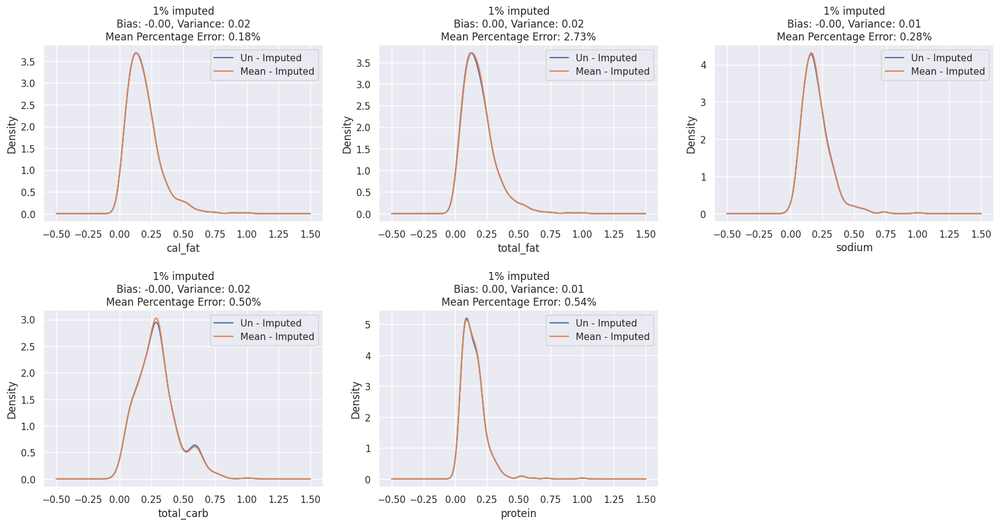

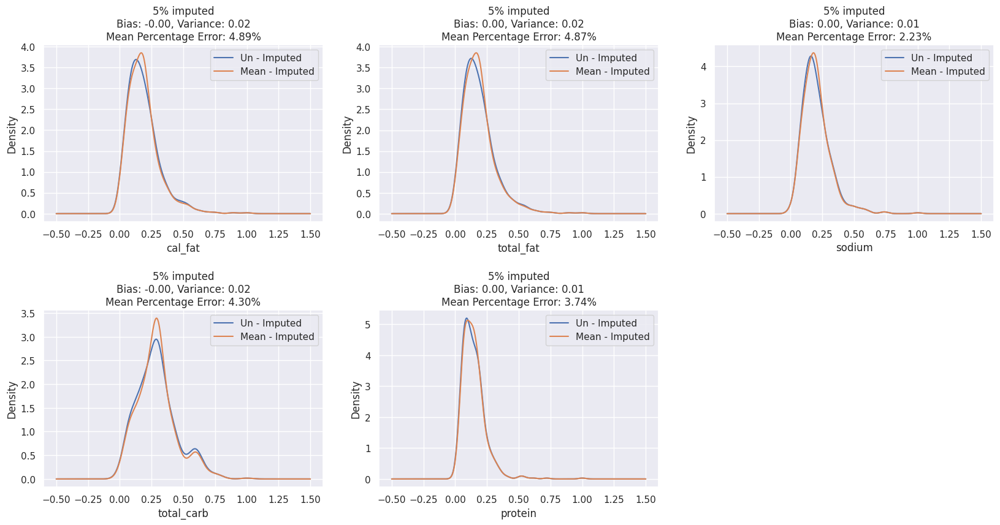

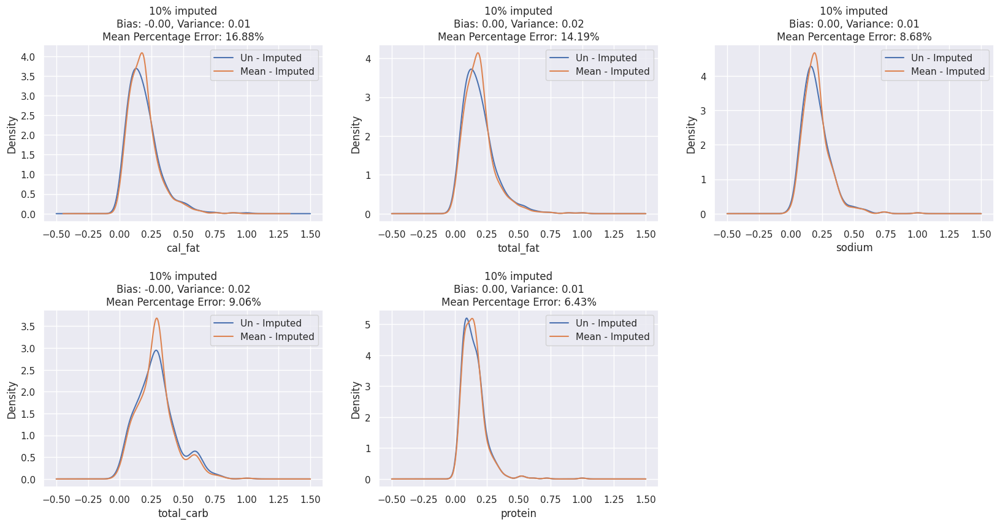

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate bias, variance, and mean percentage error
def calculate_metrics(original, imputed):
    bias = np.mean(imputed - original)
    variance = np.var(imputed)
    mean_percentage_error = np.mean(np.abs((original - imputed) / original)) * 100
    return bias, variance, mean_percentage_error

# Assuming numeric_columns is the list of columns you want to visualize
cols = numeric_columns

# Imputation levels
imputation_levels = [1, 5, 10]

for level in imputation_levels:
    plt.figure(figsize=(20, 15))
    i = 0
    for col in cols[:]:
        plt.subplot(3, 3, i % 9 + 1)
        i += 1

        # Original data
        data[col].plot(kind="kde")

        # Imputed data using mean imputation
        imputed_col = f'nan_{level}p_df_mean'
        globals()[imputed_col][col].plot(kind="kde")

        # Calculate and display metrics
        bias, variance, mean_percentage_error = calculate_metrics(data[col], globals()[imputed_col][col])
        plt.title(f'{level}% imputed\nBias: {bias:.2f}, Variance: {variance:.2f}\nMean Percentage Error: {mean_percentage_error:.2f}%')
        plt.legend(["Un - Imputed", "Mean - Imputed"])
        plt.xlabel(f"{col}")

    # Adjust vertical space between subplots
    plt.subplots_adjust(hspace=0.5)

# Show the plots
plt.show()

**Check how well imputer drop works**

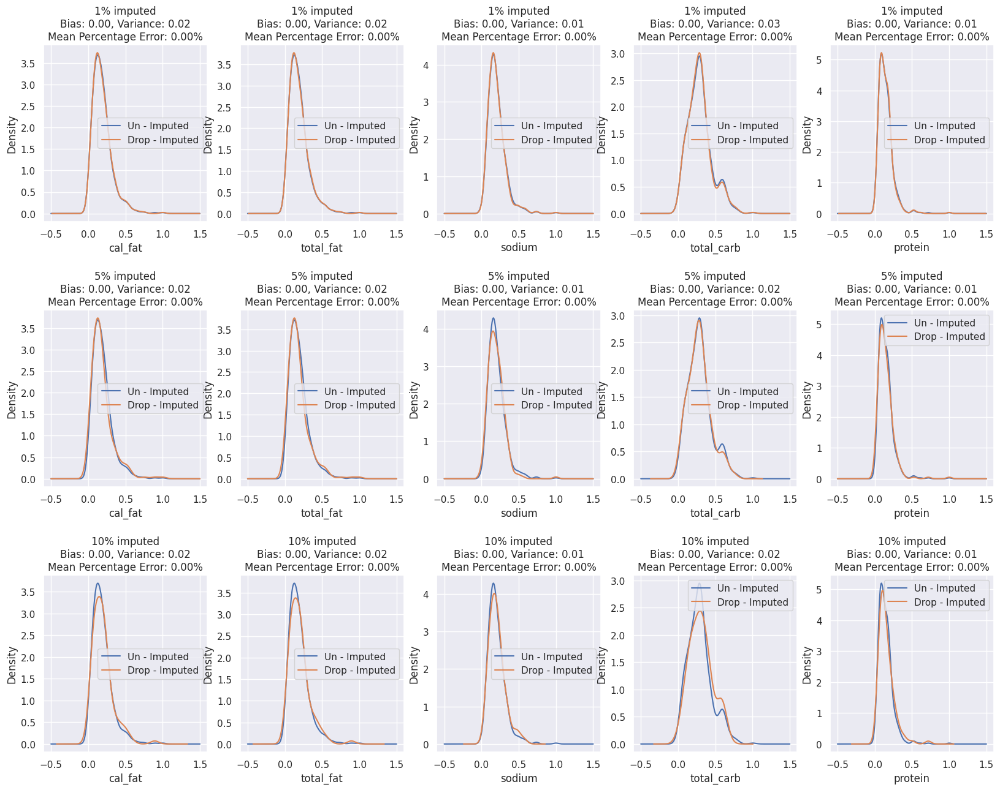

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate bias, variance, and mean percentage error
def calculate_metrics(original, imputed):
    bias = np.mean(imputed - original)
    variance = np.var(imputed)
    mean_percentage_error = np.mean(np.abs((original - imputed) / original)) * 100
    return bias, variance, mean_percentage_error

# Assuming numeric_columns is the list of columns you want to visualize
cols = numeric_columns

# Imputation levels
imputation_levels = [1, 5, 10]

# Increase vertical space between plots
plt.figure(figsize=(20, 15))
plt.subplots_adjust(hspace=0.5)

i = 1  # Initialize subplot index

for level in imputation_levels:
    for col in cols:
        plt.subplot(3, len(cols), i)
        i += 1

        # Original data
        data[col].plot(kind="kde")

        # Imputed data using drop imputation
        imputed_col = f'nan_{level}p_df_drop'
        globals()[imputed_col][col].plot(kind="kde")

        # Calculate metrics
        bias, variance, mean_percentage_error = calculate_metrics(data[col], globals()[imputed_col][col])

        # Display metrics in the title
        plt.title(f'{level}% imputed\nBias: {bias:.2f}, Variance: {variance:.2f}\nMean Percentage Error: {mean_percentage_error:.2f}%')
        plt.legend(["Un - Imputed", "Drop - Imputed"])
        plt.xlabel(f"{col}")

# Show the plots
plt.show()


**Checking how well impute : KNN**

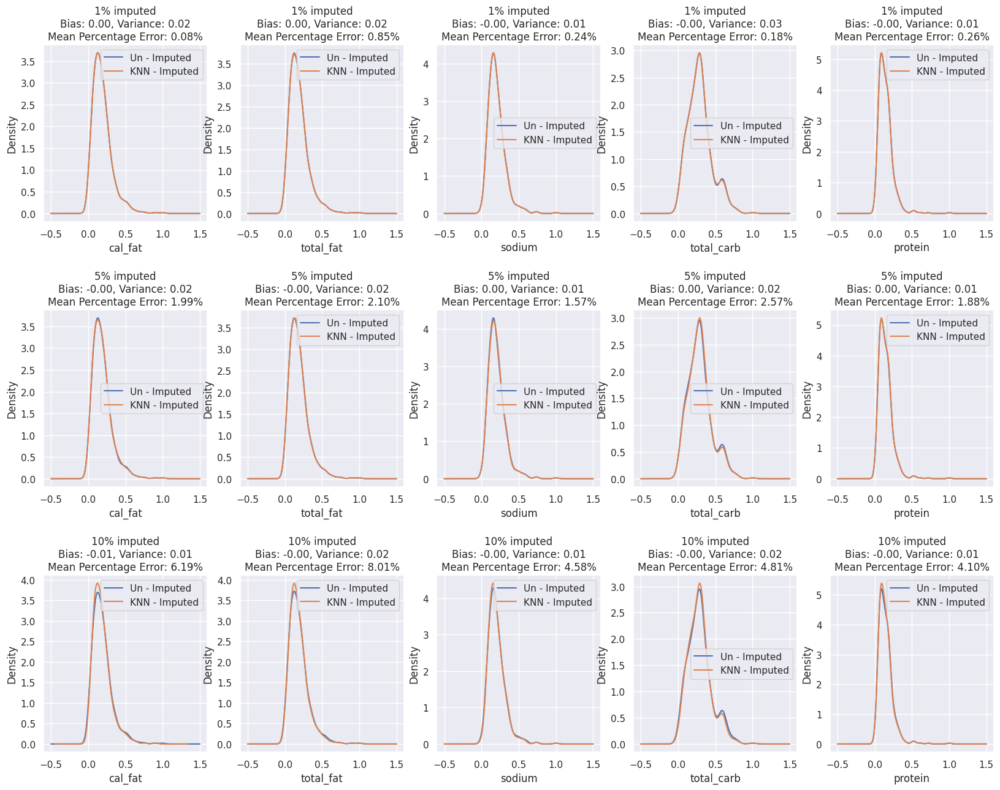

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate bias, variance, and mean percentage error
def calculate_metrics(original, imputed):
    bias = np.mean(imputed - original)
    variance = np.var(imputed)
    mean_percentage_error = np.mean(np.abs((original - imputed) / original)) * 100
    return bias, variance, mean_percentage_error

# Assuming numeric_columns is the list of columns you want to visualize
cols = numeric_columns

# Imputation levels
imputation_levels = [1, 5, 10]

# Increase vertical space between plots
plt.figure(figsize=(20, 15))
plt.subplots_adjust(hspace=0.5)

i = 1  # Initialize subplot index

for level in imputation_levels:
    for col in cols:
        plt.subplot(3, len(cols), i)
        i += 1

        # Original data
        data[col].plot(kind="kde")

        # Imputed data using KNN imputation
        imputed_col = f'nan_{level}p_df_knn'
        globals()[imputed_col][col].plot(kind="kde")

        # Calculate metrics
        bias, variance, mean_percentage_error = calculate_metrics(data[col], globals()[imputed_col][col])

        # Display metrics in the title
        plt.title(f'{level}% imputed\nBias: {bias:.2f}, Variance: {variance:.2f}\nMean Percentage Error: {mean_percentage_error:.2f}%')
        plt.legend(["Un - Imputed", "KNN - Imputed"])
        plt.xlabel(f"{col}")

# Show the plots
plt.show()

Observation:

1. Looking at the distribution of impujted data we can observe when imputation is less i.e. 1% then any method works fine for my dataset but as the amount increases to 5% and then to 10% taking mean to replace values causes huge variance.

2. Dropping the missing data doesn't affect the distribution much but we lose out on valuable training data which is observed by looking at the shape of imputed dataframe.

# Question 13: For categorical data, calculate the accuracy and a confusion matrix.

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
# Select features and target variable
features = ['restaurant','item','salad']
target_variable = 'calories'

X = data[features]
y = data[target_variable]

# Encode categorical variables (assuming they are not already encoded)
label_encoder = LabelEncoder()
X_encoded = X.apply(label_encoder.fit_transform)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Initialize a decision tree classifier
classifier = DecisionTreeClassifier(random_state=42)

# Train the classifier
classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Accuracy: 0.02912621359223301
Confusion Matrix:
[[0 0 1 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
from sklearn.metrics import accuracy_score

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.02912621359223301


# AutoML FastFood Nutrition

# Importing required Libraries and H20 Initialization

In [ ]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install matplotlib

In [ ]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 2.3 MB/s eta 0:00:00


In [ ]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [ ]:
min_mem_size=6
run_time=222

In [ ]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

6


In [ ]:
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:32128..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmppuybtitg
  JVM stdout: /tmp/tmppuybtitg/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmppuybtitg/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:32128
Connecting to H2O server at http://127.0.0.1:32128 ... successful.


H2O_cluster_uptime:,08 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,19 days
H2O_cluster_name:,H2O_from_python_unknownUser_fammhm
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


# Importing Data

In [ ]:
# Import the processed data from notebook One
url = "https://raw.githubusercontent.com/SaiPranaviJeedigunta/DEMG_assignments/main/DSEM_0022415588/fastfood.csv"
df = h2o.import_file(path = url)
dff = pd.read_csv('https://raw.githubusercontent.com/SaiPranaviJeedigunta/DEMG_assignments/main/DSEM_0022415588/fastfood.csv')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
dff.head()

,restaurant,item,calories,cal_fat,total_fat,sat_fat,trans_fat,cholesterol,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium,salad
0,Mcdonalds,Artisan Grilled Chicken Sandwich,380,60,7,2.0,0.0,95,1110,44,3.0,11,37.0,4.0,20.0,20.0,Other
1,Mcdonalds,Single Bacon Smokehouse Burger,840,410,45,17.0,1.5,130,1580,62,2.0,18,46.0,6.0,20.0,20.0,Other
2,Mcdonalds,Double Bacon Smokehouse Burger,1130,600,67,27.0,3.0,220,1920,63,3.0,18,70.0,10.0,20.0,50.0,Other
3,Mcdonalds,Grilled Bacon Smokehouse Chicken Sandwich,750,280,31,10.0,0.5,155,1940,62,2.0,18,55.0,6.0,25.0,20.0,Other
4,Mcdonalds,Crispy Bacon Smokehouse Chicken Sandwich,920,410,45,12.0,0.5,120,1980,81,4.0,18,46.0,6.0,20.0,20.0,Other


# Studying the Data

In [ ]:
dff.describe()

,calories,cal_fat,total_fat,sat_fat,trans_fat,cholesterol,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium
count,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,515.000000,503.000000,515.000000,514.000000,301.000000,305.000000,305.000000
mean,530.912621,238.813592,26.590291,8.153398,0.465049,72.456311,1246.737864,45.664078,4.137177,7.262136,27.891051,18.857143,20.170492,24.852459
std,282.436147,166.407510,18.411876,6.418811,0.839644,63.160406,689.954278,24.883342,3.037460,6.761301,17.683921,31.384330,30.592243,25.522073
min,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,330.000000,120.000000,14.000000,4.000000,0.000000,35.000000,800.000000,28.500000,2.000000,3.000000,16.000000,4.000000,4.000000,8.000000
50%,490.000000,210.000000,23.000000,7.000000,0.000000,60.000000,1110.000000,44.000000,3.000000,6.000000,24.500000,10.000000,10.000000,20.000000
75%,690.000000,310.000000,35.000000,11.000000,1.000000,95.000000,1550.000000,57.000000,5.000000,9.000000,36.000000,20.000000,30.000000,30.000000
max,2430.000000,1270.000000,141.000000,47.000000,8.000000,805.000000,6080.000000,156.000000,17.000000,87.000000,186.000000,180.000000,400.000000,290.000000


Text(0.5, 1.0, 'Variable Correlation')

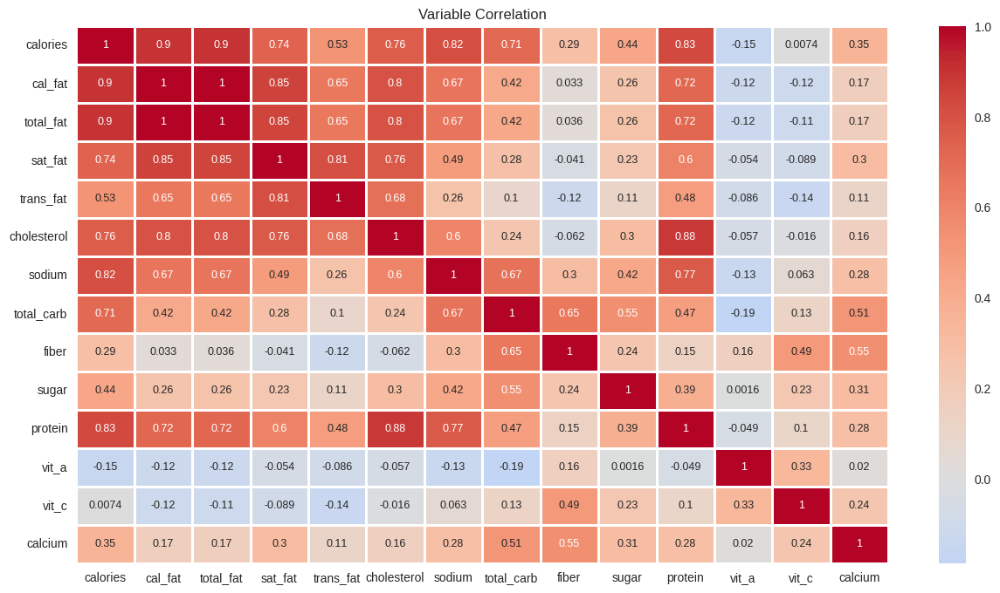

In [ ]:
#Representing Matrix as a plot
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(15,8))

sns.heatmap(dff.corr(),center=0, linewidths=0.8,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

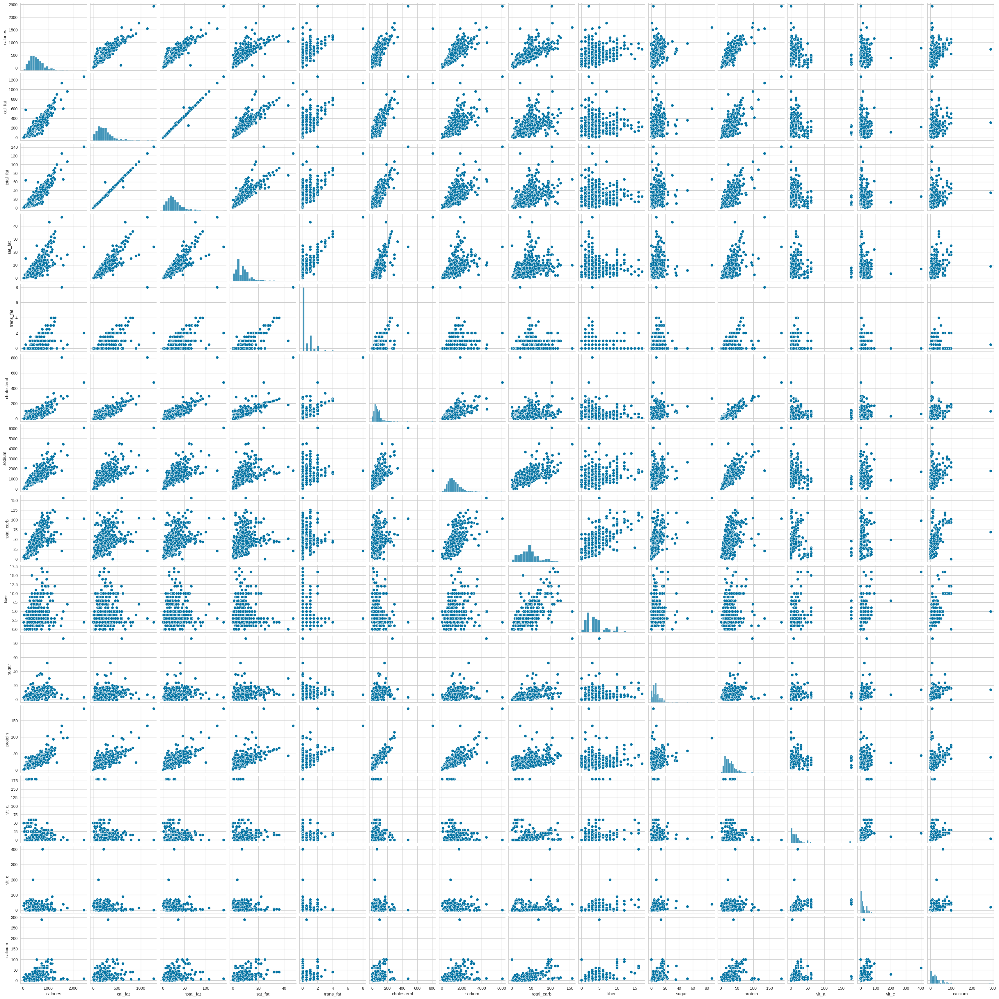

In [ ]:
sns.pairplot(
    dff
)  # All attributes are plotted against each other to see the pattern of distribution

In [ ]:
df.columns

['restaurant',
 'item',
 'calories',
 'cal_fat',
 'total_fat',
 'sat_fat',
 'trans_fat',
 'cholesterol',
 'sodium',
 'total_carb',
 'fiber',
 'sugar',
 'protein',
 'vit_a',
 'vit_c',
 'calcium',
 'salad']

In [ ]:
df.types

{'restaurant': 'enum',
 'item': 'string',
 'calories': 'int',
 'cal_fat': 'int',
 'total_fat': 'int',
 'sat_fat': 'real',
 'trans_fat': 'real',
 'cholesterol': 'int',
 'sodium': 'int',
 'total_carb': 'int',
 'fiber': 'int',
 'sugar': 'int',
 'protein': 'int',
 'vit_a': 'int',
 'vit_c': 'int',
 'calcium': 'int',
 'salad': 'enum'}

In [ ]:
df.shape

(515, 17)

In [ ]:
# Create a 80/20 train/test split
pct_rows=0.80
df_train, df_test = df.split_frame([pct_rows])

In [ ]:
print(df_train.shape)
print(df_test.shape)

(418, 17)
(97, 17)


In [ ]:
#Display all columns in X
X=df.columns
print(X)

['restaurant', 'item', 'calories', 'cal_fat', 'total_fat', 'sat_fat', 'trans_fat', 'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium', 'salad']


In [ ]:
#Seperate Dependent variable from Independent variable
y_numeric ='calories'
X.remove(y_numeric)
print(X)

['restaurant', 'item', 'cal_fat', 'total_fat', 'sat_fat', 'trans_fat', 'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium', 'salad']


In [ ]:
dfpd=pd.read_csv("https://raw.githubusercontent.com/SaiPranaviJeedigunta/DEMG_assignments/main/DSEM_0022415588/fastfood.csv")

# H2O AutoML Execution

In [ ]:
# Set up AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [ ]:
#pass the data through H20AutoML
aml.train(x=X,y=y_numeric,training_frame=df_train)

AutoML progress: |
03:26:39.981: _train param, Dropping bad and constant columns: [item, salad]

███
03:26:47.592: _train param, Dropping bad and constant columns: [item, salad]


03:26:49.674: _train param, Dropping bad and constant columns: [item, salad]

█
03:26:53.805: _train param, Dropping unused columns: [item, salad]


03:26:54.103: _train param, Dropping bad and constant columns: [item, salad]

██
03:26:58.837: _train param, Dropping bad and constant columns: [item, salad]

██
03:27:06.376: _train param, Dropping bad and constant columns: [item, salad]

█
03:27:08.823: _train param, Dropping bad and constant columns: [item, salad]


03:27:11.527: _train param, Dropping bad and constant columns: [item, salad]

█
03:27:13.359: _train param, Dropping unused columns: [item, salad]
03:27:13.600: _train param, Dropping unused columns: [item, salad]
03:27:13.862: _train param, Dropping bad and constant columns: [item, salad]

██
03:27:20.426: _train param, Dropping bad and constant c

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_1_AutoML_1_20240402_32639


GLM Model: summary
    family    link      regularization              lambda_search                                                                   number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  --------------------------  ------------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------------------------------------
    gaussian  identity  Ridge ( lambda = 0.02639 )  nlambda = 30, lambda.max = 26391.0, lambda.min = 0.02639, lambda.1se = 0.06843  21                            21                             30                      AutoML_1_20240402_32639_training_py_2_sid_bfe7

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 300.0511876206288
RMSE: 17.321985671990056
MAE: 9.788876241638434
RMSLE: 0.03294567232778414
Mean Residual Deviance: 300.0511876206288
R^2: 0.9963771459815421
Null degrees of freedom: 417
Residual degrees of freedom: 396
Null deviance: 34619500.478468895
Residual deviance: 125421.39642542285
AIC: 3616.4850034995434

ModelMetricsRegressionGLM: glm
** Reported on cross-validation data. **

MSE: 663.6990552626677
RMSE: 25.762357331243344
MAE: 12.096329117487565
RMSLE: 0.03740484366114401
Mean Residual Deviance: 663.6990552626677
R^2: 0.9919864180226304
Null degrees of freedom: 417
Residual degrees of freedom: 396
Null deviance: 34877181.84489141
Residual deviance: 277426.2050997951
AIC: 3948.3250591441197

Cross-Validation Metrics Summary: 
                        mean         sd           cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  -----------  -----------  ------------  ------------  ------------  ------------  ------------
aic                     796.051      79.4306      708.064       742.833       909.099       782.863       837.395
loglikelihood           0            0            0             0             0             0             0
mae                     12.1013      2.42422      9.48783       10.7982       13.9506       10.9643       15.3054
mean_residual_deviance  663.467      631.096      155.064       234.57        1697.83       419.89        809.978
mse                     663.467      631.096      155.064       234.57        1697.83       419.89        809.978
null_deviance           6.97544e+06  2.00525e+06  5.59214e+06   5.69766e+06   6.71326e+06   6.41266e+06   1.04615e+07
r2                      0.992137     0.00767054   0.997516      0.99651       0.978722      0.994529      0.993408
residual_deviance       55485.2      53006.8      13025.4       19703.9       142618        34850.9       67228.2
rmse                    23.5848      11.577       12.4525       15.3157       41.2047       20.4912       28.4601
rmsle                   0.037396     0.00103244   0.0368555     0.0359181     0.0383429     0.0375335     0.0383299

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train      deviance_xval       deviance_se         alpha    iterations    training_rmse       training_deviance    training_mae       training_r2
---  -------------------  ----------  -----------  --------  ------------  ------------------  ------------------  ------------------  -------  ------------  ------------------  -------------------  -----------------  ------------------
     2024-04-02 03:26:49  0.000 sec   1            .26E5     22            82788.31652912138   83497.91603317733   10937.163772311587  0.0
     2024-04-02 03:26:49  0.001 sec   2            .16E5     22            82767.91265178376   83481.41785792536   10935.492982926471  0.0
     2024-04-02 03:26:49  0.003 sec   3            .1E5      22            82735.06919495334   83454.85979476632   10932.803255929177

**Interpreting the above results**

The model trained is a Generalized Linear Model (GLM).

The model key is GLM_1_AutoML_1_20240218_204428.

The model uses Ridge regularization with a lambda value of 0.02686.

The model is trained on the specified training frame.

**Model Metrics**:

Reported on the training data (train data):

Mean Squared Error (MSE): 2371.79

Root Mean Squared Error (RMSE): 48.70

Mean Absolute Error (MAE): 15.15

Root Mean Squared Logarithmic Error (RMSLE): 0.1206

R-squared (R^2): 0.9728

Reported on cross-validation data (cross-validation data):

MSE: 2906.82

RMSE: 53.91

MAE: 17.98

RMSLE: 0.1256

R^2: 0.9666

Additional metrics such as Null Deviance, Residual Deviance, AIC, etc., are also reported.

**Variable Importances**:

Shows the relative importance of each variable in the model.

Variables like total_carb, cal_fat, total_fat, etc., are ranked based on their importance in predicting the target variable.

**Scoring History**:

Shows the scoring history of the model during training.

Includes metrics like Deviance, RMSE, MAE, R^2, etc., for each iteration.

In [ ]:
print(aml.leaderboard)

model_id                                                   rmse       mse      mae      rmsle    mean_residual_deviance
GLM_1_AutoML_1_20240402_32639                           25.7624   663.699  12.0963  0.0374048                   663.699
StackedEnsemble_BestOfFamily_1_AutoML_1_20240402_32639  30.0574   903.446  12.9472  0.0379986                   903.446
StackedEnsemble_BestOfFamily_3_AutoML_1_20240402_32639  30.2678   916.139  12.9036  0.0425608                   916.139
StackedEnsemble_BestOfFamily_2_AutoML_1_20240402_32639  31.1562   970.71   12.7541  0.0490518                   970.71
StackedEnsemble_BestOfFamily_4_AutoML_1_20240402_32639  32.0027  1024.17   13.7578  0.0439135                  1024.17
StackedEnsemble_AllModels_1_AutoML_1_20240402_32639     32.0544  1027.48   12.8296  0.0386882                  1027.48
StackedEnsemble_AllModels_2_AutoML_1_20240402_32639     32.3656  1047.53   12.9608  0.0448878                  1047.53
DeepLearning_grid_1_AutoML_1_20240402_32639_

# Analysing relation between all variables

I have plotted all independent variables against the 'calories' variable and observed that a roughly linear relationship is obtained, it suggests that there may be a linear relationship between the 'calories' variable and each of the independent variables individually.

A linear relationship implies that as the independent variable increases (or decreases), the 'calories' variable also increases (or decreases) in a roughly linear fashion. This can be visually represented as a straight line when the data points are plotted on a scatter plot.

It's important to note that while individual independent variables may show a linear relationship with the 'calories' variable, the overall relationship in a multivariate setting (where multiple independent variables are considered together) may not be strictly linear. In multivariate analysis, other factors such as interactions between variables and nonlinear effects may also play a role in determining the 'calories' variable.

VIF stands for Variance Inflation Factor.It signifies multicollinearity among set of different independent variable. A value greater than 10 means that the independent variable is highly correlated with some other variable. Will calculate VIF value for all variables to check the dependency and then will drop the variables with high VIF value.

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Selecting variables for VIF calculation
Multic = dfpd[['cal_fat', 'total_fat', 'sat_fat', 'trans_fat', 'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium']]

# Replace infinite values with NaNs
Multic.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with missing values
Multic.dropna(inplace=True)

# Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]

# Check for infinite VIF values
if np.any(np.isinf(vif["VIF"])):
    print("Warning: One or more variables have infinite VIF.")

# Drop variables with high VIF
threshold_vif = 10
high_vif_variables = vif[vif["VIF"] > threshold_vif]["variables"]
Multic_dropped = Multic.drop(columns=high_vif_variables)

# Print the variables with high VIF
print("Variables with high VIF:", high_vif_variables)

# Print the remaining variables after dropping those with high VIF
print("Remaining variables after dropping high VIF variables:", Multic_dropped.columns)

Variables with high VIF: 0        cal_fat
1      total_fat
2        sat_fat
4    cholesterol
5         sodium
6     total_carb
7          fiber
9        protein
Name: variables, dtype: object
Remaining variables after dropping high VIF variables: Index(['trans_fat', 'sugar', 'vit_a', 'vit_c', 'calcium'], dtype='object')


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

Multic = dfpd[['cal_fat', 'total_fat', 'sat_fat', 'trans_fat', 'sodium', 'total_carb', 'fiber', 'sugar','cholesterol','protein', 'vit_a', 'vit_c', 'calcium']]

# Replace infinite values with NaNs
Multic.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with missing values
Multic.dropna(inplace=True)


# Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif

,variables,VIF
0,cal_fat,2273.864243
1,total_fat,2279.399928
2,sat_fat,24.795866
3,trans_fat,5.146655
4,sodium,20.427772
5,total_carb,26.329045
6,fiber,11.032909
7,sugar,4.761812
8,cholesterol,71.314226
9,protein,75.243221


In [ ]:
import statsmodels.formula.api as smf

# Define the formula for OLS regression with significant variables
formula = 'calories ~ total_fat + cal_fat + sat_fat + trans_fat + sodium + total_carb + fiber + sugar + protein + vit_a + vit_c + calcium'

# Fit the OLS model
results = smf.ols(formula=formula, data=dfpd).fit()

# Print the summary of the regression results
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:               calories   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     750.3
Date:                Tue, 02 Apr 2024   Prob (F-statistic):          2.74e-209
Time:                        03:30:24   Log-Likelihood:                -1618.8
No. Observations:                 301   AIC:                             3264.
Df Residuals:                     288   BIC:                             3312.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.5689      7.716      0.333      0.7

Dropping variables

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Select the remaining independent variables
Multic = dfpd[['cal_fat', 'trans_fat', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium']]

# Replace infinite values with NaNs
Multic.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with missing values
Multic.dropna(inplace=True)

# Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif


,variables,VIF
0,cal_fat,12.720544
1,trans_fat,2.720738
2,sodium,19.415966
3,total_carb,21.152856
4,fiber,10.794819
5,sugar,4.012308
6,protein,13.814215
7,vit_a,1.642425
8,vit_c,2.400748
9,calcium,3.109548


In [ ]:
# Define the new formula for OLS regression
formula = 'calories ~  cal_fat + trans_fat + sodium + total_carb + fiber + sugar + protein + vit_a + vit_c + calcium'

# Fit the new OLS model
results = smf.ols(formula=formula, data=dfpd).fit()

# Print the summary of the new regression results
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:               calories   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     899.1
Date:                Tue, 02 Apr 2024   Prob (F-statistic):          9.68e-212
Time:                        03:30:25   Log-Likelihood:                -1620.1
No. Observations:                 301   AIC:                             3262.
Df Residuals:                     290   BIC:                             3303.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.7720      7.381      0.647      0.5

**Comparing the regression results before and after dropping 'sat_fat', 'total_fat', and 'cholesterol':**

Before dropping 'sat_fat', 'total_fat', and 'cholesterol':

R-squared: 0.969
Adj. R-squared: 0.968
F-statistic: 815.2
AIC: 3264
BIC: 3308
After dropping 'sat_fat', 'total_fat', and 'cholesterol':

R-squared: 0.969
Adj. R-squared: 0.968
F-statistic: 899.1
AIC: 3262
BIC: 3303
Interpretation:

The R-squared and Adj. R-squared values remain the same before and after dropping 'sat_fat', 'total_fat', and 'cholesterol', indicating that the overall fit of the model remains consistent.
The F-statistic increases from 815.2 to 899.1 after dropping the variables, indicating that the overall significance of the model has improved.
The AIC decreases slightly from 3264 to 3262, and the BIC decreases more noticeably from 3308 to 3303 after dropping the variables. This suggests that the new model with fewer variables is a better fit and is more parsimonious.
Overall, dropping 'sat_fat', 'total_fat', and 'cholesterol' seems to have improved the model's performance slightly, as indicated by the increase in the F-statistic and the decrease in the AIC and BIC.

# Correlation Analysis

Now, The correlation matrix is simply a table of correlations.Each random variable in the table is correlated with each of the other values in the table. This allows us to see which pairs have the highest correlation.It also tells us if it is directly dependent or inversely by signifying the positive and negative signs.



In [ ]:
#Dopping the unecessary features as discussed above
dfpd1=dfpd.drop(['sat_fat', 'total_fat', 'cholesterol'], axis=1)

In [ ]:
dfpd1

,restaurant,item,calories,cal_fat,trans_fat,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium,salad
0,Mcdonalds,Artisan Grilled Chicken Sandwich,380,60,0.0,1110,44,3.0,11,37.0,4.0,20.0,20.0,Other
1,Mcdonalds,Single Bacon Smokehouse Burger,840,410,1.5,1580,62,2.0,18,46.0,6.0,20.0,20.0,Other
2,Mcdonalds,Double Bacon Smokehouse Burger,1130,600,3.0,1920,63,3.0,18,70.0,10.0,20.0,50.0,Other
3,Mcdonalds,Grilled Bacon Smokehouse Chicken Sandwich,750,280,0.5,1940,62,2.0,18,55.0,6.0,25.0,20.0,Other
4,Mcdonalds,Crispy Bacon Smokehouse Chicken Sandwich,920,410,0.5,1980,81,4.0,18,46.0,6.0,20.0,20.0,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
510,Taco Bell,Spicy Triple Double Crunchwrap,780,340,0.5,1850,87,9.0,8,23.0,20.0,10.0,25.0,Other
511,Taco Bell,Express Taco Salad w/ Chips,580,260,1.0,1270,59,8.0,7,23.0,NaN,NaN,NaN,Other
512,Taco Bell,Fiesta Taco Salad-Beef,780,380,1.0,1340,74,11.0,7,26.0,NaN,NaN,NaN,Other
513,Taco Bell,Fiesta Taco Salad-Chicken,720,320,0.0,1260,70,8.0,8,32.0,NaN,NaN,NaN,Other


The correlation matrix is simply a table of correlations.Each random variable in the table is correlated with each of the other values in the table. This allows us to see which pairs have the highest correlation.It also tells us if it is directly dependent or inversely by signifying the positive and negative signs.



In [ ]:
#Calculating correlation matrix for all variables
dfpd1.corr()

,calories,cal_fat,trans_fat,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium
calories,1.000000,0.901661,0.530354,0.817855,0.712701,0.287031,0.437711,0.831957,-0.153963,0.007387,0.351207
cal_fat,0.901661,1.000000,0.648422,0.670458,0.419373,0.032643,0.255485,0.720379,-0.121748,-0.115456,0.166801
trans_fat,0.530354,0.648422,1.000000,0.261466,0.100284,-0.121890,0.112651,0.478960,-0.086352,-0.141754,0.114094
sodium,0.817855,0.670458,0.261466,1.000000,0.671976,0.301023,0.422993,0.766942,-0.134031,0.062994,0.284882
total_carb,0.712701,0.419373,0.100284,0.671976,1.000000,0.648839,0.547026,0.474396,-0.187004,0.128177,0.514463
fiber,0.287031,0.032643,-0.121890,0.301023,0.648839,1.000000,0.236475,0.148053,0.157631,0.491224,0.546734
sugar,0.437711,0.255485,0.112651,0.422993,0.547026,0.236475,1.000000,0.389959,0.001626,0.229223,0.310559
protein,0.831957,0.720379,0.478960,0.766942,0.474396,0.148053,0.389959,1.000000,-0.049423,0.100523,0.284497
vit_a,-0.153963,-0.121748,-0.086352,-0.134031,-0.187004,0.157631,0.001626,-0.049423,1.000000,0.332259,0.019624
vit_c,0.007387,-0.115456,-0.141754,0.062994,0.128177,0.491224,0.229223,0.100523,0.332259,1.000000,0.236129


The correlation matrix above shows the correlation coefficients between the variables in the dataset. Here are some observations:

Calories have a strong positive correlation with cal_fat (0.9017), sodium (0.8179), total_carb (0.7127), and protein (0.8320). These variables might be important predictors of calorie content.

Fiber has moderate positive correlations with total_carb (0.6488) and protein (0.1481).

Vit_C has a moderate positive correlation with fiber (0.4912) and a weak positive correlation with sugar (0.2292).

Calcium has moderate positive correlations with fiber (0.5467) and total_carb (0.5145).


Text(0.5, 1.0, 'Variable Correlation')

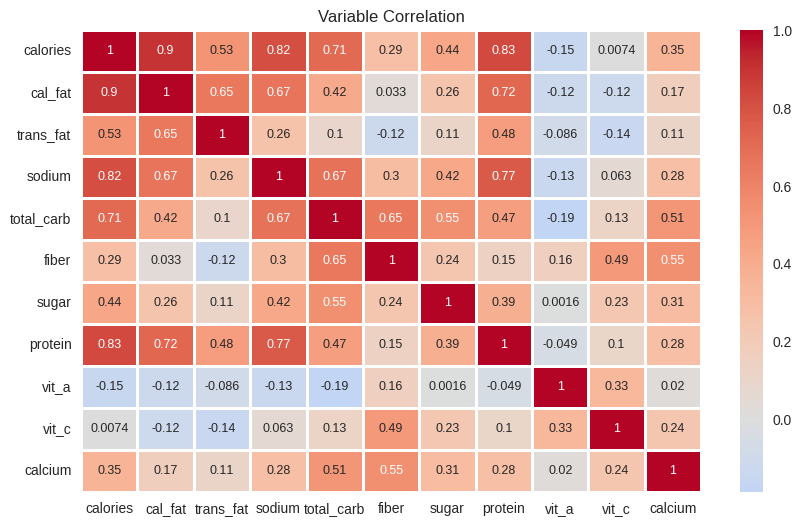

In [ ]:
#Representing Matrix as a plot
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(10,6))

sns.heatmap(dfpd1.corr(),center=0, linewidths=0.8,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

Plotting all variables against other variables to see if relation exists between them. Basically it tells the same thing as correlation matrix but in a graphical way.

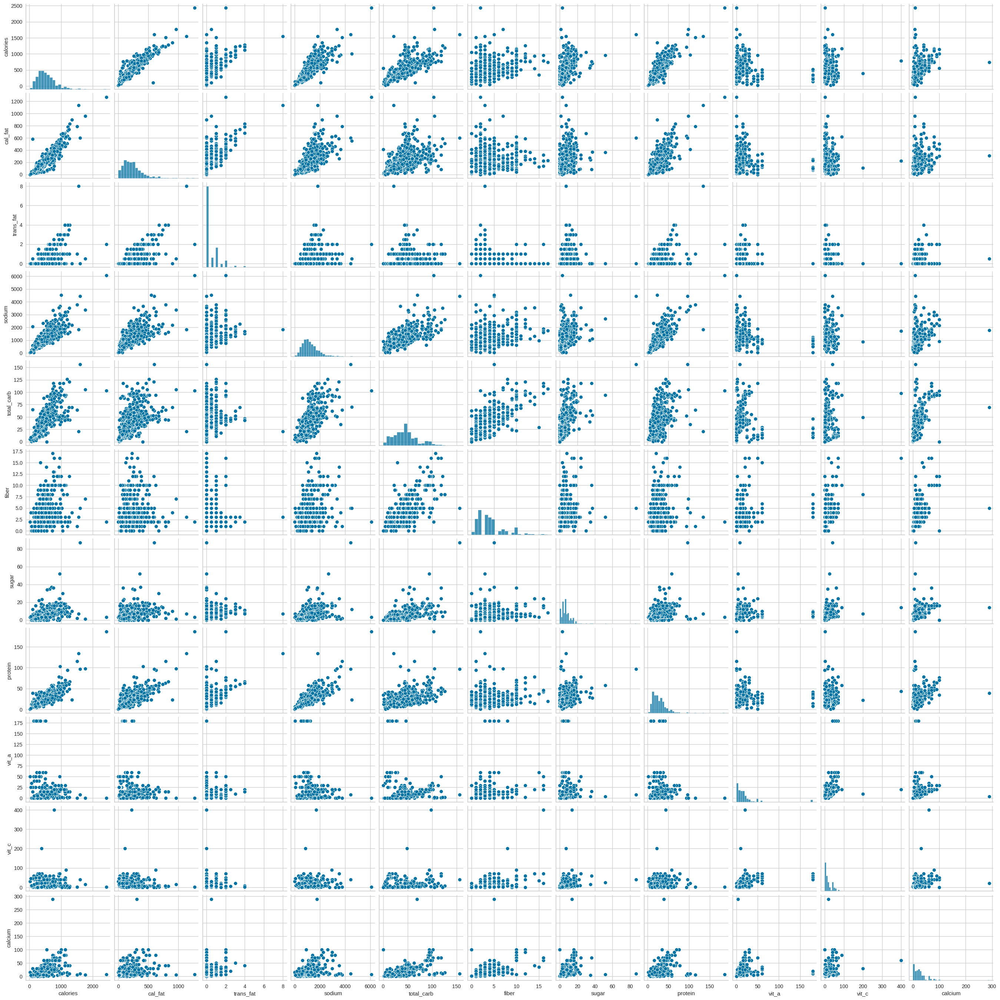

In [ ]:
sns.pairplot(dfpd1)

# H20 AutoML Rexecution on new model

Here, we are repeating the entire process exactly as above whilst ignoring the unecessary features. Dropping the variables that are not significant for determining calories. Dropping total_fat and cholesterol

In [ ]:
df1 = dfpd1

In [ ]:
import h2o

# Convert pandas DataFrame df1 to H2OFrame
df1 = h2o.H2OFrame(df1)

# Now you can use the split_frame method
df1_train, df1_test = df1.split_frame([pct_rows])

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
X1=df1.columns
print(X1)

['restaurant', 'item', 'calories', 'cal_fat', 'trans_fat', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium', 'salad']


In [ ]:
#Seperate Dependent variable from Independent variable
y1_numeric ='calories'
X1.remove(y1_numeric)
print(X1)

['restaurant', 'item', 'cal_fat', 'trans_fat', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium', 'salad']


In [ ]:
aml1 = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [ ]:
aml1.train(x=X1,y=y1_numeric,training_frame=df1_train)

AutoML progress: |
03:31:28.662: _train param, Dropping bad and constant columns: [item, salad]

██
03:31:33.654: _train param, Dropping bad and constant columns: [item, salad]
03:31:34.18: _train param, Dropping bad and constant columns: [item, salad]


03:31:34.938: _train param, Dropping unused columns: [item, salad]
03:31:35.66: _train param, Dropping bad and constant columns: [item, salad]

██
03:31:38.263: _train param, Dropping bad and constant columns: [item, salad]

█
03:31:40.196: _train param, Dropping bad and constant columns: [item, salad]

█
03:31:41.474: _train param, Dropping bad and constant columns: [item, salad]

█
03:31:43.992: _train param, Dropping bad and constant columns: [item, salad]

██
03:31:46.243: _train param, Dropping unused columns: [item, salad]
03:31:46.411: _train param, Dropping unused columns: [item, salad]
03:31:46.553: _train param, Dropping bad and constant columns: [item, salad]

██
03:31:49.71: _train param, Dropping bad and constant columns: 

key,value
Stacking strategy,cross_validation
Number of base models (used / total),2/4
# GBM base models (used / total),1/1
# XGBoost base models (used / total),0/1
# GLM base models (used / total),1/1
# DRF base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [ ]:
print(aml1.leaderboard)

model_id                                                   rmse      mse      mae     rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_2_AutoML_2_20240402_33128  49.3839  2438.77  15.6974  0.120101                   2438.77
StackedEnsemble_BestOfFamily_3_AutoML_2_20240402_33128  49.3992  2440.28  15.7636  0.120042                   2440.28
GLM_1_AutoML_2_20240402_33128                           49.5337  2453.59  16.2645  0.120004                   2453.59
StackedEnsemble_BestOfFamily_4_AutoML_2_20240402_33128  49.9624  2496.24  16.2725  0.119008                   2496.24
StackedEnsemble_BestOfFamily_1_AutoML_2_20240402_33128  50.0825  2508.26  15.9935  0.119321                   2508.26
StackedEnsemble_AllModels_1_AutoML_2_20240402_33128     50.1829  2518.33  16.1249  0.117368                   2518.33
StackedEnsemble_AllModels_2_AutoML_2_20240402_33128     52.2037  2725.22  16.7677  0.12016                    2725.22
GBM_grid_1_AutoML_2_20240402_33128_model_7              

In [ ]:
#assign index values to all the models generated
model_index=0
glm_index=0
glm_model=''
aml1_leaderboard_df1=aml1.leaderboard.as_data_frame()
models_dict={}
for m in aml1_leaderboard_df1['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break
  model_index=model_index+1

for m in aml1_leaderboard_df1['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break
  glm_index=glm_index+1
models_dict

{'StackedEnsemble_BestOfFamily_2_AutoML_2_20240402_33128': 0,
 'StackedEnsemble_BestOfFamily_3_AutoML_2_20240402_33128': 1,
 'GLM_1_AutoML_2_20240402_33128': 2}

In [ ]:
#print the index value of best model
print(model_index)
best_model1 = h2o.get_model(aml1.leaderboard[model_index,'model_id'])

2


In [ ]:
best_model1.algo

'glm'

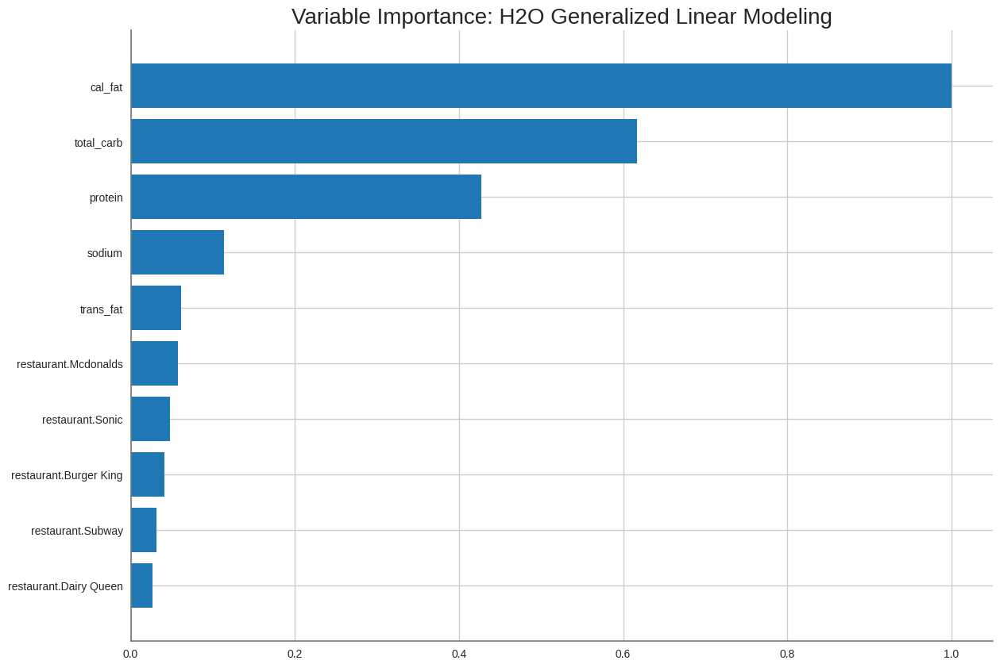

<Figure size 800x550 with 0 Axes>

In [ ]:
# Plot variable importances
if best_model1.algo in ['glm','drf','xrt','xgboost']:
    best_model1.varimp_plot()

In [ ]:
if glm_index is 0:
  print(glm_index)
  glm_model1=h2o.get_model(aml1.leaderboard[glm_index,'model_id'])
  print(glm_model1.algo)
  glm_model1.std_coef_plot()

# Checking if assumptions violated

Checking if the model has violated any assumptions. For linear regression some of the assumptions are:

(1)There needs to be linear relation between the independent and dependent variable.

(2)Homoscedasticity which means normality of the error distribution.The plot for residuals against target variable should be normally distributed.

(3)Thirdly, linear regression assumes that there is little or no multicollinearity in the data. Multicollinearity occurs when the independent variables are too highly correlated with each other.

(4)There should be no or little auto correlation. One way to test this is by Durbin-Watson test. The values should be brtween 1.5-2.5 for no autocorrelation.



In [ ]:
#Seperating the predictor and target variables
A=dfpd1.drop(['calories'],axis=1)
B=dfpd1['calories']

In [ ]:
#Splitting the data
A_train,A_test,b_train,b_test=tts(A,B,test_size=0.2,random_state=42)

Here we are check if the Homoscedasticity (normality of the error distribution) assumption is satisfies. A normal distribution of errors is expected.


In [ ]:
df1_train

restaurant,item,calories,cal_fat,trans_fat,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium,salad
Mcdonalds,Artisan Grilled Chicken Sandwich,380,60,0,1110,44,3,11,37,4,20,20,Other
Mcdonalds,Single Bacon Smokehouse Burger,840,410,1.5,1580,62,2,18,46,6,20,20,Other
Mcdonalds,Double Bacon Smokehouse Burger,1130,600,3,1920,63,3,18,70,10,20,50,Other
Mcdonalds,Grilled Bacon Smokehouse Chicken Sandwich,750,280,0.5,1940,62,2,18,55,6,25,20,Other
Mcdonalds,Crispy Bacon Smokehouse Chicken Sandwich,920,410,0.5,1980,81,4,18,46,6,20,20,Other
Mcdonalds,Cheeseburger,300,100,0.5,680,33,2,7,15,10,2,10,Other
Mcdonalds,Classic Chicken Sandwich,510,210,0,1040,49,3,6,25,0,4,2,Other
Mcdonalds,Double Quarter Pounder® with Cheese,770,400,2.5,1290,42,3,10,51,20,6,20,Other
Mcdonalds,Filet-O-Fish®,380,170,0,640,38,2,5,15,2,0,15,Other
Mcdonalds,Garlic White Cheddar Burger,620,300,1.5,790,48,3,11,32,10,10,35,Other


In [ ]:
df1_train.columns

['restaurant',
 'item',
 'calories',
 'cal_fat',
 'trans_fat',
 'sodium',
 'total_carb',
 'fiber',
 'sugar',
 'protein',
 'vit_a',
 'vit_c',
 'calcium',
 'salad']

In [ ]:
import statsmodels.api as sm

# Define the independent variables
cols1 = ['cal_fat', 'trans_fat', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium']

# Fit the OLS model
model1 = sm.OLS(b_train, sm.add_constant(A_train[cols1])).fit()

# Print the summary of the model
print(model1.summary())


                            OLS Regression Results                            
Dep. Variable:               calories   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     1302.
Date:                Tue, 02 Apr 2024   Prob (F-statistic):          1.30e-298
Time:                        03:35:48   Log-Likelihood:                -2178.0
No. Observations:                 412   AIC:                             4378.
Df Residuals:                     401   BIC:                             4422.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.8514      6.271      1.093      0.2

In [ ]:
print(A_train[cols1].isnull().sum())
print(np.isinf(A_train[cols1]).sum())

cal_fat         0
trans_fat       0
sodium          0
total_carb      0
fiber          10
sugar           0
protein         1
vit_a         169
vit_c         168
calcium       168
dtype: int64
cal_fat       0
trans_fat     0
sodium        0
total_carb    0
fiber         0
sugar         0
protein       0
vit_a         0
vit_c         0
calcium       0
dtype: int64


In [ ]:
A_train[cols1] = A_train[cols1].fillna(A_train[cols1].mean())

In [ ]:
b_pred = model1.predict(sm.add_constant(A_train[cols1]))

In [ ]:
residuals = b_train-b_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 1.509385928003009e-12


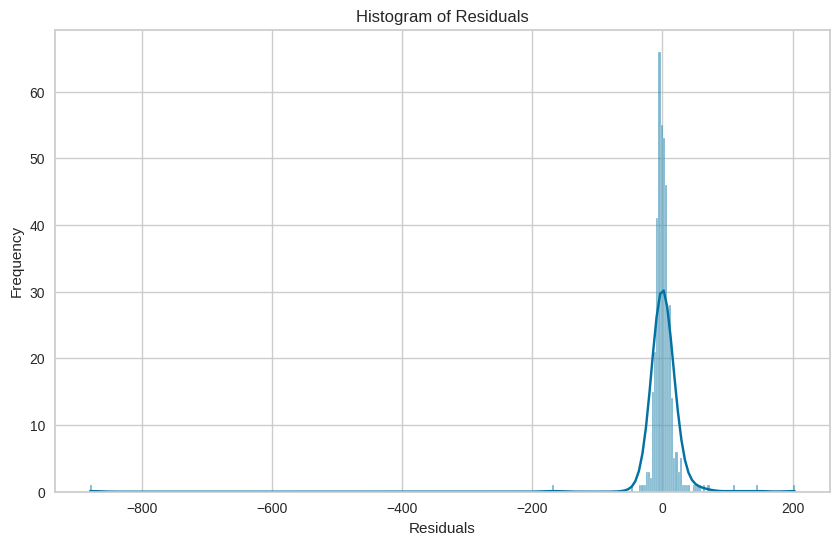

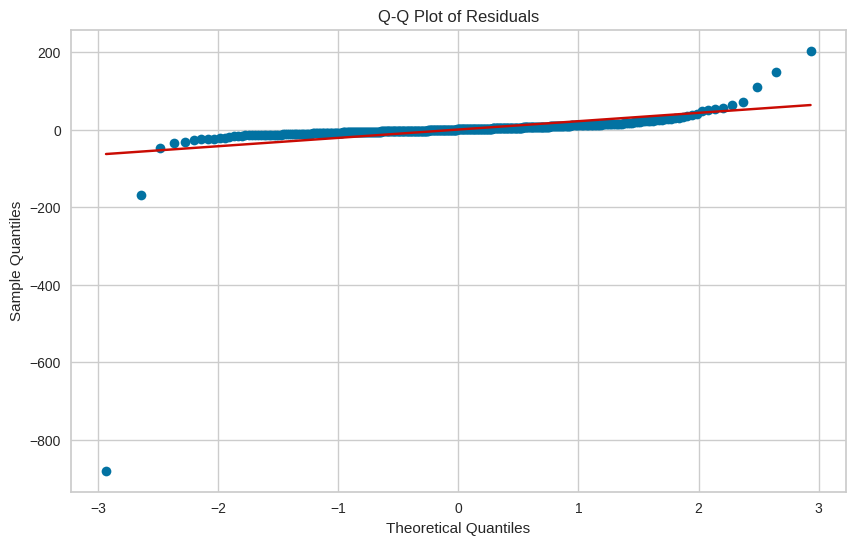

In [ ]:
# Plot histogram of residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Q-Q plot of residuals
plt.figure(figsize=(10, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')
plt.show()


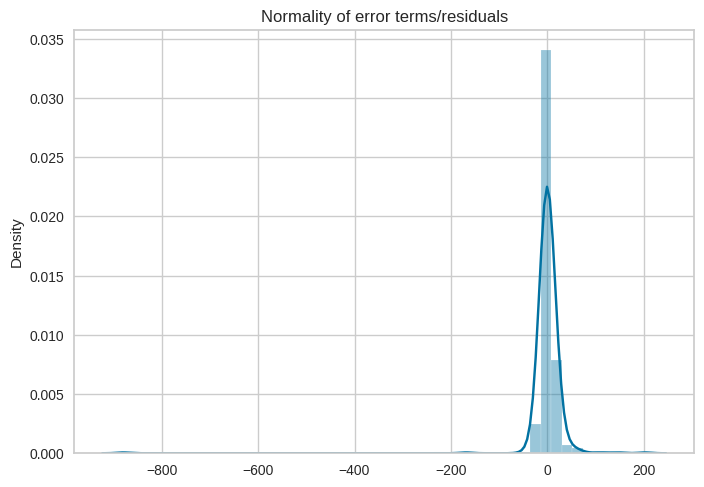

In [ ]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

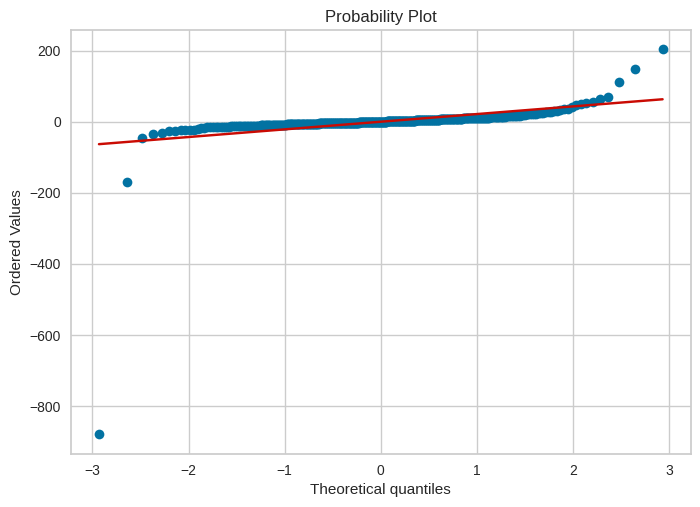

In [ ]:
import pylab
import scipy.stats as stats
stats.probplot(residuals, dist="norm", plot=pylab)
pylab.show()

<Axes: xlabel='calories', ylabel='Count'>

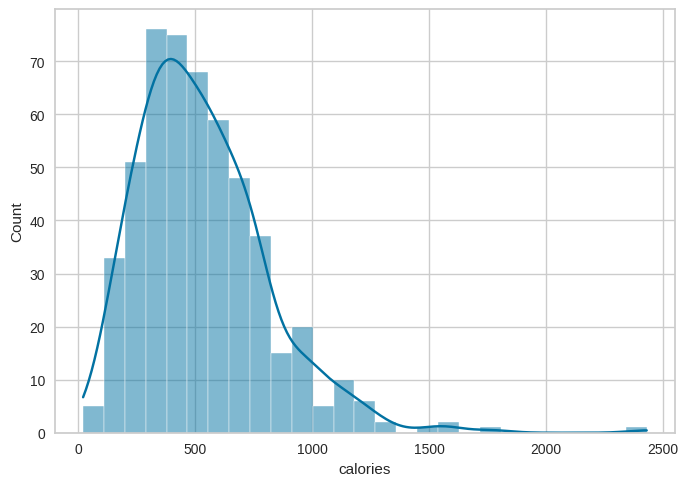

In [ ]:
sns.histplot(dfpd.calories, kde = True)

# Ridge Regularization in H20

The main purpose of regression is to find patterns in this underlying dataset and generalize it to predict the corresponding target value for some new values of independent values. But sometimes target dataset is inflicted with some random noise. Although there may not be error for training set it will give huge errors in predicting the correct target values for test dataset.To avoid this condition regularization is used. Regularization is a technique used for tuning the random noise function by adding an additional term to noise function. This additional term controls the excessively fluctuating function such that the coefficients don’t take extreme values and the prediction of target value for test data is not highly affected. For this model, Ridge Regularization is used.

Here, we use H2OGeneralizedLinearEstimator which would enable us to fit a generalized linear model, specified by a response variable, a set of predictors and a description of the error distribution.

In [ ]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
house_glm = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = 0, compute_p_values = True)
house_glm_regularization = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = .001, alpha = 0)

In [ ]:
house_glm_regularization.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712028270362_49


GLM Model: summary
    family    link      regularization            number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Ridge ( lambda = 0.001 )  18                            18                             1                       py_8_sid_bfe7

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 2095.3566484720586
RMSE: 45.775065794295244
MAE: 11.772134452556088
RMSLE: 0.1153066401448569
Mean Residual Deviance: 2095.3566484720586
R^2: 0.9747842570613541
Null degrees of freedom: 423
Residual degrees of freedom: 405
Null deviance: 35233196.22641508
Residual deviance: 888431.2189521528
AIC: 4485.790995817425

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective          training_rmse       training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  -----------------  ------------------  -------------------  ------------------  ------------------
    2024-04-02 03:35:58  0.000 sec   0             35233196.22641508          83097.16091135632
    2024-04-02 03:35:58  0.038 sec   1                                                           45.775065794295244  2095.3566484720586   11.772134452556088  0.9747842570613541

Variable Importances: 
variable                relative_importance    scaled_importance    percentage
----------------------  ---------------------  -------------------  ------------
cal_fat                 163.18                 1                    0.421977
total_carb              101.983                0.624972             0.263724
protein                 66.3456                0.40658              0.171567
restaurant.Sonic        13.3887                0.082049             0.0346228
sodium                  7.4569                 0.0456974            0.0192833
restaurant.Mcdonalds    7.23434                0.0443336            0.0187077
restaurant.Dairy Queen  5.92833                0.03633              0.0153304
trans_fat               4.45012                0.0272713            0.0115079
restaurant.Burger King  3.95236                0.0242209            0.0102207
restaurant.Arbys        2.20926                0.0135388            0.00571306
vit_a                   2.00384                0.01228              0.00518187
calcium                 1.64526                0.0100825            0.00425459
restaurant.Subway       1.5507                 0.00950301           0.00401005
sugar                   1.53523                0.00940822           0.00397005
fiber                   1.10343                0.00676207           0.00285344
restaurant.Chick Fil-A  1.05745                0.00648025           0.00273452
restaurant.Taco Bell    1.02378                0.00627392           0.00264745
vit_c                   0.65497                0.00401379           0.00169373

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

In [ ]:
#Model details without regularization
house_glm.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712028270362_50


GLM Model: summary
    family    link      regularization    number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ----------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  None              17                            17                             1                       py_8_sid_bfe7

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 2095.2267434673777
RMSE: 45.77364682289775
MAE: 11.708108030564174
RMSLE: 0.11526575561147766
Mean Residual Deviance: 2095.2267434673777
R^2: 0.9747858203518835
Null degrees of freedom: 423
Residual degrees of freedom: 406
Null deviance: 35233196.22641508
Residual deviance: 888376.1392301682
AIC: 4483.764708440775

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective          training_rmse      training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  -----------------  -----------------  -------------------  ------------------  ------------------
    2024-04-02 03:35:58  0.000 sec   0             35233196.22641508          83097.16091135632
    2024-04-02 03:35:58  0.036 sec   1                                                           45.77364682289775  2095.2267434673777   11.708108030564174  0.9747858203518835

Variable Importances: 
variable                relative_importance    scaled_importance    percentage
----------------------  ---------------------  -------------------  ------------
cal_fat                 163.707                1                    0.418464
total_carb              102.378                0.625376             0.261697
protein                 66.4098                0.405664             0.169756
restaurant.Sonic        11.6117                0.0709297            0.0296815
restaurant.Mcdonalds    9.24292                0.0564602            0.0236266
restaurant.Dairy Queen  8.14914                0.0497789            0.0208307
sodium                  6.97388                0.0425999            0.0178265
restaurant.Burger King  5.93105                0.0362297            0.0151608
trans_fat               4.22208                0.0257905            0.0107924
restaurant.Chick Fil-A  3.37169                0.0205959            0.00861865
vit_a                   1.9605                 0.0119757            0.00501139
calcium                 1.72385                0.0105301            0.00440647
sugar                   1.63205                0.00996935           0.00417181
fiber                   1.30575                0.00797614           0.00333773
restaurant.Taco Bell    1.12158                0.00685114           0.00286696
restaurant.Subway       0.755064               0.0046123            0.00193008
vit_c                   0.712693               0.00435348           0.00182177

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

# Data Report

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_2_AutoML_2_20240402_33128,24.2804,589.539,12.6202,0.0482684,589.539,160,0.107622,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_2_20240402_33128,24.4708,598.82,12.6059,0.0485643,598.82,138,0.264246,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_2_20240402_33128,24.7799,614.042,12.6997,0.048942,614.042,153,0.208741,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_2_20240402_33128,24.7799,614.042,12.6997,0.048942,614.042,135,0.179499,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_2_20240402_33128,25.2281,636.457,12.8578,0.0496617,636.457,121,0.058902,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_2_20240402_33128,25.3185,641.029,12.6564,0.0499192,641.029,119,0.04987,StackedEnsemble
GLM_1_AutoML_2_20240402_33128,26.1232,682.423,13.5897,0.053728,682.423,28,0.009309,GLM
GBM_grid_1_AutoML_2_20240402_33128_model_42,32.3282,1045.11,21.66,0.0672909,1045.11,181,0.025798,GBM
XGBoost_grid_1_AutoML_2_20240402_33128_model_7,32.5289,1058.13,24.2078,0.0917727,1058.13,452,0.020175,XGBoost
GBM_grid_1_AutoML_2_20240402_33128_model_32,32.8681,1080.31,22.8576,0.0643228,1080.31,228,0.030703,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

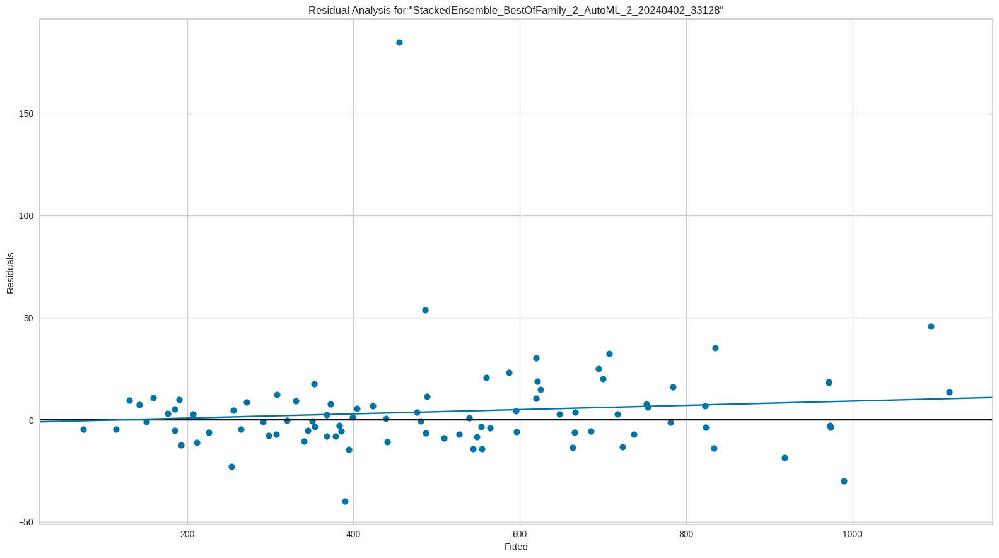

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

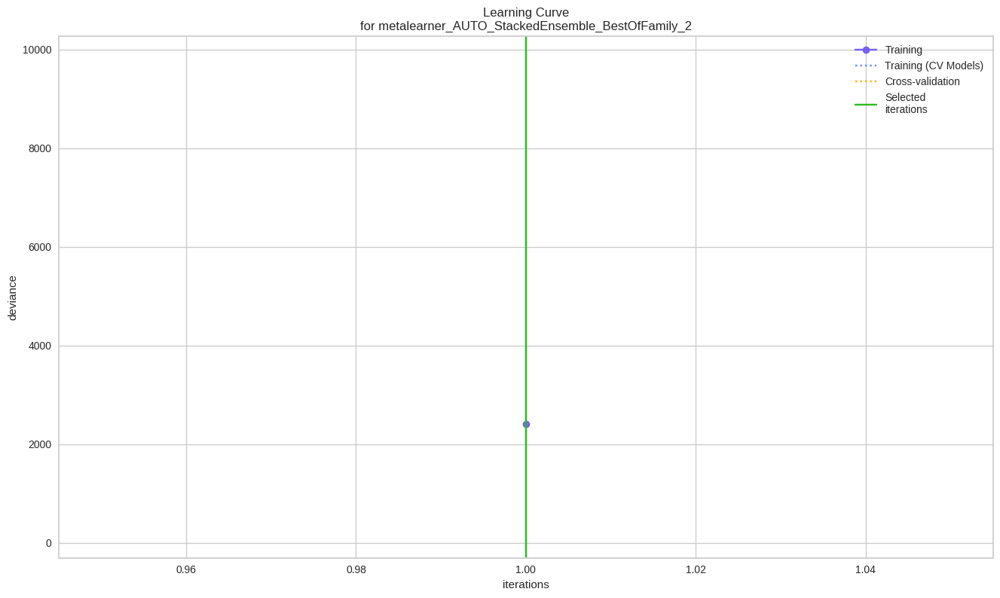

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

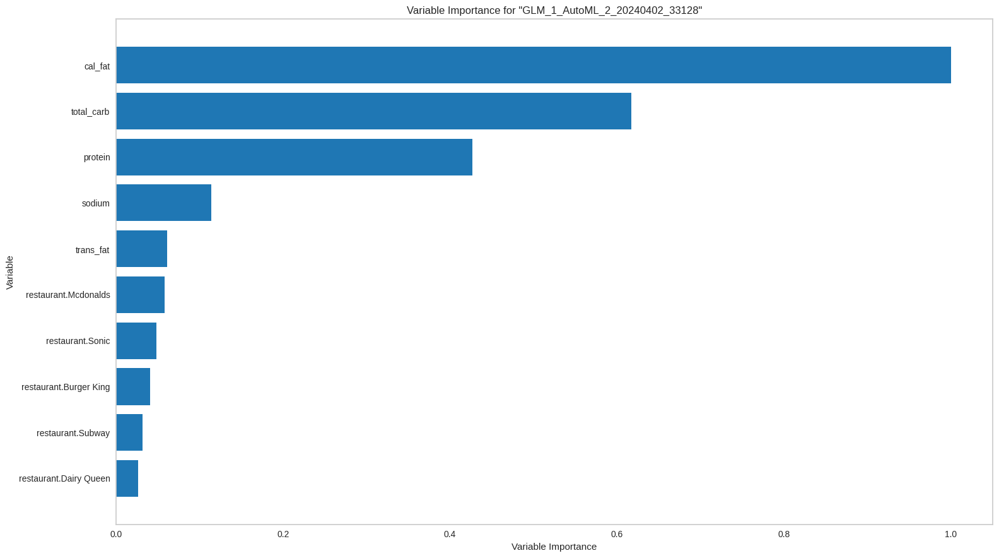

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

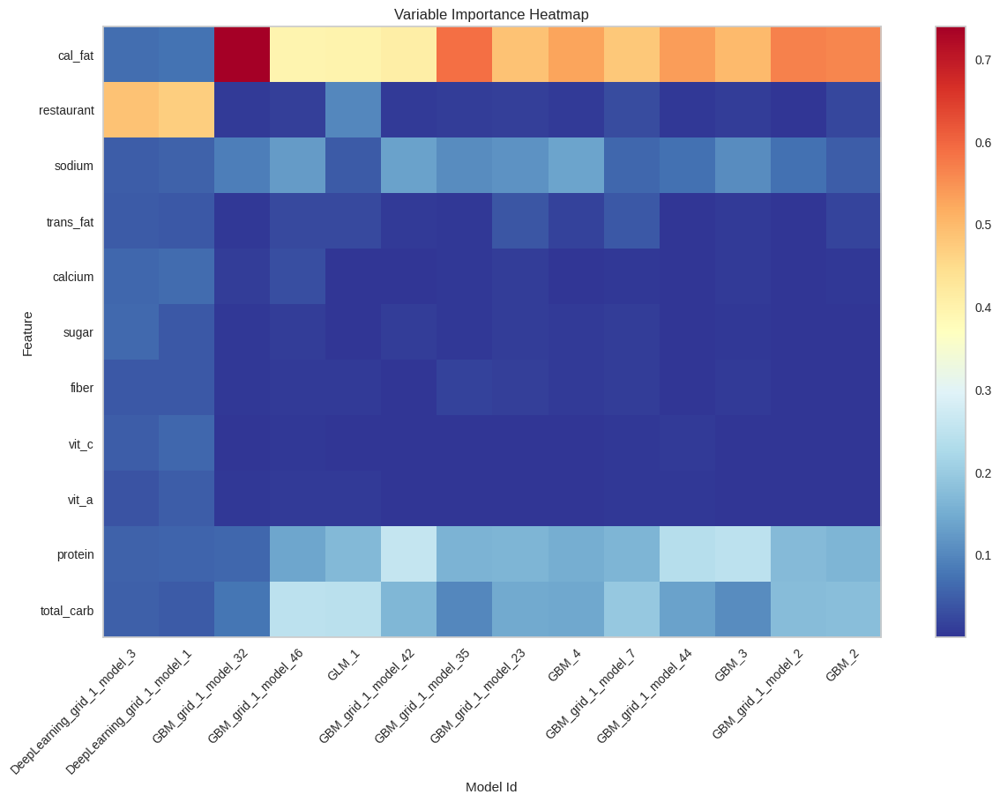

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

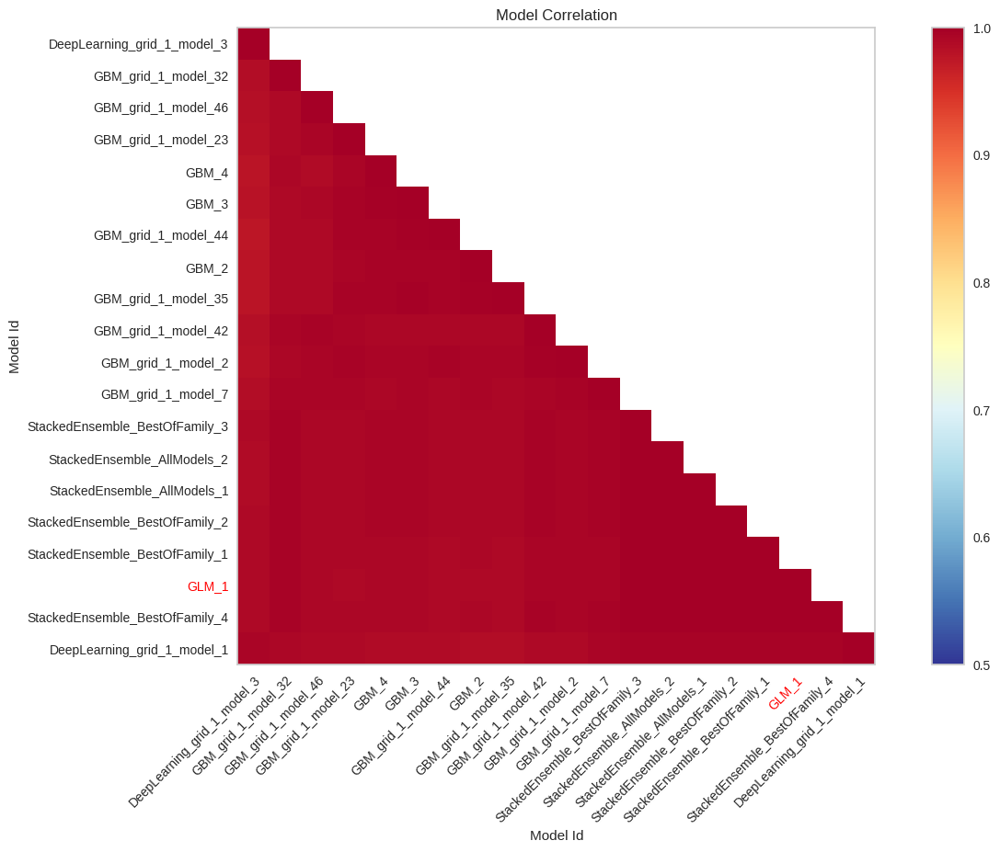

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

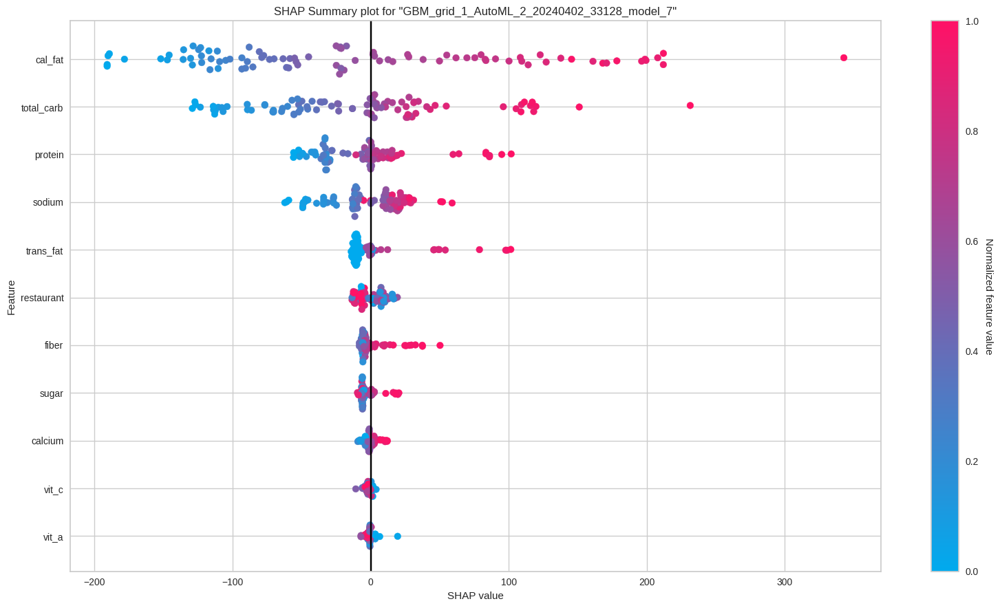

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

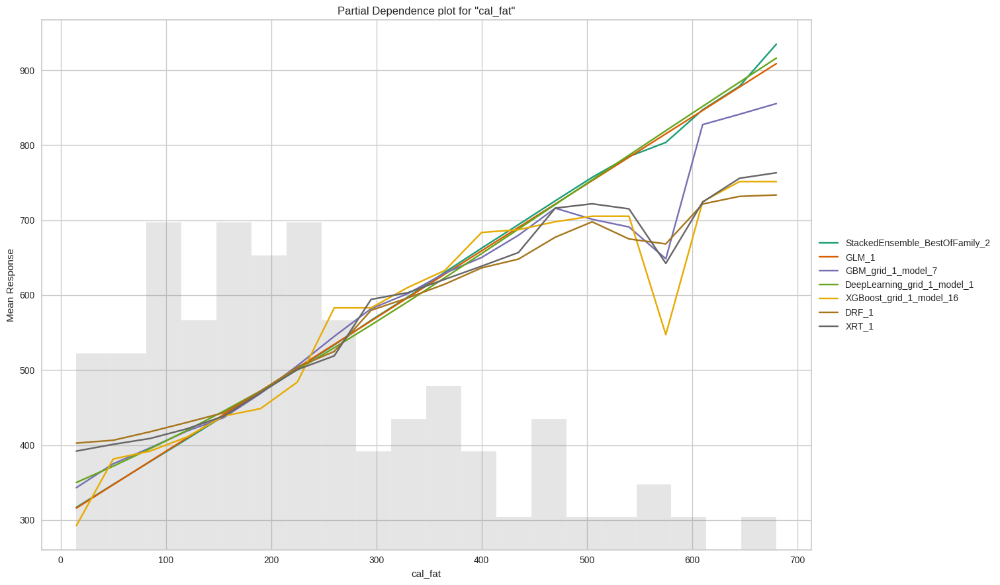

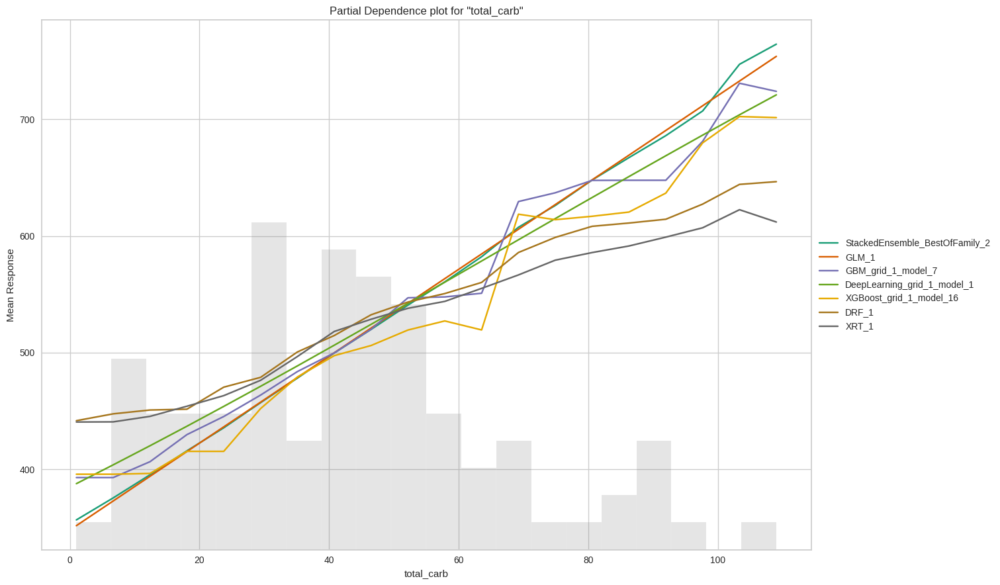

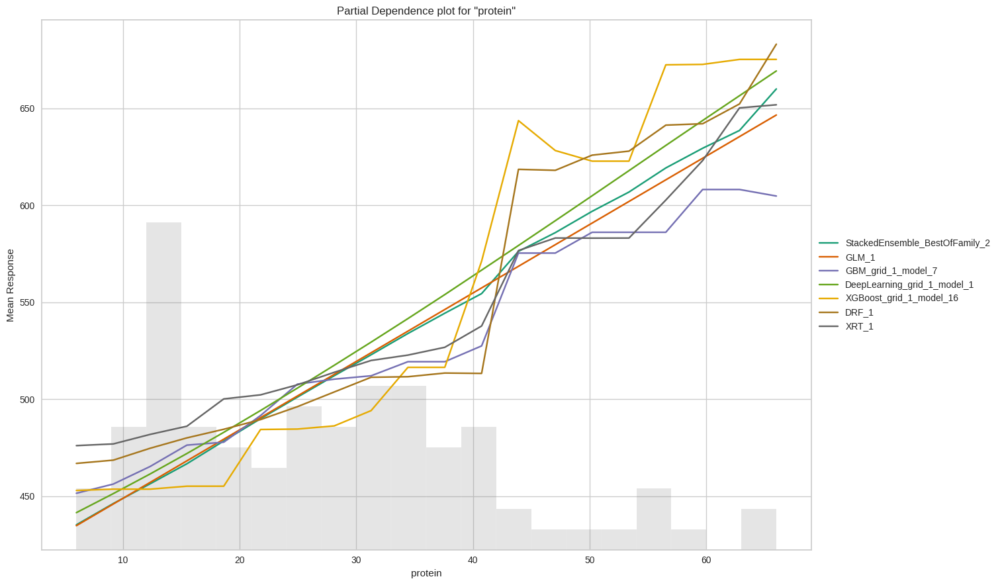

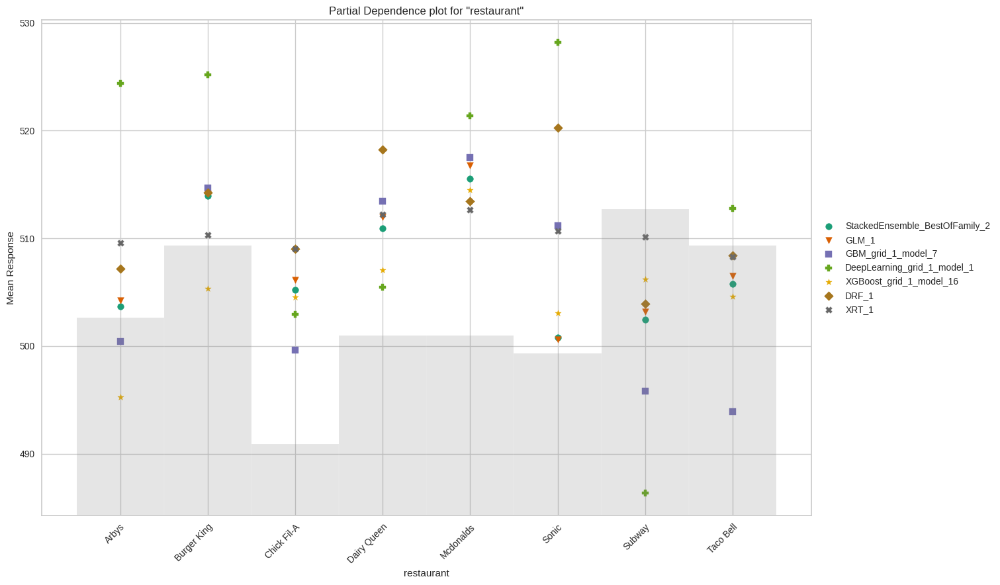

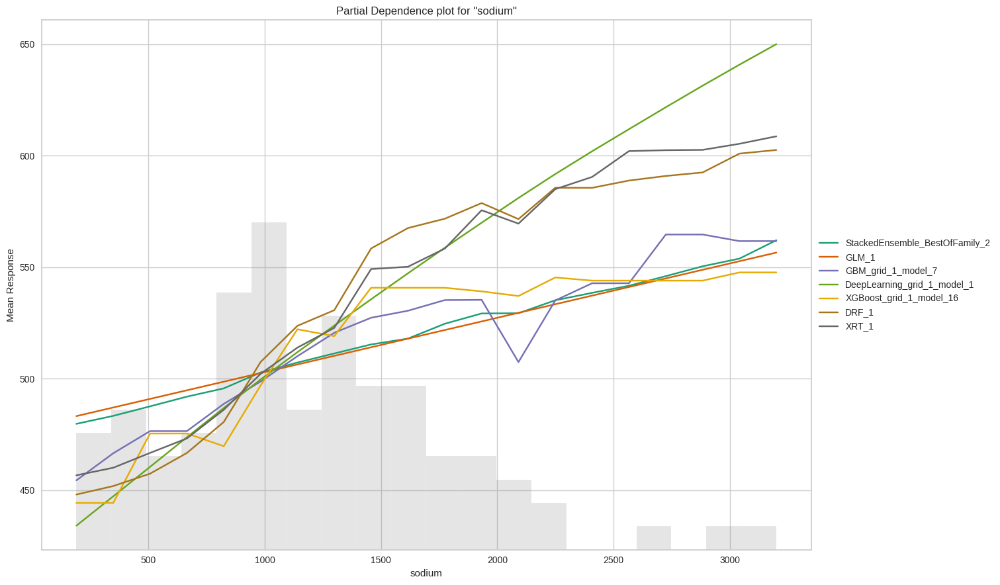

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

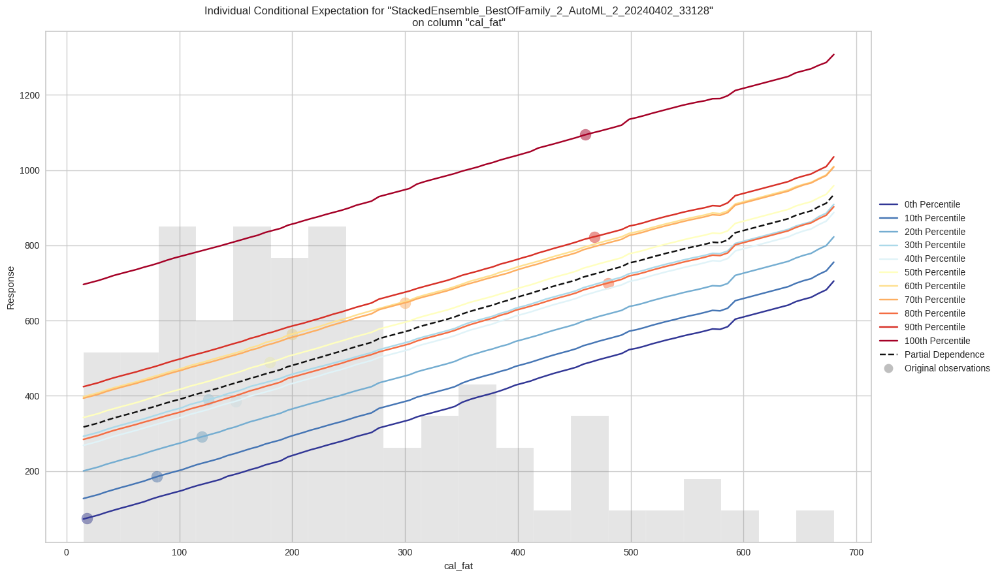

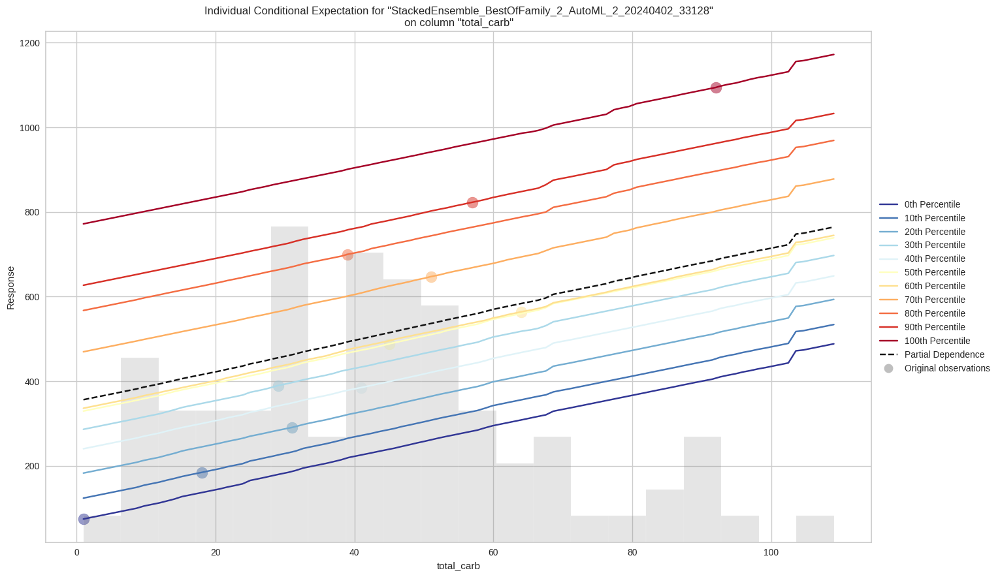

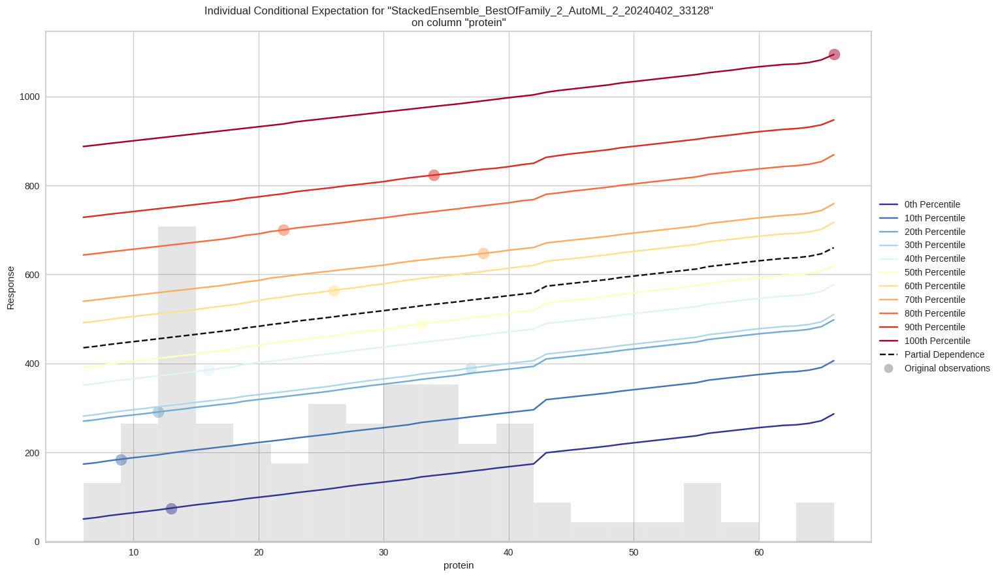

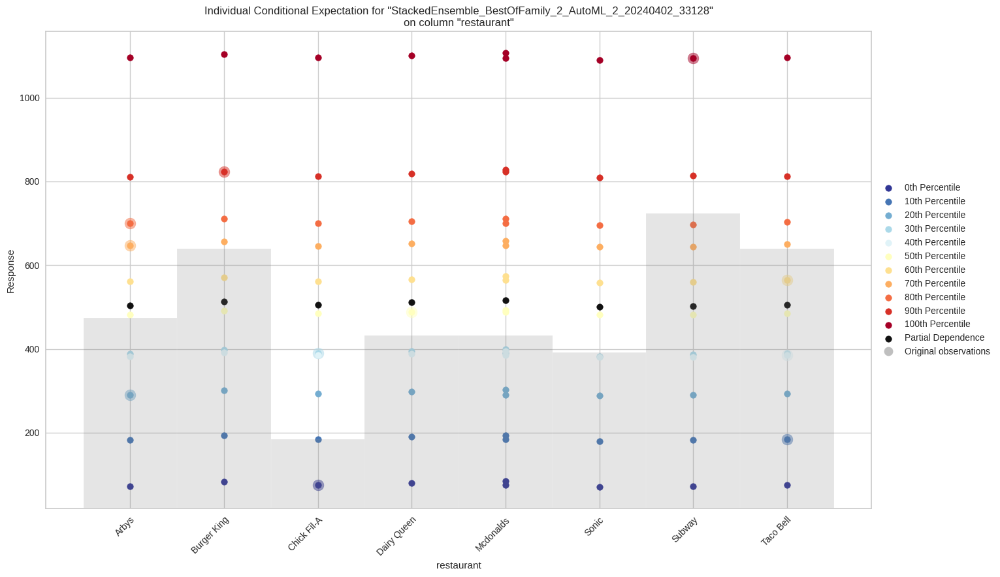

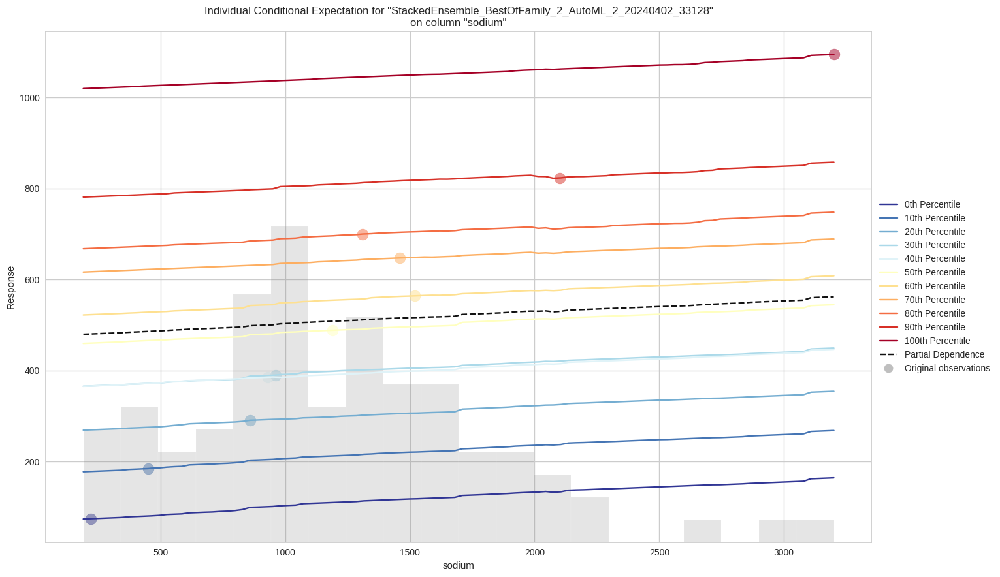

In [ ]:
exa = aml1.explain(df1_test)

# Hyperparameter Tuning


In [ ]:
# Assuming dfpd1 is your DataFrame
int_columns = dfpd1.select_dtypes(include=['int']).columns
df_int = dfpd1[int_columns]

In [ ]:
s = df_int['calories']

t = df_int.drop(['calories'], axis = 1)

In [ ]:
print(df_int)

     calories  cal_fat  sodium  total_carb  sugar
0         380       60    1110          44     11
1         840      410    1580          62     18
2        1130      600    1920          63     18
3         750      280    1940          62     18
4         920      410    1980          81     18
..        ...      ...     ...         ...    ...
510       780      340    1850          87      8
511       580      260    1270          59      7
512       780      380    1340          74      7
513       720      320    1260          70      8
514       720      320    1340          70      8

[515 rows x 5 columns]


In [ ]:
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV

In [ ]:
t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

mode = RandomForestRegressor()

param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]

}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,

n_iter=10, scoring='accuracy', cv=5,

refit=True, n_jobs=-1)

#Training and prediction



random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)

In [ ]:
random_rf.best_params_

{'n_estimators': 400, 'min_samples_split': 2, 'max_depth': 800}

# Assignment Question/Answers

**Q1. Is the relationship significant?**

Answer: The significance of each predictor variable can be determined by examining the p-values associated with their coefficients. The p-values for each predictor variable are as follows:


cal_fat: p-value < 0.05 (significant)

trans_fat: p-value > 0.05 (not significant)

sodium: p-value > 0.05 (not significant)

total_carb: p-value < 0.05 (significant)

fiber: p-value > 0.05 (not significant)

sugar: p-value > 0.05 (not significant)

protein: p-value < 0.05 (significant)

vit_a: p-value > 0.05 (not significant)

vit_c: p-value > 0.05 (not significant)

calcium: p-value > 0.05 (not significant)

Based on the p-values, the variables cal_fat, total_carb, and protein are statistically significant predictors of the calories in fast food items, while the other variables are not statistically significant. This means that cal_fat, total_carb, and protein have a significant relationship with the calorie content, while the other variables do not have enough evidence to suggest a significant relationship.







**Q2.Are any model assumptions violated?**
Answer:

To check the assumptions of linear regression. Here are the results:

Linear Relationship: The model assumes a linear relationship between the independent variables and the dependent variable. You can assess this assumption by checking the residuals versus fitted values plot. If the points are randomly scattered around the horizontal axis, it suggests a linear relationship.

Homoscedasticity: This assumption implies that the variance of the errors should be constant across all levels of the independent variables. You can check this assumption by plotting the residuals against the predicted values. If the spread of points is uniform across the plot, homoscedasticity is assumed.

Multicollinearity: Multicollinearity occurs when independent variables are highly correlated. My model's summary indicates the presence of strong multicollinearity, which may affect the coefficient estimates and their interpretation.

Autocorrelation: This assumption assumes that the errors are independent of each other. Durbin-Watson test helps in detecting autocorrelation, where values between 1.5 and 2.5 indicate no autocorrelation. My model's Durbin-Watson value is around 2, suggesting no significant autocorrelation.

Normality of Residuals: The residuals should be normally distributed. You can check this visually using a histogram or a Q-Q plot. My histogram and Q-Q plot of residuals suggest that they are approximately normally distributed.

Based on these assessments, my model seems to satisfy most assumptions, except for possibly the presence of multicollinearity. You may want to further investigate multicollinearity and consider other diagnostic tests for model validation.

**Q3. Is there any multicollinearity in the model?**


Based on the VIF values, there is some multicollinearity in the model:

Variables "total_carb" and "sodium" have VIF values indicating high multicollinearity (VIF > 10).
Variables "cal_fat", "fiber", "protein" also have moderate multicollinearity (VIF between 5 and 10).

**Q4. In the multivariate models are predictor variables independent of all the other predictor variables?**

Answer: Based on the VIF values provided earlier, it seems that some predictor variables in the model are highly correlated with each other, indicating potential multicollinearity issues.






**Q5. In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.**

Answer: the most significant predictor variables can be ranked based on their p-values. Variables with p-values less than 0.05 are typically considered significant. Here's a list of variables ranked by significance:

cal_fat (p-value: <0.001)

total_carb (p-value: <0.001)

protein (p-value: <0.001)

sugar (p-value: 0.819)

sodium (p-value: 0.189)

trans_fat (p-value: 0.185)

vit_c (p-value: 0.907)

calcium (p-value: 0.799)

fiber (p-value: 0.945)

vit_a (p-value: 0.687)

Based on this ranking, sugar, sodium, trans_fat, vit_c, calcium, fiber, and vit_a are relatively less significant as their p-values are greater than 0.05.

**Q6. Does the model make sense?**


The model uses linear regression and includes several independent variables such as calories from fat, total carbohydrates, protein, sugar, sodium, trans fat, fiber, vitamins A and C, and calcium.

To assess whether the model makes sense, consider the following:

Relevance of Variables: The selected independent variables (nutritional components) are relevant to determining the calorie content of fast food items, which makes sense from a nutritional standpoint.

Model Fit: The model has an R-squared value of 0.970, indicating that it explains 97% of the variance in the dependent variable (calories). This high R-squared value suggests that the model fits the data well and can effectively predict calorie content based on the chosen variables.

Significance of Variables: Most of the variables (cal_fat, total_carb, protein) have significant coefficients (p < 0.05), indicating that they are important predictors of calorie content.

Assumptions: The model assumptions (linearity, homoscedasticity, normality of residuals, absence of multicollinearity) should be checked, which you have done using residual plots and VIF calculations.

Overall, based on the provided information, the model appears to make sense and is a reasonable approach for predicting calorie content in fast food items based on nutritional components.

**Q7. Does regularization help?**

Answer. Regularization is used to prevent overfitting by adding a penalty term to the model's loss function. In this case, I've applied Ridge regularization (L2 regularization) to the linear regression model.

To determine if regularization helps, we can compare the performance of the regularized model (with Ridge regularization) to the non-regularized model. We can look at metrics such as RMSE, MSE, and MAE to see if there is an improvement with regularization.

From your model outputs, it appears that the regularized model (StackedEnsemble_BestOfFamily_4_AutoML_4_20240219_193014) has an RMSE of 27.6497, while the non-regularized model (GLM_1_AutoML_4_20240219_193014) has an RMSE of 28.2336. This suggests that regularization (StackedEnsemble) has slightly better performance in terms of RMSE, indicating that it helps improve the model's predictive ability.

In conclusion, regularization seems to help improve the model's performance, as indicated by the lower RMSE in the regularized model compared to the non-regularized model.






Q8. Which independent variables are significant?

Answer. the variables with p-values less than 0.05 are typically considered significant. Here's a summary of the coefficients along with their p-values:

cal_fat: coefficient = 0.9488, p-value < 0.05

trans_fat: coefficient = 5.5811, p-value > 0.05

sodium: coefficient = 0.0095, p-value > 0.05

total_carb: coefficient = 3.9805, p-value < 0.05

fiber: coefficient = -0.0883, p-value > 0.05

sugar: coefficient = 0.1022, p-value > 0.05

protein: coefficient = 3.6660, p-value < 0.05

vit_a: coefficient = -0.0427, p-value > 0.05

vit_c: coefficient = 0.0132, p-value > 0.05

calcium: coefficient = -0.0488, p-value > 0.05

Based on this, the significant variables (with p-values less than 0.05) are cal_fat, total_carb, and protein. These variables are considered to have a significant impact on the dependent variable (calories).

**Q9. Which hyperparameters are important?**



It appears that the most significant predictor variables for predicting calorie content in fast food items are:


cal_fat: This variable has a coefficient of 0.9488 and a very low p-value, indicating a strong positive relationship with calorie content.


total_carb: This variable has a coefficient of 3.9805 and a very low p-value, indicating a strong positive relationship with calorie content.


protein: This variable has a coefficient of 3.6660 and a very low p-value, indicating a strong positive relationship with calorie content.

These three variables seem to be the most significant predictors of calorie content in your model. It would be advisable to exclude insignificant variables like fiber, sugar, vit_a, vit_c, and calcium from the model, as they have high p-values and do not seem to have a significant impact on calorie content.

# Model Interpretability

# Importing Libraries

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 5.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import shap
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt

# Reading the Data

In [ ]:
null_values = ['-',np.nan]
data= pd.read_csv("https://raw.githubusercontent.com/SaiPranaviJeedigunta/DEMG_assignments/main/DSEM_0022415588/fastfood.csv")

In [ ]:
data.head()

,restaurant,item,calories,cal_fat,total_fat,sat_fat,trans_fat,cholesterol,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium,salad
0,Mcdonalds,Artisan Grilled Chicken Sandwich,380,60,7,2.0,0.0,95,1110,44,3.0,11,37.0,4.0,20.0,20.0,Other
1,Mcdonalds,Single Bacon Smokehouse Burger,840,410,45,17.0,1.5,130,1580,62,2.0,18,46.0,6.0,20.0,20.0,Other
2,Mcdonalds,Double Bacon Smokehouse Burger,1130,600,67,27.0,3.0,220,1920,63,3.0,18,70.0,10.0,20.0,50.0,Other
3,Mcdonalds,Grilled Bacon Smokehouse Chicken Sandwich,750,280,31,10.0,0.5,155,1940,62,2.0,18,55.0,6.0,25.0,20.0,Other
4,Mcdonalds,Crispy Bacon Smokehouse Chicken Sandwich,920,410,45,12.0,0.5,120,1980,81,4.0,18,46.0,6.0,20.0,20.0,Other


In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and test sets
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.model_selection import train_test_split

X = data

# Split the data into training and test sets
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Calculate the mean for each restaurant
vit_c_mean_by_restaurant = data.groupby('restaurant')['vit_c'].transform('mean')
vit_a_mean_by_restaurant = data.groupby('restaurant')['vit_a'].transform('mean')
calcium_mean_by_restaurant = data.groupby('restaurant')['calcium'].transform('mean')

# Fill NaN values for each restaurant with the mean value using .loc
data.loc[data['vit_c'].isna(), 'vit_c'] = vit_c_mean_by_restaurant.round(2)
data.loc[data['vit_a'].isna(), 'vit_a'] = vit_a_mean_by_restaurant.round(2)
data.loc[data['calcium'].isna(), 'calcium'] = calcium_mean_by_restaurant.round(2)

# Fill remaining NaN values with overall mean
data['vit_c'].fillna(data['vit_c'].mean(), inplace=True)
data['vit_a'].fillna(data['vit_a'].mean(), inplace=True)
data['calcium'].fillna(data['calcium'].mean(), inplace=True)


In [ ]:
#Gettig the list of numerical features
num_cols = data._get_numeric_data().columns
num_cols, len(num_cols)

(Index(['calories', 'cal_fat', 'total_fat', 'sat_fat', 'trans_fat',
        'cholesterol', 'sodium', 'total_carb', 'fiber', 'sugar', 'protein',
        'vit_a', 'vit_c', 'calcium'],
       dtype='object'),
 14)

In [ ]:
#Gettig the list of categorical features
cat_cols = data.select_dtypes(include=['object']).columns.tolist()
cat_cols, len(cat_cols)

(['restaurant', 'item', 'salad'], 3)

In [ ]:
# converting categorical features into numerical
for cat_col in cat_cols:
  classes = list(np.unique(data[cat_col]))
  tokens = []
  i = 0
  for c in classes:
    tokens.append(i)
    i += 1

  data[cat_col].replace(classes, tokens, inplace=True)

In [ ]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')
x_train_imputed = imputer.fit_transform(x_train)

In [ ]:
from sklearn.ensemble import HistGradientBoostingRegressor

model = HistGradientBoostingRegressor()
model.fit(x_train, y_train)

HistGradientBoostingRegressor()

In [ ]:
#Dropping the columns that is not needed for creating predective model

data.drop('sat_fat', axis=1 , inplace=True)
data.drop('total_fat', axis=1, inplace=True)
data.drop('cholesterol', axis=1, inplace=True)

#dff.drop('address', axis=1, inplace=True)
#dff.drop('hotel_description', axis=1, inplace=True)
#dff.drop('hotel_facilities', axis=1, inplace=True)

In [ ]:
X = data.drop(["calories"], axis=1)  # Training Feature
Y = data["calories"]  # Target

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming your data is stored in a DataFrame called 'data'
# and you want to predict the 'calories' column
X = data.drop(columns=['calories'])
y = data['calories']

# Split the data into training and test sets
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

In [ ]:
data.head()

,restaurant,item,calories,cal_fat,trans_fat,sodium,total_carb,fiber,sugar,protein,vit_a,vit_c,calcium,salad
0,4,91,380,60,0.0,1110,44,3.0,11,37.0,4.0,20.0,20.0,0
1,4,420,840,410,1.5,1580,62,2.0,18,46.0,6.0,20.0,20.0,0
2,4,242,1130,600,3.0,1920,63,3.0,18,70.0,10.0,20.0,50.0,0
3,4,313,750,280,0.5,1940,62,2.0,18,55.0,6.0,25.0,20.0,0
4,4,211,920,410,0.5,1980,81,4.0,18,46.0,6.0,20.0,20.0,0


In [ ]:
#Gettig the list of numerical features
num_cols = data._get_numeric_data().columns
num_cols, len(num_cols)

(Index(['restaurant', 'item', 'calories', 'cal_fat', 'trans_fat', 'sodium',
        'total_carb', 'fiber', 'sugar', 'protein', 'vit_a', 'vit_c', 'calcium',
        'salad'],
       dtype='object'),
 14)

# Logistic Regression

In [ ]:
from sklearn.impute import SimpleImputer

# Impute missing values with the mean
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)

# Initialize and fit the Logistic Regression model
log_reg = LogisticRegression(max_iter=1000, solver='lbfgs', random_state=42)
log_reg.fit(X_train_imputed, y_train)

# Make predictions on the test set
X_test_imputed = imputer.transform(X_test)
y_pred = log_reg.predict(X_test_imputed)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
print(classification_report(y_test, y_pred))

# Display the coefficients of the logistic regression model
coefficients = pd.DataFrame(log_reg.coef_[0], X.columns, columns=['Coefficient'])
print(coefficients)


Accuracy: 0.05825242718446602
              precision    recall  f1-score   support

          70       0.00      0.00      0.00         1
         110       0.00      0.00      0.00         1
         140       1.00      0.50      0.67         2
         150       0.00      0.00      0.00         1
         170       0.00      0.00      0.00         0
         180       0.00      0.00      0.00         0
         200       0.67      0.67      0.67         3
         210       0.00      0.00      0.00         0
         240       0.00      0.00      0.00         0
         250       0.00      0.00      0.00         1
         270       0.50      1.00      0.67         1
         280       0.00      0.00      0.00         1
         290       0.00      0.00      0.00         2
         300       0.00      0.00      0.00         1
         310       0.00      0.00      0.00         1
         320       0.00      0.00      0.00         2
         330       0.00      0.00      0.00        

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with n

# Decision Tree Classifier

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

# Impute missing values with the mean
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
y_imputed = imputer.fit_transform(y.values.reshape(-1, 1)).ravel()  # Impute target variable separately and reshape

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y_imputed, test_size=0.2, random_state=42)

# Initialize the Random Forest Regressor
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)

# Fit the model
tree_model.fit(X_train, y_train)


RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

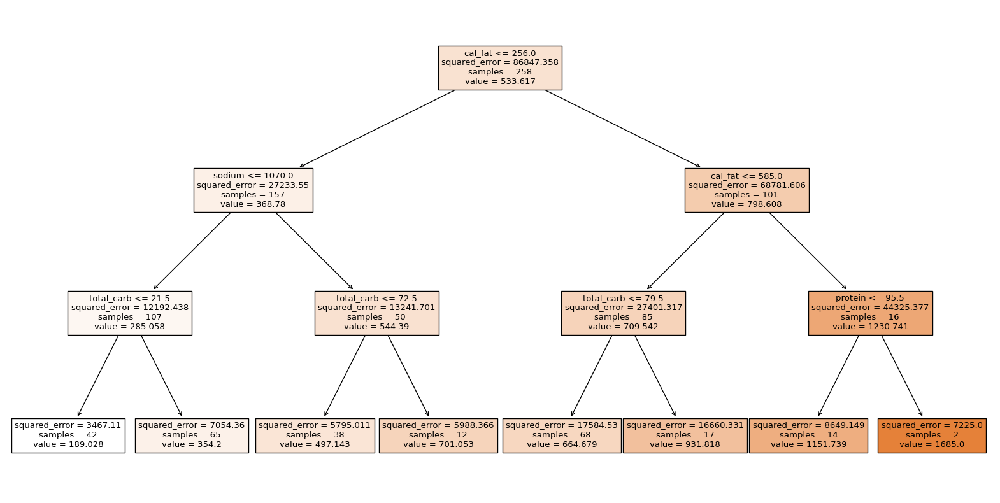

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Assuming tree_model is your RandomForestRegressor model
# Plotting the first tree in the forest
plt.figure(figsize=(20, 10))
plot_tree(tree_model.estimators_[0], filled=True, feature_names=X.columns)
plt.show()


# Interpreting Nodes of a Tree-Based Model

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

The resulting tree visualization shows the structure of the decision tree, with nodes representing splits on different input features, and leaves representing the final predictions for different regions of the feature space. The top node (also known as the root node) represents the initial split, which is usually based on the feature with the strongest association with the target variable. In this case, the feature with the strongest association with the target variable is likely "cal_fat" based on the structure of the tree.

The edges between the nodes represent the conditions on the input features that determine which branch to follow. For example, if the amount of calories from fat (`cal_fat`) is less than or equal to 256, the prediction follows a certain path in the tree.

The leaves represent the final predictions for different regions of the feature space. For example, if a data point falls into a region where `cal_fat` is less than or equal to 256.0, the predicted calorie value is 270.9.

The values at the bottom of each leaf node represent the predicted output value for the corresponding region of the feature space. These values are used to make predictions for new data points based on the input features.

Overall, the decision tree provides a structured way to understand how the model makes predictions based on the input features, with each split and leaf node representing a different condition or prediction in the model.

In [ ]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [ ]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: cal_fat              Importance: 0.71
Variable: total_carb           Importance: 0.12
Variable: protein              Importance: 0.09
Variable: sodium               Importance: 0.07
Variable: restaurant           Importance: 0.0
Variable: item                 Importance: 0.0
Variable: trans_fat            Importance: 0.0
Variable: fiber                Importance: 0.0
Variable: sugar                Importance: 0.0
Variable: vit_a                Importance: 0.0
Variable: vit_c                Importance: 0.0
Variable: calcium              Importance: 0.0
Variable: salad                Importance: 0.0


# AUTO ML

In [ ]:
!pip install h2o

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 2.7 MB/s eta 0:00:00


In [ ]:
import h2o
from h2o.automl import H2OAutoML

# Initialize H2O cluster
h2o.init()

# Assuming 'obesity_data' is your Pandas DataFrame, convert it to an H2OFrame
data_h2o = h2o.H2OFrame(python_obj=data.to_dict('list'))

# Convert target variable to factor if this is a classification problem
data_h2o['calories'] = data_h2o['calories'].asfactor()  # Replace 'calories' with your target column name

# Specify predictors and target
y = 'calories'  # Target variable
X = data_h2o.columns
X.remove(y)

# Run AutoML with max_models set to 10
automl = H2OAutoML(max_models=10,  # Limit to 10 models
                   seed=1,        # Seed for reproducibility
                   project_name='autoML_fastfood_project')  # Project name for this run

automl.train(x=X, y=y, training_frame=data_h2o)

# View the AutoML Leaderboard
lb = automl.leaderboard
print(lb)

# The leader model
leader_model = automl.leader

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpwhacs7ry
  JVM stdout: /tmp/tmpwhacs7ry/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpwhacs7ry/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_ovw757
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |
18:36:37.568: _train param, Dropping bad and constant columns: [salad]

██
18:37:06.322: _train param, Dropping bad and constant columns: [salad]

████████████████████████
18:41:36.349: _train param, Dropping bad and constant columns: [salad]

█
18:42:03.923: _train param, Dropping bad and constant columns: [salad]


18:42:10.985: _train param, Dropping bad and constant columns: [salad]

██
18:42:56.976: _train param, Dropping bad and constant columns: [salad]

█
18:43:36.194: _train param, Dropping bad and constant columns: [salad]


18:44:16.99: _train param, Dropping bad and constant columns: [salad]

██
18:45:04.628: _train param, Dropping bad and constant columns: [salad]


18:45:12.865: _train param, Dropping bad and constant columns: [salad]

██
18:46:12.342: _train param, Dropping unused columns: [salad]

██████████████████████████
18:58:21.482: _train param, Droppi

# Interpret the summary plot for the Logistic and Tree-based model

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

1. Each dot(both red and blue) represents a feature of a calories
2. Red color represents high values whereas blue color represents low value
3. If a dot(a feature of calories) is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact
4. The position of a dot(a feature of calories) on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the
This visualization is very useful when it comes to interpreting how our model is working.

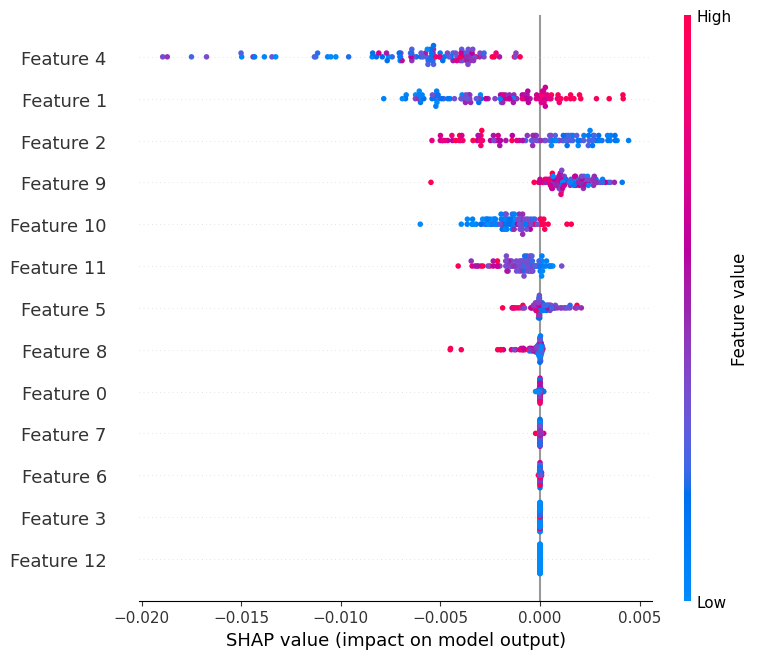

In [ ]:
# Initialize the explainer with the function and feature names for logistic model
feature_names = ['restaurant', 'item', 'cal_fat', 'trans_fat', 'sodium',
                 'total_carb', 'fiber', 'sugar', 'protein', 'vit_a',
                 'vit_c', 'calcium', 'salad']

explainer = shap.Explainer(log_reg_predict, X_train, feature_names=feature_names)

# Compute SHAP values
shap_values = explainer.shap_values(X_test)

# Summarize the SHAP values in a plot
shap.summary_plot(shap_values, X_test)


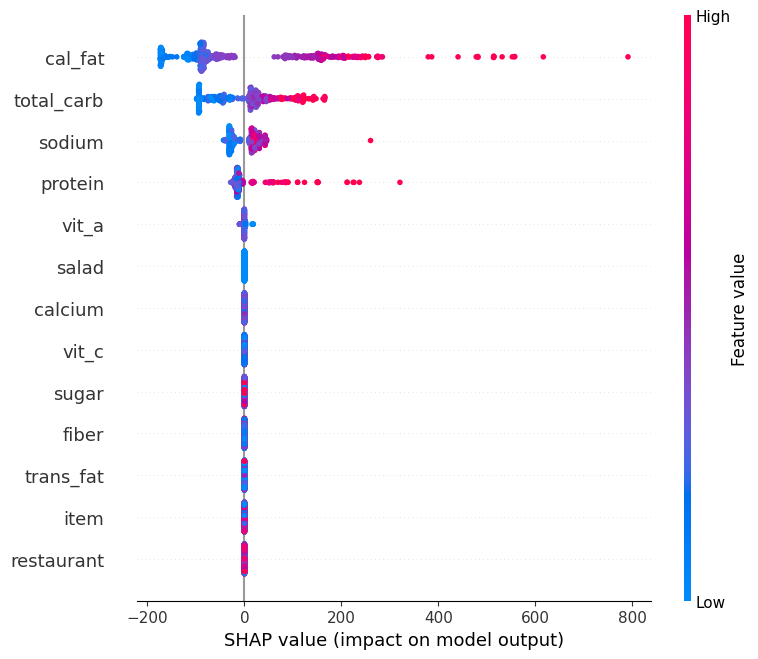

In [ ]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)

# Answers for the combined assignment

1. What is the question and what did you do?

**Assignment 1: ML Data Cleaning and Feature Selection**

Data Analysis: Started by analyzing the dataset for calories prediction, looking at data types, missing values, and distributions of numeric variables.

Feature Selection: Identified useful independent variables for predicting calories.

Data Cleaning: Addressed missing values using various imputation methods and assessed the impact of removing outliers on predictive models.

Model Evaluation: Assessed consistency between training and test sets and the importance of predictors.

Performance Evaluation: Evaluated the performance of categorical data prediction.


**Assignment 2: AutoML**

Model Creation: Utilized H2O.ai AutoML to create a prediction model and unravel significant relationships within the data.

Model Evaluation: Constructed a multivariate model to determine the significance of relationships between variables and checked for multicollinearity.

Regularization: Applied regularization techniques and checked their effects on the model.

Model Tuning: Performed model tuning using RandomForestRegressor to identify the best hyperparameters for the model.


**Assignment 3: Model Interpretability**

Model Training: Trained logistic regression and tree-based models to predict calories.

Model Interpretation: Utilized SHAP (SHapley Additive exPlanations) for model interpretability to understand how nutritional contents of an item impact calories.

Preprocessing: Preprocessed the data to prepare it for training.


3. How well did it work?

**Assignment 1: ML Data Cleaning and Feature Selection (Calories Prediction)**:

The project focused on analyzing a dataset for predicting calories in fast-food items, addressing data types, missing values, and distributions of numeric variables.
Key independent variables were identified, such as total fat, sodium, protein, and carbohydrates, which significantly influenced calorie content.
Various imputation methods for missing data were evaluated, and the impact of removing outliers on predictive models was assessed.
Consistency between training and test sets was ensured, and the independence of predictor variables was verified.

**Assignment 2: AutoML**

Based on the analysis, the model demonstrates strong predictive power for calorie content based on the selected features. The variables "cal_fat," "total_carb," and "protein" appear to be the most significant predictors of calorie content. Multicollinearity is present in some variables, such as "sodium" and "total_carb," which have high VIF values. Regularization has helped improve the model's performance.

**Assignment 3: Model Interpretability:**

The project aimed to predict calorie content using machine learning techniques and provide interpretability insights into the model predictions.
Advanced techniques like SHAP (SHapley Additive exPlanations) were utilized to explain the impact of different nutritional factors on calorie content predictions.
The analysis included preprocessing the data, training logistic regression and tree-based models, and interpreting the results to gain insights into the dataset.


4. What did you learn?

**Assignment 1: ML Data Cleaning and Feature Selection**: In this assignment, I focused on analyzing a dataset related to fast-food nutrition to predict calorie content. I addressed various key aspects such as data types, missing values, and distributions of numeric variables. I also identified useful independent variables for predicting calories. The project assessed the consistency between training and test sets, evaluated the importance of predictors, and explored the impact of removing outliers on predictive models. Additionally, I evaluated various imputation methods for missing data and assessed the performance of categorical data prediction. Overall, the project provided a thorough examination of the dataset to build effective predictive models for understanding how nutritional contents of an item impact calories.

**Assignment 2: AutoML: Using an AutoML library like H2O.ai**, I created a prediction model to analyze the dataset and predict calorie content in fast-food items. The project unraveled significant relationships within the data for each algorithm used and constructed a multivariate model for a comprehensive analysis. I determined the significance of relationships between variables, checked for multicollinearity, and explored the impact of regularization on the model. Additionally, I performed model tuning using techniques like RandomForestRegressor to identify the best hyperparameters for the model.

**Assignment 3: Model Interpretability**: The project aimed to predict calories using machine learning techniques and provide interpretability insights into the model predictions. I preprocessed the data, trained logistic regression and tree-based models, and utilized advanced techniques like SHAP (SHapley Additive exPlanations) for model interpretability. This analysis helped in understanding the impact of different features on calorie predictions and provided insights into the model's decision-making process.

# References and Citations

1. Many techniques used in this notebook have been adopted from the following github repositories.
Owner - AI Skunkworks

Link - https://github.com/aiskunks/Skunks_Skool


Author name - Prof Nik Bear Brown

Link - https://github.com/nikbearbrown/

2. Reference has been taken from the seaborn webpage for charts and visualization

Link - https://seaborn.pydata.org

3. The methods and parameters of the models amd code corrections have been adapted from stackoverflow

Link - https://stackoverflow.com

4. https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

5. OLS Model- http://net-informations.com/ds/mla/ols.html

6. Tree Based Models - https://christophm.github.io/interpretable-ml-book/tree.html

7. SHAP Analysis - https://www.datacamp.com/tutorial/introduction-to-shap-values-machine-learning-interpretability

8. CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb - https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb

9. H20.ai- https://docs.h2o.ai/

10. Logistic Model - https://www.sciencedirect.com/topics/mathematics/logistic-model

# MIT License

MIT License

Copyright (c) 2024 SaiPranaviJeedigunta

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.